#Project :Image Forgery Detection
##Notebook 2
###Simple Models (Feature Extraction)
Mansi Patel
Megha Mathpal

In [0]:
!apt-get -qq install -y libsm6 libxext6 && pip install -q -U opencv-python

    100% |████████████████████████████████| 26.6MB 1.8MB/s 
albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.8 which is incompatible.


#Loading Database

In [0]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
#from google.colab import drive
from imageio import imread
from pylab import rcParams
import pickle
# Accessing My Google Drive
#drive.mount('/content/drive')

In [0]:
# defining global variable path
# Location of my dataset on My Google Drive
image_path = "dataset-dist/phase-01/training/"
import tensorflow as tf

def loadImages(path,folder):
    '''Put files into lists and return them as one list with all images 
     in the folder'''
    image_files = sorted([os.path.join(path,folder, file)
                          for file in os.listdir(path+folder+"/")
                          if file.endswith('.png')])
    return image_files


In [0]:
def display_one(a):
    plt.imshow(a)
    plt.xticks([]), plt.yticks([])
    plt.show()
def display(a, b, title1 = "", title2 = ""):
    plt.subplot(121), plt.imshow(a,cmap='gray'), plt.title(title1)
    plt.xticks([]), plt.yticks([])
    plt.subplot(122), plt.imshow(b,cmap='gray'), plt.title(title2)
    plt.xticks([]), plt.yticks([])
    plt.show()

In [0]:
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Plot a confusion matrix.
# cm is the confusion matrix, names are the names of the classes.
def plot_confusion_matrix(cm, names, title='Confusion matrix', cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(names))
    plt.xticks(tick_marks, names, rotation=45)
    plt.yticks(tick_marks, names)
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    

# Plot an ROC. pred - the predictions, y - the expected output.
def plot_roc(pred,y):
    fpr, tpr, thresholds = roc_curve(y, pred)
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)')
    plt.legend(loc="lower right")
    plt.show()

In [0]:
def chart_regression(pred,y,sort=True):
    t = pd.DataFrame({'pred' : pred, 'y' : y.flatten()})
    if sort:
        t.sort_values(by=['y'],inplace=True)
    a = plt.plot(t['y'].tolist(),label='expected')
    b = plt.plot(t['pred'].tolist(),label='prediction')
    plt.ylabel('output')
    plt.legend()
    plt.show()


In [0]:
fakeimage = loadImages(image_path,'fake')
pristineimage = loadImages(image_path,'pristine')

##initial data shape

In [0]:
print("fake images",len(fakeimage))
print("pristine images",len(pristineimage))

fake images 900
pristine images 1050


In [0]:
fakeimage[0:10]

['dataset-dist/phase-01/training/fake\\010543abfbd0db1e9aa1b24604336e0c.mask.png',
 'dataset-dist/phase-01/training/fake\\010543abfbd0db1e9aa1b24604336e0c.png',
 'dataset-dist/phase-01/training/fake\\022354380a1a17ff49226c9eae21a11f.mask.png',
 'dataset-dist/phase-01/training/fake\\022354380a1a17ff49226c9eae21a11f.png',
 'dataset-dist/phase-01/training/fake\\0294345b3b2324b195cb3b30e91d7678.mask.png',
 'dataset-dist/phase-01/training/fake\\0294345b3b2324b195cb3b30e91d7678.png',
 'dataset-dist/phase-01/training/fake\\0363353570f16ff0a73aa0a03a7795b8.mask.png',
 'dataset-dist/phase-01/training/fake\\0363353570f16ff0a73aa0a03a7795b8.png',
 'dataset-dist/phase-01/training/fake\\0830004e471e511458600f0763ce19f3.mask.png',
 'dataset-dist/phase-01/training/fake\\0830004e471e511458600f0763ce19f3.png']

In [0]:
pristineimage[0:10]

['dataset-dist/phase-01/training/pristine\\0001d52e2fd94f30c2bca0449763a752.png',
 'dataset-dist/phase-01/training/pristine\\000bc3906100ede4b1374cea075adedb.png',
 'dataset-dist/phase-01/training/pristine\\002e23c036a05de656242f5ce6ab2e15.png',
 'dataset-dist/phase-01/training/pristine\\003f2d6e572e2587ffa809f78ff4a5c4.png',
 'dataset-dist/phase-01/training/pristine\\00d56bffe2d757a4e4625cc2d0bd0de9.png',
 'dataset-dist/phase-01/training/pristine\\00dd93f9e4af553929e54e66c2a3186e.png',
 'dataset-dist/phase-01/training/pristine\\00dffa8cb9db22527454bfa3c03b484b.png',
 'dataset-dist/phase-01/training/pristine\\00e079b66d9e9f99892bbb81d9d6cd57.png',
 'dataset-dist/phase-01/training/pristine\\00e3659be9c1fec47c739f79252840e3.png',
 'dataset-dist/phase-01/training/pristine\\00ec0ffe0cd029ad4551680484a007d7.png']

##separate the masks

In [0]:
import shutil
# segregate masks from fake images
if not os.path.isdir(image_path+'fake/masks/'):
    os.mkdir(image_path+'fake/masks/')
    for fake in fakeimage:
        if fake.endswith('.mask.png'):
            shutil.move(fake, image_path+'fake/masks/')
else:
    print('Segregated already')

##final data shape

In [0]:
fakeimage = loadImages(image_path,'fake')
pristineimage = loadImages(image_path,'pristine')
masks = loadImages(image_path,'fake/masks')

In [0]:
print("fake images",len(fakeimage))
print("pristine images",len(pristineimage))
print("masks",len(masks))

fake images 450
pristine images 1050
masks 450


#Preprocessing

##fake images

In [0]:
fake_shapes=[]
for fake in fakeimage:
    if imread(fake).shape in fake_shapes:
        pass
    else:
        fake_shapes.append(imread(fake).shape)

In [0]:
fake_shapes

[(1536, 2048, 4),
 (768, 1024, 3),
 (600, 800, 4),
 (765, 1024, 3),
 (2736, 3648, 3),
 (1536, 2048, 3),
 (768, 1024, 4),
 (1200, 1800, 4),
 (4288, 3216, 3),
 (2592, 1936, 3),
 (1637, 2352, 4),
 (2112, 2816, 3),
 (1200, 1600, 3),
 (2976, 3968, 3),
 (3216, 4288, 3),
 (480, 640, 4),
 (2304, 3072, 3),
 (3000, 4000, 3),
 (1944, 2592, 3),
 (2048, 1536, 3),
 (771, 1024, 3),
 (4000, 3000, 3),
 (3240, 4320, 3),
 (2758, 4150, 4),
 (994, 1680, 4),
 (933, 1600, 4),
 (563, 798, 4),
 (570, 760, 4),
 (2748, 3664, 3),
 (1024, 768, 4),
 (1936, 2592, 3),
 (806, 1075, 3),
 (2848, 4272, 3),
 (972, 1296, 3),
 (1067, 1600, 3),
 (720, 960, 3),
 (1042, 1389, 3),
 (778, 1037, 3),
 (1920, 2560, 3),
 (3072, 2304, 3),
 (1072, 1424, 3),
 (1109, 1663, 3),
 (595, 1025, 4),
 (792, 1188, 3),
 (1286, 1709, 3),
 (648, 1152, 3),
 (1188, 792, 3),
 (1000, 1504, 3),
 (2144, 2848, 3),
 (750, 1000, 3),
 (691, 922, 3),
 (900, 1600, 3),
 (960, 1280, 3),
 (1152, 1536, 3),
 (1071, 1600, 3)]

In [0]:
print('number of distinct dimensions = {}'.format(len(fake_shapes)))
heights=[]
for each in fake_shapes:
    heights.append(each[0])
print('minimum height = {}'.format(min(heights)))
print('maximum height = {}'.format(max(heights)))
widths=[]
for each in fake_shapes:
    widths.append(each[1])
print('minimum width = {}'.format(min(widths)))
print('maximum width = {}'.format(max(widths)))
channels=[]
for each in fake_shapes:
    channels.append(each[2])
print('depth of channels = {}'.format(np.unique(np.array(channels))))

number of distinct dimensions = 55
minimum height = 480
maximum height = 4288
minimum width = 640
maximum width = 4320
depth of channels = [3 4]


In [0]:
four_channel_fakes=[]
for fake in fakeimage:
    if imread(fake).shape[2]==4:
        four_channel_fakes.append(fake)
        
three_channel_fakes = [f for f in fakeimage if f not in four_channel_fakes]

In [0]:
print('Fake images with 4 channels depth = {}'.format(len(four_channel_fakes)))
print('Fake images with 3 channels depth = {}'.format(len(three_channel_fakes)))

Fake images with 4 channels depth = 64
Fake images with 3 channels depth = 386


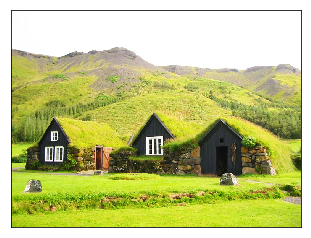

In [0]:
display_one(imread(four_channel_fakes[20]))

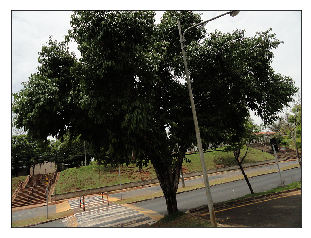

In [0]:
display_one(imread(three_channel_fakes[120]))

##masks

In [0]:
from imageio import imread
mask_shapes=[]
for mask in masks:
    if imread(mask).shape in mask_shapes:
        pass
    else:
        mask_shapes.append(imread(mask).shape)

c:\anaconda3\lib\site-packages\PIL\Image.py:969: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


In [0]:
mask_shapes

[(1536, 2048, 4),
 (768, 1024),
 (600, 800, 4),
 (765, 1024),
 (2736, 3648, 3),
 (768, 1024, 4),
 (1200, 1800, 4),
 (4288, 3216, 3),
 (2592, 1936, 3),
 (1637, 2352, 4),
 (2112, 2816, 3),
 (1200, 1600, 3),
 (2976, 3968, 3),
 (3216, 4288, 3),
 (480, 640, 4),
 (2304, 3072, 3),
 (3000, 4000, 3),
 (1944, 2592, 3),
 (2048, 1536, 4),
 (771, 1024),
 (4000, 3000, 3),
 (3240, 4320, 3),
 (2758, 4150, 4),
 (1536, 2048, 3),
 (994, 1680, 4),
 (933, 1600, 4),
 (563, 798, 4),
 (570, 760, 4),
 (2304, 3072),
 (2748, 3664, 3),
 (598, 848, 3),
 (1024, 768),
 (3240, 4320),
 (2304, 3072, 4),
 (1936, 2592, 3),
 (806, 1075),
 (1200, 1600),
 (2848, 4272, 3),
 (972, 1296),
 (1067, 1600),
 (720, 960),
 (1042, 1389),
 (778, 1037),
 (1920, 2560, 3),
 (3072, 2304, 3),
 (1072, 1424),
 (1109, 1663),
 (595, 1025),
 (792, 1188),
 (1286, 1709),
 (648, 1152),
 (1188, 792),
 (1000, 1504),
 (2144, 2848, 3),
 (750, 1000),
 (691, 922),
 (900, 1600),
 (960, 1280),
 (1152, 1536),
 (1071, 1600)]

In [0]:
print('number of distinct dimensions = {}'.format(len(mask_shapes)))
heights=[]
for each in mask_shapes:
  heights.append(each[0])
print('minimum height = {}'.format(min(heights)))
print('maximum height = {}'.format(max(heights)))
widths=[]
for each in mask_shapes:
  widths.append(each[1])
print('minimum width = {}'.format(min(widths)))
print('maximum width = {}'.format(max(widths)))
channels=[]
for each in mask_shapes:
  if(len(each)==2):
    pass
  else:
    channels.append(each[2])
CH = np.unique(np.array(channels))
print('depth of channels = {}'.format(np.append(CH,[0])))

number of distinct dimensions = 60
minimum height = 480
maximum height = 4288
minimum width = 640
maximum width = 4320
depth of channels = [3 4 0]


In [0]:
one_channel_masks=[]
for mask in masks:
    if len(imread(mask).shape)==2:
        one_channel_masks.append(mask)
three_channel_masks=[]
for mask in masks:
    img=imread(mask)
    if len(img.shape)==3 and img.shape[2]==3:
        three_channel_masks.append(mask)

four_channel_masks=[m for m in masks if ((m not in one_channel_masks) and (m not in three_channel_masks))]

In [0]:
print('Masks with 4 channels depth = {}'.format(len(four_channel_masks)))
print('Masks with 3 channels depth = {}'.format(len(three_channel_masks)))
print('Masks with 1 channels depth = {}'.format(len(one_channel_masks)))

Masks with 4 channels depth = 55
Masks with 3 channels depth = 65
Masks with 1 channels depth = 330


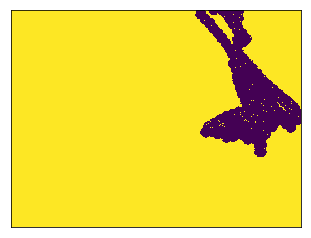

In [0]:
display_one(imread(one_channel_masks[2]))

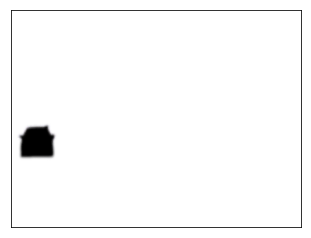

In [0]:
display_one(imread(three_channel_masks[4]))

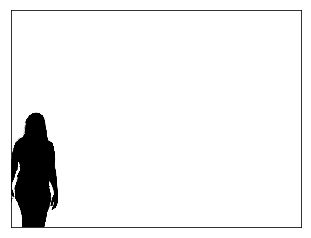

In [0]:
display_one(imread(four_channel_masks[12]))

A Jupyter Widget

(768, 1024, 3) 	(598, 848, 3)


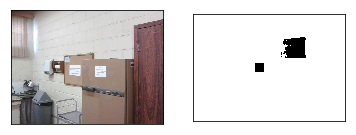

(768, 1024, 3) 	(598, 848, 3)


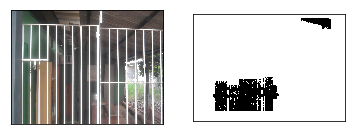

(1536, 2048, 3) 	(2304, 3072, 4)


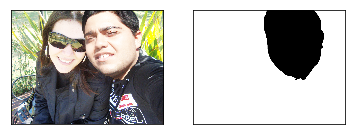

(768, 1024, 3) 	(598, 848, 3)


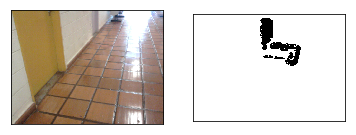

(768, 1024, 3) 	(598, 848, 3)


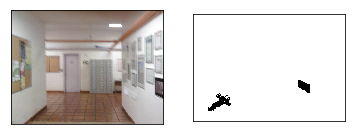

(768, 1024, 3) 	(598, 848, 3)


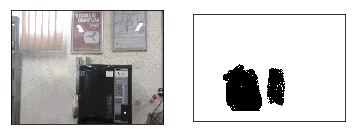

(768, 1024, 3) 	(598, 848, 3)


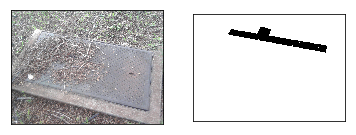

(768, 1024, 3) 	(598, 848, 3)


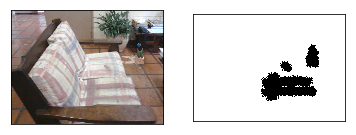

In [0]:
from tqdm import tqdm_notebook, tqdm
i=0
for mask, fake in tqdm_notebook(zip(masks, fakeimage)):
    mask_img=imread(mask)
    fake_img=imread(fake)
    if mask_img.shape[:2]!=fake_img.shape[:2]:
        i+=1
        print(str(fake_img.shape)+' \t'+str(mask_img.shape))
        display(fake_img,mask_img)

##pristine images

In [0]:
from imageio import imread
pristine_shapes=[]
for real in pristineimage:
    if imread(real).shape in pristine_shapes:
        pass
    else:
        pristine_shapes.append(imread(real).shape)

In [0]:
pristine_shapes

[(768, 1024, 3),
 (683, 1024, 3),
 (681, 1024, 3),
 (680, 1024, 3),
 (768, 1024, 4),
 (575, 1024, 3),
 (768, 1020, 3),
 (768, 576, 4),
 (681, 1024, 4),
 (768, 1024)]

In [0]:
print('number of distinct dimensions = {}'.format(len(pristine_shapes)))
heights=[]
for each in pristine_shapes:
    heights.append(each[0])
print('minimum height = {}'.format(min(heights)))
print('maximum height = {}'.format(max(heights)))
widths=[]
for each in pristine_shapes:
    widths.append(each[1])
print('minimum width = {}'.format(min(widths)))
print('maximum width = {}'.format(max(widths)))
channels=[]
for each in pristine_shapes:
    if(len(each)==2):
        pass
    else:
        channels.append(each[2])
CH = np.unique(np.array(channels))
print('depth of channels = {}'.format(np.append(CH,[0])))

number of distinct dimensions = 10
minimum height = 575
maximum height = 768
minimum width = 576
maximum width = 1024
depth of channels = [3 4 0]


In [0]:
one_channel_pristines=[]
for real in pristineimage:
    if len(imread(real).shape)==2:
        one_channel_pristines.append(real)
three_channel_pristines=[]
for real in pristineimage:
    img=imread(real)
    if len(img.shape)==3 and img.shape[2]==3:
        three_channel_pristines.append(real)

four_channel_pristines=[m for m in pristineimage if ((m not in one_channel_pristines) and (m not in three_channel_pristines))]

In [0]:
print('Pristine images with 4 channels depth = {}'.format(len(four_channel_pristines)))
print('Pristine images with 3 channels depth = {}'.format(len(three_channel_pristines)))
print('Pristine images with 1 channels depth = {}'.format(len(one_channel_pristines)))

Pristine images with 4 channels depth = 22
Pristine images with 3 channels depth = 1025
Pristine images with 1 channels depth = 3


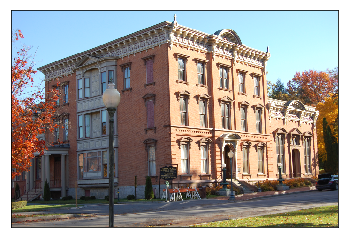

In [0]:
display_one(imread(three_channel_pristines[12]))

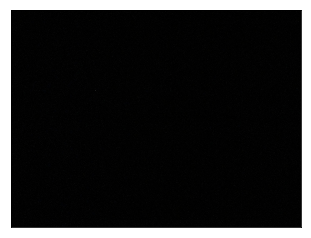

In [0]:
display_one(imread(four_channel_pristines[12]))

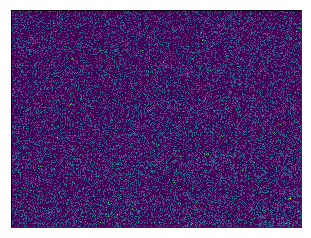

In [0]:
display_one(imread(one_channel_pristines[2]))

##data cleaning

In [0]:
#featching all pristine images with 3 channels depth only
pristines_final=[]
for pristine in pristineimage:
    img=imread(pristine)
    if len(img.shape)<3:
        continue
    if img.shape[2]==4:
        continue
    pristines_final.append(pristine)
print(len(pristines_final))

1025


In [0]:
#loading fake images converting all to 3 channels depth
fake_images=[]
fakes_final=[]
for fake in fakeimage:
    img=imread(fake)
    try:
        fake_images.append(img[:,:,:3])
        fakes_final.append(fake)
    except IndexError:
        print(f'image {fake} has only 1 channel')
print(len(fakes_final),len(fake_images))

450 450


In [0]:
#merging all pristines with fakes
image_names=[]
for i in range(0, len(pristines_final)):
    image_names.append(pristines_final[i])
for i in range(0, len(fakeimage)):
    image_names.append(fakes_final[i])
print(len(image_names))

1475


#Train-test split

In [0]:
#labels 0 - pristine image, 1 - fake images
labels=[0]*1025+[1]*450

In [0]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(image_names, labels, test_size=0.2, stratify=labels)

In [0]:
print("x train",len(x_train),"x test",len(x_test))
print("y train",len(y_train),"y test",len(y_test))

x train 1180 x test 295
y train 1180 y test 295


#Feature engineering on Train data

In [0]:
x_train_images=[]
for x in x_train:
    img=imread(x)
    x_train_images.append(img)

In [0]:
len(x_train_images)

1180

In [0]:
x_train_images

In [0]:
x_train_mask_names=[]
for ind, x in enumerate(x_train):
    if y_train[ind]==1:
        name = x.split('\\')[1]
        x_train_mask_names.append(name.split('.')[0]+'.mask.png')

In [0]:
x_train_mask_names[0:10]

['cb73316904b4dfa07e2f0066fdc91242.mask.png',
 'bf3bbec50ea288905e42bbfaf2c682bc.mask.png',
 'bbb6f569a59a45dd2d895eda0431b036.mask.png',
 '3285736d9bb41f0e91998c0fac685115.mask.png',
 'b9b5386221a626f791fdd6cf400b73df.mask.png',
 'd6388ee9f63e1111d41ce66ddf06ff41.mask.png',
 'c890621aeaafe9b0e353f29a7d93391d.mask.png',
 'b1ab7bc3fe7e57cc7a1beb3edd00a1e2.mask.png',
 'b18784f9d9acd72b0d414a5a3ae56c2c.mask.png',
 'ab1e91e9a308f42d3cd0baa59f7c7c71.mask.png']

In [0]:
x_train_fakes_names=[]
x_train_fake_images=[]
for ind, x in enumerate(x_train):
    if y_train[ind]==1:
        x_train_fakes_names.append(x)
        x_train_fake_images.append(x_train_images[ind])

In [0]:
x_train_fakes_names[0:10]

['dataset-dist/phase-01/training/fake\\cb73316904b4dfa07e2f0066fdc91242.png',
 'dataset-dist/phase-01/training/fake\\bf3bbec50ea288905e42bbfaf2c682bc.png',
 'dataset-dist/phase-01/training/fake\\bbb6f569a59a45dd2d895eda0431b036.png',
 'dataset-dist/phase-01/training/fake\\3285736d9bb41f0e91998c0fac685115.png',
 'dataset-dist/phase-01/training/fake\\b9b5386221a626f791fdd6cf400b73df.png',
 'dataset-dist/phase-01/training/fake\\d6388ee9f63e1111d41ce66ddf06ff41.png',
 'dataset-dist/phase-01/training/fake\\c890621aeaafe9b0e353f29a7d93391d.png',
 'dataset-dist/phase-01/training/fake\\b1ab7bc3fe7e57cc7a1beb3edd00a1e2.png',
 'dataset-dist/phase-01/training/fake\\b18784f9d9acd72b0d414a5a3ae56c2c.png',
 'dataset-dist/phase-01/training/fake\\ab1e91e9a308f42d3cd0baa59f7c7c71.png']

In [0]:
x_train_fake_images[0:10]

[Array([[[225, 218, 202],
         [223, 215, 202],
         [223, 215, 202],
         ...,
         [207, 200, 182],
         [209, 200, 185],
         [211, 202, 187]],
 
        [[224, 217, 201],
         [223, 215, 202],
         [222, 214, 201],
         ...,
         [208, 201, 183],
         [209, 200, 185],
         [210, 201, 186]],
 
        [[224, 217, 201],
         [223, 215, 202],
         [223, 215, 202],
         ...,
         [209, 200, 183],
         [209, 200, 185],
         [209, 200, 185]],
 
        ...,
 
        [[ 48,  50,  11],
         [ 47,  49,  10],
         [ 50,  55,  14],
         ...,
         [ 61,  51,  16],
         [ 56,  48,  12],
         [ 49,  49,  11]],
 
        [[ 50,  52,  15],
         [ 39,  44,   4],
         [ 40,  45,   5],
         ...,
         [ 58,  50,  14],
         [ 54,  50,  13],
         [ 51,  53,  14]],
 
        [[ 48,  50,  13],
         [ 42,  46,   9],
         [ 46,  51,  11],
         ...,
         [ 52,  46,  10],
  

In [0]:
x_train_pristines_names=[]
x_train_pristine_images=[]
for ind, x in enumerate(x_train):
    if y_train[ind]==0:
        x_train_pristines_names.append(x)
        x_train_pristine_images.append(x_train_images[ind])

In [0]:
x_train_pristines_names[0:10]

['dataset-dist/phase-01/training/pristine\\6ce76a800932b084c5e8a0ae6475772f.png',
 'dataset-dist/phase-01/training/pristine\\4fbbf2f2a322ac709af0956f0df323c2.png',
 'dataset-dist/phase-01/training/pristine\\6a750b3e3ec6dacc1b887162055d67cd.png',
 'dataset-dist/phase-01/training/pristine\\7afcfe686667df48e62e685663460846.png',
 'dataset-dist/phase-01/training/pristine\\00e079b66d9e9f99892bbb81d9d6cd57.png',
 'dataset-dist/phase-01/training/pristine\\2ee1940345456ab6d704428191515ff7.png',
 'dataset-dist/phase-01/training/pristine\\01c86605fa24b57755ef6797443213d9.png',
 'dataset-dist/phase-01/training/pristine\\3fd217536bef02ee5af5f0db51882cc0.png',
 'dataset-dist/phase-01/training/pristine\\5ab02a69fd1a14ae0a7801e27c2d9b5a.png',
 'dataset-dist/phase-01/training/pristine\\6fcdaa82f912a1b56b3f24501a30aecc.png']

In [0]:
x_train_pristine_images[0:10]

[Array([[[ 95, 105,  86],
         [ 86,  85,  75],
         [ 78,  66,  51],
         ...,
         [193, 208, 137],
         [177, 193, 129],
         [182, 202, 134]],
 
        [[ 55,  72,  62],
         [ 75,  86,  72],
         [ 76,  86,  61],
         ...,
         [191, 204, 125],
         [191, 202, 131],
         [197, 214, 140]],
 
        [[ 23,  36,  35],
         [ 23,  40,  40],
         [ 29,  52,  51],
         ...,
         [203, 219, 136],
         [210, 220, 135],
         [203, 212, 126]],
 
        ...,
 
        [[ 29,  27,  15],
         [ 33,  30,  18],
         [ 33,  29,  16],
         ...,
         [195, 161, 112],
         [192, 160, 101],
         [177, 135,  68]],
 
        [[ 25,  23,  18],
         [ 29,  22,   9],
         [ 51,  44,  26],
         ...,
         [211, 181, 132],
         [190, 148,  95],
         [164, 112,  62]],
 
        [[ 31,  14,  18],
         [ 48,  28,  20],
         [ 89,  71,  60],
         ...,
         [207, 176, 132],
  

In [0]:
#converting all train fake images' mask to 1 channel depth
x_train_masks=[]
for m in x_train_mask_names:
    
    img=imread(image_path+'fake/masks/'+m)
    
    if len(img.shape)>2:
        img=img[:,:,0]
        
    x_train_masks.append(img)

c:\anaconda3\lib\site-packages\PIL\Image.py:969: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


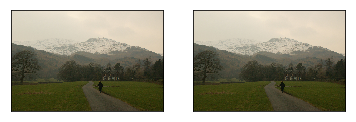

In [0]:
display(x_train_fake_images[0],x_train_fake_images[0][:,:,:3])

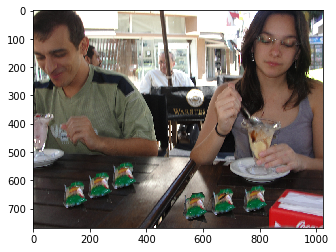

In [0]:
plt.imshow(x_train_fake_images[120], cmap='gray')

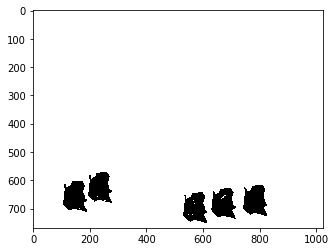

In [0]:
plt.imshow(x_train_masks[120], cmap='gray')

In [0]:
# Convert grayscale images to binary
binaries=[]

for grayscale in x_train_masks:
    blur = cv2.GaussianBlur(grayscale,(5,5),0)
    ret,th = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    binaries.append(th)

In [0]:
~binaries[120]

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

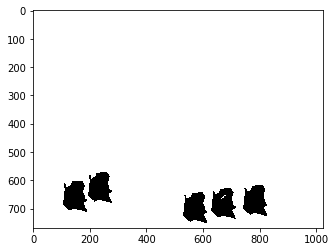

In [0]:
plt.imshow(binaries[120], cmap='gray')

In [0]:
#checkpoint
with open('x_train_masks.pickle', 'wb') as f:
    pickle.dump(x_train_masks, f)
with open('x_train_fakes_names.pickle', 'wb') as f:
    pickle.dump(x_train_fakes_names, f)
with open('x_test.pickle', 'wb') as f:
     pickle.dump(x_test, f)
with open('y_test.pickle', 'wb') as f:
     pickle.dump(y_test, f)

In [0]:
with open('x_train_masks.pickle', 'rb') as f:
    x_train_masks = pickle.load(f)
with open('x_train_fakes_names.pickle', 'rb') as f:
    x_train_fakes_names = pickle.load(f)
with open('x_test.pickle', 'rb') as f:
    x_test = pickle.load(f)
with open('x_test.pickle', 'rb') as f:
    x_test = pickle.load(f)
with open('y_test.pickle', 'rb') as f:
    y_test = pickle.load(f)

In [0]:
np.save('x_train_masks.npy',np.array(x_train_masks))

In [0]:
np.save('x_train_fakes_names.npy',np.array(x_train_fakes_names))

In [0]:
np.save('x_train_fake_images.npy',np.array(x_train_fake_images))

In [0]:
np.save('x_test.npy',np.array(x_test))

In [0]:
np.save('y_test.npy',np.array(y_test))

In [0]:
np.save('x_train_pristines_names.npy',np.array(x_train_pristines_names))

In [0]:
np.save('x_train_pristine_images.npy',np.array(x_train_pristine_images))

In [0]:
x_train_pristines_names=np.load('x_train_pristines_names.npy')

In [0]:
x_train_pristine_images=np.load('x_train_pristine_images.npy')

##Fake Grayscale Samples

In [0]:
def count_255(mask):
    i=0
    for row in range(mask.shape[0]):
        for col in range(mask.shape[1]):
            if mask[row,col]==255:
                i+=1
    return i

In [0]:
def sample_fake(img, mask):
    kernel_size=64
    stride=32
    
    samples=[]
    
    for y_start in range(0, img.shape[0]-kernel_size+1, stride):
        for x_start in range(0, img.shape[1]-kernel_size+1, stride):
            
            c_255=count_255(mask[y_start:y_start+kernel_size, x_start:x_start+kernel_size])
            
            if (c_255>1600) and (kernel_size*kernel_size-c_255>1600):
                samples.append(img[y_start:y_start+kernel_size, x_start:x_start+kernel_size, :3])    
        
    return samples

In [0]:
Sample=sample_fake(x_train_fake_images[5], x_train_masks[5])

In [0]:
len(Sample)

8

In [0]:
x_train_fake_images[5].shape

(3240, 4320, 3)

In [0]:
x_train_masks[5].shape

(3240, 4320)

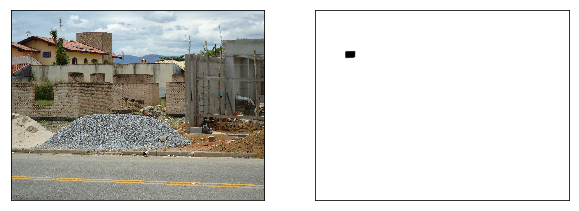

In [0]:
display(x_train_fake_images[5],x_train_masks[5])

In [0]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)

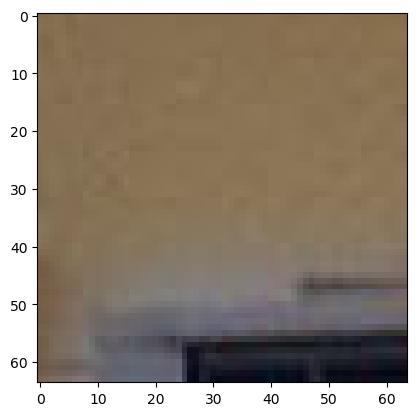

In [0]:
plt.imshow(Sample[0])

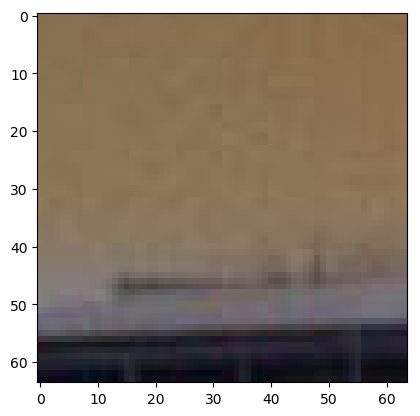

In [0]:
plt.imshow(Sample[1])

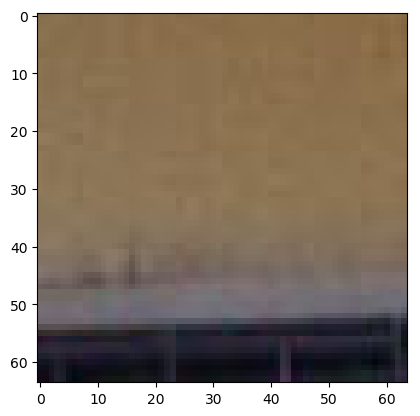

In [0]:
plt.imshow(Sample[2])

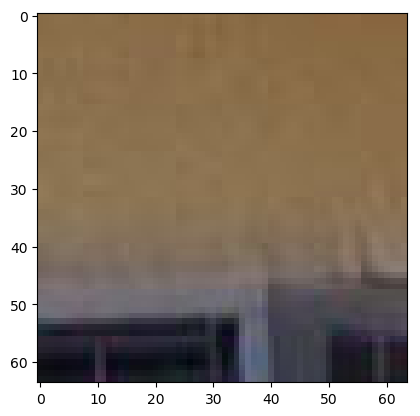

In [0]:
plt.imshow(Sample[3])

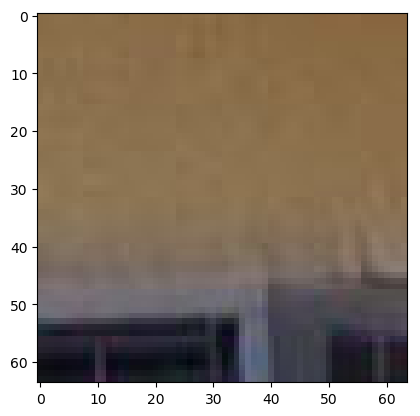

In [0]:
plt.imshow(Sample[3])

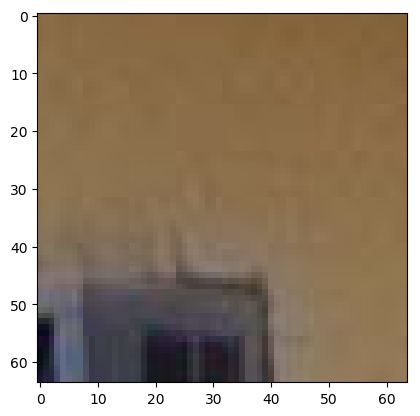

In [0]:
plt.imshow(Sample[4])

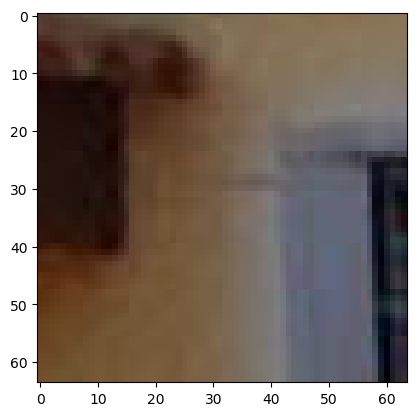

In [0]:
plt.imshow(Sample[5])

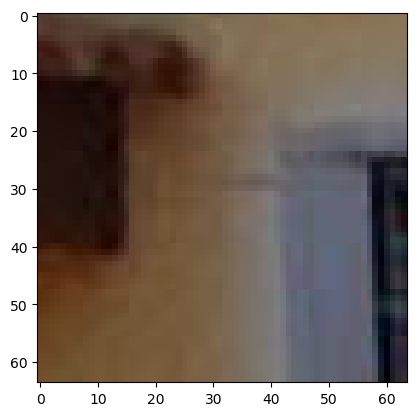

In [0]:
plt.imshow(Sample[5])

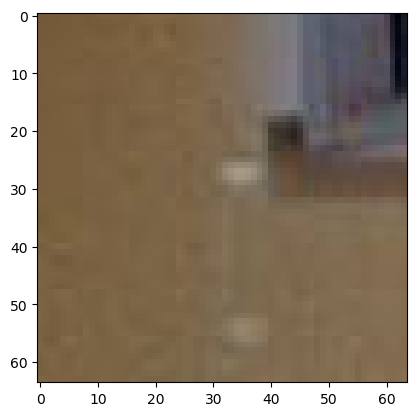

In [0]:
plt.imshow(Sample[6])

In [0]:
len(x_train_fake_images)

360

In [0]:
x_train_fake_images=np.load('x_train_fake_images.npy')

In [0]:
samples_fake=[]
i=0
j=0
for fake, mask in zip(x_train_fake_images, x_train_masks):
    image_samples=sample_fake(fake, mask)
    for sample in image_samples:
        samples_fake.append(sample)
        i+=1
        print(i,"th sample processed")
    j+=1
    print(j,"th image processed")

1 th sample processed
2 th sample processed
3 th sample processed
1 th image processed
4 th sample processed
2 th image processed
5 th sample processed
6 th sample processed
7 th sample processed
8 th sample processed
9 th sample processed
10 th sample processed
11 th sample processed
12 th sample processed
13 th sample processed
14 th sample processed
15 th sample processed
16 th sample processed
17 th sample processed
18 th sample processed
19 th sample processed
20 th sample processed
21 th sample processed
22 th sample processed
23 th sample processed
24 th sample processed
3 th image processed
25 th sample processed
26 th sample processed
4 th image processed
27 th sample processed
28 th sample processed
29 th sample processed
30 th sample processed
31 th sample processed
32 th sample processed
33 th sample processed
34 th sample processed
35 th sample processed
36 th sample processed
37 th sample processed
38 th sample processed
39 th sample processed
40 th sample processed
41 th

641 th sample processed
642 th sample processed
643 th sample processed
644 th sample processed
645 th sample processed
646 th sample processed
647 th sample processed
648 th sample processed
52 th image processed
649 th sample processed
650 th sample processed
651 th sample processed
652 th sample processed
653 th sample processed
654 th sample processed
655 th sample processed
656 th sample processed
657 th sample processed
658 th sample processed
659 th sample processed
660 th sample processed
53 th image processed
661 th sample processed
662 th sample processed
663 th sample processed
664 th sample processed
665 th sample processed
666 th sample processed
667 th sample processed
668 th sample processed
669 th sample processed
670 th sample processed
54 th image processed
671 th sample processed
672 th sample processed
673 th sample processed
674 th sample processed
675 th sample processed
676 th sample processed
677 th sample processed
678 th sample processed
679 th sample processe

1267 th sample processed
1268 th sample processed
1269 th sample processed
1270 th sample processed
1271 th sample processed
1272 th sample processed
1273 th sample processed
1274 th sample processed
1275 th sample processed
1276 th sample processed
1277 th sample processed
1278 th sample processed
1279 th sample processed
101 th image processed
1280 th sample processed
1281 th sample processed
1282 th sample processed
1283 th sample processed
1284 th sample processed
102 th image processed
1285 th sample processed
1286 th sample processed
1287 th sample processed
1288 th sample processed
103 th image processed
1289 th sample processed
1290 th sample processed
1291 th sample processed
1292 th sample processed
1293 th sample processed
1294 th sample processed
1295 th sample processed
104 th image processed
1296 th sample processed
1297 th sample processed
1298 th sample processed
1299 th sample processed
1300 th sample processed
1301 th sample processed
1302 th sample processed
1303 th 

1885 th sample processed
1886 th sample processed
141 th image processed
1887 th sample processed
1888 th sample processed
1889 th sample processed
1890 th sample processed
1891 th sample processed
1892 th sample processed
1893 th sample processed
1894 th sample processed
1895 th sample processed
1896 th sample processed
1897 th sample processed
142 th image processed
1898 th sample processed
1899 th sample processed
1900 th sample processed
1901 th sample processed
1902 th sample processed
1903 th sample processed
1904 th sample processed
1905 th sample processed
1906 th sample processed
1907 th sample processed
1908 th sample processed
1909 th sample processed
1910 th sample processed
1911 th sample processed
1912 th sample processed
1913 th sample processed
143 th image processed
1914 th sample processed
1915 th sample processed
1916 th sample processed
1917 th sample processed
1918 th sample processed
1919 th sample processed
1920 th sample processed
1921 th sample processed
1922 t

184 th image processed
2500 th sample processed
2501 th sample processed
2502 th sample processed
2503 th sample processed
2504 th sample processed
2505 th sample processed
2506 th sample processed
2507 th sample processed
2508 th sample processed
2509 th sample processed
2510 th sample processed
2511 th sample processed
2512 th sample processed
2513 th sample processed
185 th image processed
2514 th sample processed
2515 th sample processed
2516 th sample processed
2517 th sample processed
2518 th sample processed
2519 th sample processed
186 th image processed
2520 th sample processed
2521 th sample processed
2522 th sample processed
2523 th sample processed
2524 th sample processed
2525 th sample processed
2526 th sample processed
2527 th sample processed
2528 th sample processed
2529 th sample processed
2530 th sample processed
2531 th sample processed
2532 th sample processed
2533 th sample processed
2534 th sample processed
2535 th sample processed
2536 th sample processed
2537 t

3110 th sample processed
3111 th sample processed
3112 th sample processed
3113 th sample processed
3114 th sample processed
232 th image processed
3115 th sample processed
3116 th sample processed
3117 th sample processed
3118 th sample processed
3119 th sample processed
3120 th sample processed
3121 th sample processed
3122 th sample processed
3123 th sample processed
233 th image processed
3124 th sample processed
3125 th sample processed
3126 th sample processed
3127 th sample processed
3128 th sample processed
3129 th sample processed
3130 th sample processed
3131 th sample processed
3132 th sample processed
234 th image processed
3133 th sample processed
3134 th sample processed
3135 th sample processed
3136 th sample processed
3137 th sample processed
3138 th sample processed
3139 th sample processed
3140 th sample processed
235 th image processed
3141 th sample processed
3142 th sample processed
3143 th sample processed
3144 th sample processed
3145 th sample processed
3146 th 

272 th image processed
3728 th sample processed
3729 th sample processed
3730 th sample processed
3731 th sample processed
3732 th sample processed
3733 th sample processed
3734 th sample processed
273 th image processed
3735 th sample processed
3736 th sample processed
3737 th sample processed
3738 th sample processed
3739 th sample processed
3740 th sample processed
3741 th sample processed
3742 th sample processed
3743 th sample processed
3744 th sample processed
3745 th sample processed
3746 th sample processed
3747 th sample processed
3748 th sample processed
3749 th sample processed
3750 th sample processed
3751 th sample processed
3752 th sample processed
3753 th sample processed
3754 th sample processed
3755 th sample processed
3756 th sample processed
3757 th sample processed
3758 th sample processed
3759 th sample processed
3760 th sample processed
3761 th sample processed
3762 th sample processed
3763 th sample processed
3764 th sample processed
3765 th sample processed
3766

4345 th sample processed
4346 th sample processed
4347 th sample processed
4348 th sample processed
4349 th sample processed
4350 th sample processed
4351 th sample processed
4352 th sample processed
4353 th sample processed
4354 th sample processed
4355 th sample processed
313 th image processed
4356 th sample processed
4357 th sample processed
314 th image processed
4358 th sample processed
4359 th sample processed
4360 th sample processed
4361 th sample processed
4362 th sample processed
4363 th sample processed
4364 th sample processed
4365 th sample processed
4366 th sample processed
4367 th sample processed
4368 th sample processed
4369 th sample processed
4370 th sample processed
315 th image processed
4371 th sample processed
4372 th sample processed
4373 th sample processed
4374 th sample processed
4375 th sample processed
316 th image processed
317 th image processed
4376 th sample processed
4377 th sample processed
4378 th sample processed
4379 th sample processed
4380 th sa

4959 th sample processed
4960 th sample processed
4961 th sample processed
4962 th sample processed
4963 th sample processed
4964 th sample processed
4965 th sample processed
4966 th sample processed
357 th image processed
4967 th sample processed
4968 th sample processed
4969 th sample processed
4970 th sample processed
4971 th sample processed
4972 th sample processed
358 th image processed
4973 th sample processed
4974 th sample processed
4975 th sample processed
4976 th sample processed
4977 th sample processed
4978 th sample processed
4979 th sample processed
4980 th sample processed
4981 th sample processed
4982 th sample processed
4983 th sample processed
359 th image processed
4984 th sample processed
4985 th sample processed
4986 th sample processed
4987 th sample processed
4988 th sample processed
4989 th sample processed
4990 th sample processed
360 th image processed


4924


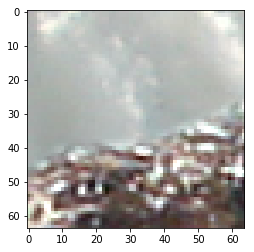

In [0]:
print (len(samples_fake))
plt.imshow(samples_fake[0])

In [0]:
    samples_fake_np = samples_fake[0][np.newaxis, :, :, :]
    for fake_sample in samples_fake[1:]:
        samples_fake_np = np.concatenate((samples_fake_np, fake_sample[np.newaxis, :, :, :3]), axis=0)

    print('done')
    np.save('sample_fakes_np.npy', samples_fake_np)

done


4924


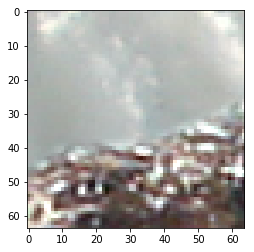

In [0]:
print (len(samples_fake_np))
plt.imshow(samples_fake_np[0])

##Fake Binary samples

In [0]:
from multiprocessing import Process, Manager
from imageio import imread
import pickle
import numpy as np
import os
import cv2

fake_path = image_path+'fake/'
pristine_path =  image_path+'pristine/'
mask_path = fake_path + 'masks/'

def count_255(mask):
    i=0
    for row in range(mask.shape[0]):
        for col in range(mask.shape[1]):
            if mask[row,col]==255:
                i+=1
    return i

def sample_fake(img, mask):
    kernel_size = 64
    stride = 8
    threshold=1024

    samples = []

    for y_start in range(0, img.shape[0] - kernel_size + 1, stride):
        for x_start in range(0, img.shape[1] - kernel_size + 1, stride):

            c_255 = count_255(mask[y_start:y_start + kernel_size, x_start:x_start + kernel_size])

            if (c_255 > threshold) and (kernel_size * kernel_size - c_255 > threshold):
                samples.append(img[y_start:y_start + kernel_size, x_start:x_start + kernel_size, :3])

    return samples

In [0]:
samples_fake_binaries=[]
i=0
j=0
for fake, mask in zip(x_train_fake_images, binaries):
    image_samples=sample_fake(fake, mask)
    for sample in image_samples:
        samples_fake_binaries.append(sample)
        i+=1
        print(i,"th sample processed")
    j+=1
    print(j,"th image processed")

1 th sample processed
2 th sample processed
3 th sample processed
4 th sample processed
5 th sample processed
6 th sample processed
7 th sample processed
8 th sample processed
9 th sample processed
10 th sample processed
11 th sample processed
12 th sample processed
13 th sample processed
14 th sample processed
15 th sample processed
16 th sample processed
17 th sample processed
18 th sample processed
19 th sample processed
20 th sample processed
21 th sample processed
22 th sample processed
23 th sample processed
24 th sample processed
25 th sample processed
26 th sample processed
27 th sample processed
28 th sample processed
29 th sample processed
30 th sample processed
31 th sample processed
32 th sample processed
33 th sample processed
34 th sample processed
35 th sample processed
36 th sample processed
37 th sample processed
38 th sample processed
39 th sample processed
40 th sample processed
41 th sample processed
42 th sample processed
43 th sample processed
44 th sample process

747 th sample processed
748 th sample processed
749 th sample processed
750 th sample processed
751 th sample processed
752 th sample processed
753 th sample processed
754 th sample processed
755 th sample processed
756 th sample processed
757 th sample processed
758 th sample processed
759 th sample processed
760 th sample processed
761 th sample processed
762 th sample processed
763 th sample processed
764 th sample processed
765 th sample processed
766 th sample processed
767 th sample processed
768 th sample processed
769 th sample processed
770 th sample processed
771 th sample processed
772 th sample processed
773 th sample processed
774 th sample processed
775 th sample processed
776 th sample processed
777 th sample processed
778 th sample processed
779 th sample processed
780 th sample processed
781 th sample processed
782 th sample processed
783 th sample processed
784 th sample processed
785 th sample processed
786 th sample processed
787 th sample processed
788 th sample pr

1905 th sample processed
1906 th sample processed
1907 th sample processed
1908 th sample processed
1909 th sample processed
1910 th sample processed
1911 th sample processed
1912 th sample processed
1913 th sample processed
1914 th sample processed
1915 th sample processed
1916 th sample processed
1917 th sample processed
1918 th sample processed
1919 th sample processed
1920 th sample processed
1921 th sample processed
1922 th sample processed
1923 th sample processed
1924 th sample processed
1925 th sample processed
1926 th sample processed
1927 th sample processed
1928 th sample processed
1929 th sample processed
1930 th sample processed
1931 th sample processed
1932 th sample processed
1933 th sample processed
1934 th sample processed
1935 th sample processed
1936 th sample processed
1937 th sample processed
1938 th sample processed
1939 th sample processed
1940 th sample processed
1941 th sample processed
1942 th sample processed
1943 th sample processed
1944 th sample processed


2309 th sample processed
2310 th sample processed
2311 th sample processed
2312 th sample processed
2313 th sample processed
2314 th sample processed
2315 th sample processed
2316 th sample processed
2317 th sample processed
2318 th sample processed
2319 th sample processed
2320 th sample processed
2321 th sample processed
2322 th sample processed
2323 th sample processed
2324 th sample processed
2325 th sample processed
2326 th sample processed
2327 th sample processed
2328 th sample processed
2329 th sample processed
2330 th sample processed
2331 th sample processed
2332 th sample processed
2333 th sample processed
2334 th sample processed
2335 th sample processed
2336 th sample processed
2337 th sample processed
2338 th sample processed
2339 th sample processed
2340 th sample processed
2341 th sample processed
2342 th sample processed
2343 th sample processed
2344 th sample processed
2345 th sample processed
2346 th sample processed
2347 th sample processed
2348 th sample processed


2928 th sample processed
2929 th sample processed
2930 th sample processed
2931 th sample processed
2932 th sample processed
2933 th sample processed
2934 th sample processed
2935 th sample processed
2936 th sample processed
2937 th sample processed
2938 th sample processed
2939 th sample processed
2940 th sample processed
2941 th sample processed
2942 th sample processed
2943 th sample processed
2944 th sample processed
2945 th sample processed
2946 th sample processed
2947 th sample processed
2948 th sample processed
2949 th sample processed
2950 th sample processed
2951 th sample processed
2952 th sample processed
2953 th sample processed
2954 th sample processed
2955 th sample processed
2956 th sample processed
2957 th sample processed
2958 th sample processed
2959 th sample processed
2960 th sample processed
2961 th sample processed
2962 th sample processed
2963 th sample processed
2964 th sample processed
2965 th sample processed
2966 th sample processed
2967 th sample processed


3444 th sample processed
3445 th sample processed
3446 th sample processed
3447 th sample processed
3448 th sample processed
3449 th sample processed
3450 th sample processed
3451 th sample processed
3452 th sample processed
3453 th sample processed
3454 th sample processed
3455 th sample processed
3456 th sample processed
3457 th sample processed
3458 th sample processed
3459 th sample processed
3460 th sample processed
3461 th sample processed
3462 th sample processed
3463 th sample processed
3464 th sample processed
3465 th sample processed
3466 th sample processed
3467 th sample processed
3468 th sample processed
3469 th sample processed
3470 th sample processed
3471 th sample processed
3472 th sample processed
3473 th sample processed
3474 th sample processed
3475 th sample processed
3476 th sample processed
3477 th sample processed
3478 th sample processed
3479 th sample processed
3480 th sample processed
3481 th sample processed
3482 th sample processed
3483 th sample processed


3808 th sample processed
3809 th sample processed
3810 th sample processed
3811 th sample processed
3812 th sample processed
3813 th sample processed
3814 th sample processed
3815 th sample processed
3816 th sample processed
3817 th sample processed
3818 th sample processed
3819 th sample processed
3820 th sample processed
3821 th sample processed
3822 th sample processed
3823 th sample processed
3824 th sample processed
3825 th sample processed
3826 th sample processed
3827 th sample processed
3828 th sample processed
3829 th sample processed
3830 th sample processed
3831 th sample processed
3832 th sample processed
3833 th sample processed
3834 th sample processed
3835 th sample processed
3836 th sample processed
3837 th sample processed
3838 th sample processed
3839 th sample processed
3840 th sample processed
3841 th sample processed
3842 th sample processed
3843 th sample processed
3844 th sample processed
3845 th sample processed
3846 th sample processed
3847 th sample processed


4535 th sample processed
4536 th sample processed
4537 th sample processed
4538 th sample processed
4539 th sample processed
4540 th sample processed
4541 th sample processed
4542 th sample processed
4543 th sample processed
4544 th sample processed
4545 th sample processed
4546 th sample processed
4547 th sample processed
4548 th sample processed
4549 th sample processed
4550 th sample processed
4551 th sample processed
4552 th sample processed
4553 th sample processed
4554 th sample processed
4555 th sample processed
4556 th sample processed
4557 th sample processed
4558 th sample processed
4559 th sample processed
4560 th sample processed
4561 th sample processed
4562 th sample processed
4563 th sample processed
4564 th sample processed
4565 th sample processed
4566 th sample processed
4567 th sample processed
4568 th sample processed
4569 th sample processed
4570 th sample processed
4571 th sample processed
4572 th sample processed
4573 th sample processed
4574 th sample processed


4892 th sample processed
4893 th sample processed
4894 th sample processed
4895 th sample processed
4896 th sample processed
4897 th sample processed
4898 th sample processed
4899 th sample processed
4900 th sample processed
4901 th sample processed
4902 th sample processed
4903 th sample processed
4904 th sample processed
4905 th sample processed
4906 th sample processed
4907 th sample processed
4908 th sample processed
4909 th sample processed
4910 th sample processed
4911 th sample processed
4912 th sample processed
4913 th sample processed
4914 th sample processed
4915 th sample processed
4916 th sample processed
4917 th sample processed
4918 th sample processed
4919 th sample processed
4920 th sample processed
4921 th sample processed
4922 th sample processed
4923 th sample processed
4924 th sample processed
4925 th sample processed
4926 th sample processed
4927 th sample processed
4928 th sample processed
4929 th sample processed
4930 th sample processed
4931 th sample processed


5286 th sample processed
5287 th sample processed
5288 th sample processed
5289 th sample processed
5290 th sample processed
5291 th sample processed
5292 th sample processed
5293 th sample processed
5294 th sample processed
5295 th sample processed
5296 th sample processed
5297 th sample processed
5298 th sample processed
5299 th sample processed
5300 th sample processed
5301 th sample processed
5302 th sample processed
5303 th sample processed
5304 th sample processed
5305 th sample processed
5306 th sample processed
5307 th sample processed
5308 th sample processed
5309 th sample processed
5310 th sample processed
5311 th sample processed
5312 th sample processed
5313 th sample processed
5314 th sample processed
5315 th sample processed
5316 th sample processed
5317 th sample processed
5318 th sample processed
5319 th sample processed
5320 th sample processed
5321 th sample processed
5322 th sample processed
5323 th sample processed
5324 th sample processed
5325 th sample processed


5742 th sample processed
5743 th sample processed
5744 th sample processed
5745 th sample processed
5746 th sample processed
5747 th sample processed
5748 th sample processed
5749 th sample processed
5750 th sample processed
5751 th sample processed
5752 th sample processed
5753 th sample processed
5754 th sample processed
5755 th sample processed
5756 th sample processed
5757 th sample processed
5758 th sample processed
5759 th sample processed
5760 th sample processed
5761 th sample processed
5762 th sample processed
5763 th sample processed
5764 th sample processed
5765 th sample processed
5766 th sample processed
5767 th sample processed
5768 th sample processed
5769 th sample processed
5770 th sample processed
5771 th sample processed
5772 th sample processed
5773 th sample processed
5774 th sample processed
5775 th sample processed
5776 th sample processed
5777 th sample processed
5778 th sample processed
5779 th sample processed
5780 th sample processed
5781 th sample processed


6715 th sample processed
6716 th sample processed
6717 th sample processed
6718 th sample processed
6719 th sample processed
6720 th sample processed
6721 th sample processed
6722 th sample processed
6723 th sample processed
6724 th sample processed
6725 th sample processed
6726 th sample processed
6727 th sample processed
6728 th sample processed
6729 th sample processed
6730 th sample processed
6731 th sample processed
6732 th sample processed
6733 th sample processed
6734 th sample processed
6735 th sample processed
6736 th sample processed
6737 th sample processed
6738 th sample processed
6739 th sample processed
6740 th sample processed
6741 th sample processed
6742 th sample processed
6743 th sample processed
6744 th sample processed
6745 th sample processed
6746 th sample processed
6747 th sample processed
6748 th sample processed
6749 th sample processed
6750 th sample processed
6751 th sample processed
6752 th sample processed
6753 th sample processed
6754 th sample processed


7949 th sample processed
7950 th sample processed
7951 th sample processed
7952 th sample processed
7953 th sample processed
7954 th sample processed
7955 th sample processed
7956 th sample processed
7957 th sample processed
7958 th sample processed
7959 th sample processed
7960 th sample processed
7961 th sample processed
7962 th sample processed
7963 th sample processed
7964 th sample processed
7965 th sample processed
7966 th sample processed
7967 th sample processed
7968 th sample processed
7969 th sample processed
7970 th sample processed
7971 th sample processed
7972 th sample processed
7973 th sample processed
7974 th sample processed
7975 th sample processed
7976 th sample processed
7977 th sample processed
7978 th sample processed
7979 th sample processed
7980 th sample processed
7981 th sample processed
7982 th sample processed
7983 th sample processed
7984 th sample processed
7985 th sample processed
7986 th sample processed
7987 th sample processed
7988 th sample processed


8907 th sample processed
8908 th sample processed
8909 th sample processed
8910 th sample processed
8911 th sample processed
8912 th sample processed
8913 th sample processed
8914 th sample processed
8915 th sample processed
8916 th sample processed
8917 th sample processed
8918 th sample processed
8919 th sample processed
8920 th sample processed
8921 th sample processed
8922 th sample processed
8923 th sample processed
8924 th sample processed
8925 th sample processed
8926 th sample processed
8927 th sample processed
8928 th sample processed
8929 th sample processed
8930 th sample processed
8931 th sample processed
8932 th sample processed
8933 th sample processed
8934 th sample processed
8935 th sample processed
8936 th sample processed
8937 th sample processed
8938 th sample processed
8939 th sample processed
8940 th sample processed
8941 th sample processed
8942 th sample processed
8943 th sample processed
8944 th sample processed
8945 th sample processed
8946 th sample processed


9947 th sample processed
9948 th sample processed
9949 th sample processed
9950 th sample processed
9951 th sample processed
9952 th sample processed
9953 th sample processed
9954 th sample processed
9955 th sample processed
9956 th sample processed
9957 th sample processed
9958 th sample processed
9959 th sample processed
9960 th sample processed
9961 th sample processed
9962 th sample processed
9963 th sample processed
9964 th sample processed
9965 th sample processed
9966 th sample processed
9967 th sample processed
9968 th sample processed
9969 th sample processed
9970 th sample processed
9971 th sample processed
9972 th sample processed
9973 th sample processed
9974 th sample processed
9975 th sample processed
9976 th sample processed
9977 th sample processed
9978 th sample processed
9979 th sample processed
9980 th sample processed
9981 th sample processed
9982 th sample processed
9983 th sample processed
9984 th sample processed
9985 th sample processed
9986 th sample processed


10392 th sample processed
10393 th sample processed
10394 th sample processed
10395 th sample processed
10396 th sample processed
10397 th sample processed
10398 th sample processed
10399 th sample processed
10400 th sample processed
10401 th sample processed
10402 th sample processed
10403 th sample processed
10404 th sample processed
10405 th sample processed
10406 th sample processed
10407 th sample processed
10408 th sample processed
10409 th sample processed
10410 th sample processed
10411 th sample processed
10412 th sample processed
10413 th sample processed
10414 th sample processed
10415 th sample processed
10416 th sample processed
10417 th sample processed
10418 th sample processed
10419 th sample processed
10420 th sample processed
10421 th sample processed
10422 th sample processed
10423 th sample processed
10424 th sample processed
10425 th sample processed
10426 th sample processed
10427 th sample processed
10428 th sample processed
10429 th sample processed
10430 th sam

11217 th sample processed
11218 th sample processed
11219 th sample processed
11220 th sample processed
11221 th sample processed
11222 th sample processed
11223 th sample processed
11224 th sample processed
11225 th sample processed
11226 th sample processed
11227 th sample processed
11228 th sample processed
11229 th sample processed
11230 th sample processed
11231 th sample processed
11232 th sample processed
11233 th sample processed
11234 th sample processed
11235 th sample processed
11236 th sample processed
11237 th sample processed
11238 th sample processed
11239 th sample processed
11240 th sample processed
11241 th sample processed
11242 th sample processed
11243 th sample processed
11244 th sample processed
11245 th sample processed
11246 th sample processed
11247 th sample processed
11248 th sample processed
11249 th sample processed
11250 th sample processed
11251 th sample processed
11252 th sample processed
11253 th sample processed
11254 th sample processed
11255 th sam

11688 th sample processed
11689 th sample processed
11690 th sample processed
11691 th sample processed
11692 th sample processed
11693 th sample processed
11694 th sample processed
11695 th sample processed
11696 th sample processed
11697 th sample processed
11698 th sample processed
11699 th sample processed
11700 th sample processed
11701 th sample processed
11702 th sample processed
11703 th sample processed
11704 th sample processed
11705 th sample processed
11706 th sample processed
11707 th sample processed
11708 th sample processed
11709 th sample processed
11710 th sample processed
11711 th sample processed
11712 th sample processed
11713 th sample processed
11714 th sample processed
11715 th sample processed
11716 th sample processed
11717 th sample processed
11718 th sample processed
11719 th sample processed
11720 th sample processed
11721 th sample processed
11722 th sample processed
11723 th sample processed
11724 th sample processed
11725 th sample processed
11726 th sam

12692 th sample processed
12693 th sample processed
12694 th sample processed
12695 th sample processed
12696 th sample processed
12697 th sample processed
12698 th sample processed
12699 th sample processed
12700 th sample processed
12701 th sample processed
12702 th sample processed
12703 th sample processed
12704 th sample processed
12705 th sample processed
12706 th sample processed
12707 th sample processed
12708 th sample processed
12709 th sample processed
12710 th sample processed
12711 th sample processed
12712 th sample processed
12713 th sample processed
12714 th sample processed
12715 th sample processed
12716 th sample processed
12717 th sample processed
12718 th sample processed
12719 th sample processed
12720 th sample processed
12721 th sample processed
12722 th sample processed
12723 th sample processed
12724 th sample processed
12725 th sample processed
12726 th sample processed
12727 th sample processed
12728 th sample processed
12729 th sample processed
12730 th sam

13267 th sample processed
13268 th sample processed
13269 th sample processed
13270 th sample processed
13271 th sample processed
13272 th sample processed
13273 th sample processed
13274 th sample processed
13275 th sample processed
13276 th sample processed
13277 th sample processed
13278 th sample processed
13279 th sample processed
13280 th sample processed
13281 th sample processed
13282 th sample processed
13283 th sample processed
13284 th sample processed
13285 th sample processed
13286 th sample processed
13287 th sample processed
13288 th sample processed
13289 th sample processed
13290 th sample processed
13291 th sample processed
13292 th sample processed
13293 th sample processed
13294 th sample processed
13295 th sample processed
13296 th sample processed
13297 th sample processed
13298 th sample processed
13299 th sample processed
13300 th sample processed
13301 th sample processed
13302 th sample processed
13303 th sample processed
13304 th sample processed
13305 th sam

13753 th sample processed
13754 th sample processed
13755 th sample processed
13756 th sample processed
13757 th sample processed
13758 th sample processed
13759 th sample processed
13760 th sample processed
13761 th sample processed
13762 th sample processed
13763 th sample processed
13764 th sample processed
13765 th sample processed
13766 th sample processed
13767 th sample processed
13768 th sample processed
13769 th sample processed
13770 th sample processed
13771 th sample processed
13772 th sample processed
13773 th sample processed
13774 th sample processed
13775 th sample processed
13776 th sample processed
13777 th sample processed
13778 th sample processed
13779 th sample processed
13780 th sample processed
13781 th sample processed
13782 th sample processed
13783 th sample processed
13784 th sample processed
13785 th sample processed
13786 th sample processed
13787 th sample processed
13788 th sample processed
13789 th sample processed
13790 th sample processed
13791 th sam

14442 th sample processed
14443 th sample processed
14444 th sample processed
14445 th sample processed
14446 th sample processed
14447 th sample processed
14448 th sample processed
14449 th sample processed
14450 th sample processed
14451 th sample processed
14452 th sample processed
14453 th sample processed
14454 th sample processed
14455 th sample processed
14456 th sample processed
14457 th sample processed
14458 th sample processed
14459 th sample processed
14460 th sample processed
14461 th sample processed
14462 th sample processed
14463 th sample processed
14464 th sample processed
14465 th sample processed
14466 th sample processed
14467 th sample processed
14468 th sample processed
14469 th sample processed
14470 th sample processed
14471 th sample processed
14472 th sample processed
14473 th sample processed
14474 th sample processed
14475 th sample processed
14476 th sample processed
14477 th sample processed
14478 th sample processed
14479 th sample processed
14480 th sam

15436 th sample processed
15437 th sample processed
15438 th sample processed
15439 th sample processed
15440 th sample processed
15441 th sample processed
15442 th sample processed
15443 th sample processed
15444 th sample processed
15445 th sample processed
15446 th sample processed
15447 th sample processed
15448 th sample processed
15449 th sample processed
15450 th sample processed
15451 th sample processed
15452 th sample processed
15453 th sample processed
15454 th sample processed
15455 th sample processed
15456 th sample processed
15457 th sample processed
15458 th sample processed
15459 th sample processed
15460 th sample processed
15461 th sample processed
15462 th sample processed
15463 th sample processed
15464 th sample processed
15465 th sample processed
15466 th sample processed
15467 th sample processed
15468 th sample processed
15469 th sample processed
15470 th sample processed
15471 th sample processed
15472 th sample processed
15473 th sample processed
15474 th sam

16135 th sample processed
16136 th sample processed
16137 th sample processed
16138 th sample processed
16139 th sample processed
16140 th sample processed
16141 th sample processed
16142 th sample processed
16143 th sample processed
16144 th sample processed
16145 th sample processed
16146 th sample processed
16147 th sample processed
16148 th sample processed
16149 th sample processed
16150 th sample processed
16151 th sample processed
16152 th sample processed
16153 th sample processed
16154 th sample processed
16155 th sample processed
16156 th sample processed
16157 th sample processed
16158 th sample processed
16159 th sample processed
16160 th sample processed
16161 th sample processed
16162 th sample processed
16163 th sample processed
16164 th sample processed
16165 th sample processed
16166 th sample processed
16167 th sample processed
16168 th sample processed
16169 th sample processed
16170 th sample processed
16171 th sample processed
16172 th sample processed
16173 th sam

16727 th sample processed
16728 th sample processed
16729 th sample processed
16730 th sample processed
16731 th sample processed
16732 th sample processed
16733 th sample processed
16734 th sample processed
16735 th sample processed
16736 th sample processed
16737 th sample processed
16738 th sample processed
16739 th sample processed
16740 th sample processed
16741 th sample processed
16742 th sample processed
16743 th sample processed
16744 th sample processed
16745 th sample processed
16746 th sample processed
16747 th sample processed
16748 th sample processed
16749 th sample processed
16750 th sample processed
16751 th sample processed
16752 th sample processed
16753 th sample processed
16754 th sample processed
16755 th sample processed
16756 th sample processed
16757 th sample processed
16758 th sample processed
16759 th sample processed
16760 th sample processed
16761 th sample processed
16762 th sample processed
16763 th sample processed
16764 th sample processed
16765 th sam

17926 th sample processed
17927 th sample processed
17928 th sample processed
17929 th sample processed
17930 th sample processed
17931 th sample processed
17932 th sample processed
17933 th sample processed
17934 th sample processed
17935 th sample processed
17936 th sample processed
17937 th sample processed
17938 th sample processed
17939 th sample processed
17940 th sample processed
17941 th sample processed
17942 th sample processed
17943 th sample processed
17944 th sample processed
17945 th sample processed
17946 th sample processed
17947 th sample processed
17948 th sample processed
17949 th sample processed
17950 th sample processed
17951 th sample processed
17952 th sample processed
17953 th sample processed
17954 th sample processed
17955 th sample processed
17956 th sample processed
17957 th sample processed
17958 th sample processed
17959 th sample processed
17960 th sample processed
17961 th sample processed
17962 th sample processed
17963 th sample processed
17964 th sam

18393 th sample processed
18394 th sample processed
18395 th sample processed
18396 th sample processed
18397 th sample processed
18398 th sample processed
18399 th sample processed
18400 th sample processed
18401 th sample processed
18402 th sample processed
18403 th sample processed
18404 th sample processed
18405 th sample processed
18406 th sample processed
18407 th sample processed
18408 th sample processed
18409 th sample processed
18410 th sample processed
18411 th sample processed
18412 th sample processed
18413 th sample processed
18414 th sample processed
18415 th sample processed
18416 th sample processed
18417 th sample processed
18418 th sample processed
18419 th sample processed
18420 th sample processed
18421 th sample processed
18422 th sample processed
18423 th sample processed
18424 th sample processed
18425 th sample processed
18426 th sample processed
18427 th sample processed
18428 th sample processed
18429 th sample processed
18430 th sample processed
18431 th sam

19500 th sample processed
19501 th sample processed
19502 th sample processed
19503 th sample processed
19504 th sample processed
19505 th sample processed
19506 th sample processed
19507 th sample processed
19508 th sample processed
19509 th sample processed
19510 th sample processed
19511 th sample processed
19512 th sample processed
19513 th sample processed
19514 th sample processed
19515 th sample processed
19516 th sample processed
19517 th sample processed
19518 th sample processed
19519 th sample processed
19520 th sample processed
19521 th sample processed
19522 th sample processed
19523 th sample processed
19524 th sample processed
19525 th sample processed
19526 th sample processed
19527 th sample processed
19528 th sample processed
19529 th sample processed
19530 th sample processed
19531 th sample processed
19532 th sample processed
19533 th sample processed
19534 th sample processed
19535 th sample processed
19536 th sample processed
19537 th sample processed
19538 th sam

20283 th sample processed
20284 th sample processed
20285 th sample processed
20286 th sample processed
20287 th sample processed
20288 th sample processed
20289 th sample processed
20290 th sample processed
20291 th sample processed
20292 th sample processed
20293 th sample processed
20294 th sample processed
20295 th sample processed
20296 th sample processed
20297 th sample processed
20298 th sample processed
20299 th sample processed
20300 th sample processed
20301 th sample processed
20302 th sample processed
20303 th sample processed
20304 th sample processed
20305 th sample processed
20306 th sample processed
20307 th sample processed
20308 th sample processed
20309 th sample processed
20310 th sample processed
20311 th sample processed
20312 th sample processed
20313 th sample processed
20314 th sample processed
20315 th sample processed
20316 th sample processed
20317 th sample processed
20318 th sample processed
20319 th sample processed
20320 th sample processed
20321 th sam

21420 th sample processed
21421 th sample processed
21422 th sample processed
21423 th sample processed
21424 th sample processed
21425 th sample processed
21426 th sample processed
21427 th sample processed
21428 th sample processed
21429 th sample processed
21430 th sample processed
21431 th sample processed
21432 th sample processed
21433 th sample processed
21434 th sample processed
21435 th sample processed
21436 th sample processed
21437 th sample processed
43 th image processed
21438 th sample processed
21439 th sample processed
21440 th sample processed
21441 th sample processed
21442 th sample processed
21443 th sample processed
21444 th sample processed
21445 th sample processed
21446 th sample processed
21447 th sample processed
21448 th sample processed
21449 th sample processed
21450 th sample processed
21451 th sample processed
21452 th sample processed
21453 th sample processed
21454 th sample processed
21455 th sample processed
21456 th sample processed
21457 th sample 

21794 th sample processed
21795 th sample processed
21796 th sample processed
21797 th sample processed
21798 th sample processed
21799 th sample processed
21800 th sample processed
21801 th sample processed
21802 th sample processed
21803 th sample processed
21804 th sample processed
21805 th sample processed
21806 th sample processed
21807 th sample processed
21808 th sample processed
21809 th sample processed
21810 th sample processed
21811 th sample processed
21812 th sample processed
21813 th sample processed
21814 th sample processed
21815 th sample processed
21816 th sample processed
21817 th sample processed
21818 th sample processed
21819 th sample processed
21820 th sample processed
21821 th sample processed
21822 th sample processed
21823 th sample processed
21824 th sample processed
21825 th sample processed
21826 th sample processed
21827 th sample processed
21828 th sample processed
21829 th sample processed
21830 th sample processed
21831 th sample processed
21832 th sam

22158 th sample processed
22159 th sample processed
22160 th sample processed
22161 th sample processed
22162 th sample processed
22163 th sample processed
22164 th sample processed
22165 th sample processed
22166 th sample processed
22167 th sample processed
22168 th sample processed
22169 th sample processed
22170 th sample processed
22171 th sample processed
22172 th sample processed
22173 th sample processed
22174 th sample processed
22175 th sample processed
22176 th sample processed
22177 th sample processed
22178 th sample processed
22179 th sample processed
22180 th sample processed
22181 th sample processed
22182 th sample processed
22183 th sample processed
22184 th sample processed
22185 th sample processed
22186 th sample processed
22187 th sample processed
22188 th sample processed
22189 th sample processed
22190 th sample processed
22191 th sample processed
22192 th sample processed
22193 th sample processed
22194 th sample processed
22195 th sample processed
22196 th sam

22971 th sample processed
22972 th sample processed
22973 th sample processed
22974 th sample processed
22975 th sample processed
22976 th sample processed
22977 th sample processed
22978 th sample processed
22979 th sample processed
22980 th sample processed
22981 th sample processed
22982 th sample processed
22983 th sample processed
22984 th sample processed
22985 th sample processed
22986 th sample processed
22987 th sample processed
22988 th sample processed
22989 th sample processed
22990 th sample processed
22991 th sample processed
22992 th sample processed
22993 th sample processed
22994 th sample processed
22995 th sample processed
22996 th sample processed
22997 th sample processed
22998 th sample processed
22999 th sample processed
23000 th sample processed
23001 th sample processed
23002 th sample processed
23003 th sample processed
23004 th sample processed
23005 th sample processed
23006 th sample processed
23007 th sample processed
23008 th sample processed
23009 th sam

23356 th sample processed
23357 th sample processed
23358 th sample processed
23359 th sample processed
23360 th sample processed
23361 th sample processed
23362 th sample processed
23363 th sample processed
23364 th sample processed
23365 th sample processed
23366 th sample processed
23367 th sample processed
23368 th sample processed
23369 th sample processed
23370 th sample processed
23371 th sample processed
23372 th sample processed
23373 th sample processed
23374 th sample processed
23375 th sample processed
23376 th sample processed
23377 th sample processed
23378 th sample processed
23379 th sample processed
23380 th sample processed
23381 th sample processed
23382 th sample processed
23383 th sample processed
23384 th sample processed
23385 th sample processed
23386 th sample processed
23387 th sample processed
23388 th sample processed
23389 th sample processed
23390 th sample processed
23391 th sample processed
23392 th sample processed
23393 th sample processed
23394 th sam

23681 th sample processed
23682 th sample processed
23683 th sample processed
23684 th sample processed
23685 th sample processed
23686 th sample processed
23687 th sample processed
23688 th sample processed
23689 th sample processed
23690 th sample processed
23691 th sample processed
23692 th sample processed
23693 th sample processed
23694 th sample processed
23695 th sample processed
23696 th sample processed
23697 th sample processed
23698 th sample processed
23699 th sample processed
23700 th sample processed
23701 th sample processed
23702 th sample processed
23703 th sample processed
23704 th sample processed
23705 th sample processed
23706 th sample processed
23707 th sample processed
23708 th sample processed
23709 th sample processed
23710 th sample processed
23711 th sample processed
23712 th sample processed
23713 th sample processed
23714 th sample processed
23715 th sample processed
23716 th sample processed
23717 th sample processed
23718 th sample processed
23719 th sam

24660 th sample processed
24661 th sample processed
24662 th sample processed
24663 th sample processed
24664 th sample processed
24665 th sample processed
24666 th sample processed
24667 th sample processed
24668 th sample processed
24669 th sample processed
24670 th sample processed
24671 th sample processed
24672 th sample processed
24673 th sample processed
24674 th sample processed
24675 th sample processed
24676 th sample processed
24677 th sample processed
24678 th sample processed
24679 th sample processed
24680 th sample processed
24681 th sample processed
24682 th sample processed
24683 th sample processed
24684 th sample processed
24685 th sample processed
24686 th sample processed
24687 th sample processed
24688 th sample processed
24689 th sample processed
24690 th sample processed
24691 th sample processed
24692 th sample processed
24693 th sample processed
24694 th sample processed
24695 th sample processed
24696 th sample processed
24697 th sample processed
24698 th sam

25312 th sample processed
25313 th sample processed
25314 th sample processed
25315 th sample processed
25316 th sample processed
25317 th sample processed
25318 th sample processed
25319 th sample processed
25320 th sample processed
25321 th sample processed
25322 th sample processed
25323 th sample processed
25324 th sample processed
25325 th sample processed
25326 th sample processed
25327 th sample processed
25328 th sample processed
25329 th sample processed
25330 th sample processed
25331 th sample processed
25332 th sample processed
25333 th sample processed
25334 th sample processed
25335 th sample processed
25336 th sample processed
25337 th sample processed
25338 th sample processed
25339 th sample processed
25340 th sample processed
25341 th sample processed
25342 th sample processed
25343 th sample processed
25344 th sample processed
25345 th sample processed
25346 th sample processed
25347 th sample processed
25348 th sample processed
25349 th sample processed
25350 th sam

25725 th sample processed
25726 th sample processed
25727 th sample processed
25728 th sample processed
25729 th sample processed
25730 th sample processed
25731 th sample processed
25732 th sample processed
25733 th sample processed
25734 th sample processed
25735 th sample processed
25736 th sample processed
25737 th sample processed
25738 th sample processed
25739 th sample processed
25740 th sample processed
25741 th sample processed
25742 th sample processed
25743 th sample processed
25744 th sample processed
25745 th sample processed
25746 th sample processed
25747 th sample processed
25748 th sample processed
25749 th sample processed
25750 th sample processed
25751 th sample processed
25752 th sample processed
25753 th sample processed
25754 th sample processed
25755 th sample processed
25756 th sample processed
25757 th sample processed
25758 th sample processed
25759 th sample processed
25760 th sample processed
25761 th sample processed
25762 th sample processed
25763 th sam

26273 th sample processed
26274 th sample processed
26275 th sample processed
26276 th sample processed
26277 th sample processed
26278 th sample processed
26279 th sample processed
26280 th sample processed
26281 th sample processed
26282 th sample processed
26283 th sample processed
26284 th sample processed
26285 th sample processed
26286 th sample processed
26287 th sample processed
26288 th sample processed
26289 th sample processed
26290 th sample processed
26291 th sample processed
26292 th sample processed
26293 th sample processed
26294 th sample processed
26295 th sample processed
26296 th sample processed
26297 th sample processed
26298 th sample processed
26299 th sample processed
26300 th sample processed
26301 th sample processed
26302 th sample processed
26303 th sample processed
26304 th sample processed
26305 th sample processed
26306 th sample processed
26307 th sample processed
26308 th sample processed
26309 th sample processed
26310 th sample processed
26311 th sam

26658 th sample processed
26659 th sample processed
26660 th sample processed
26661 th sample processed
26662 th sample processed
26663 th sample processed
26664 th sample processed
26665 th sample processed
26666 th sample processed
26667 th sample processed
26668 th sample processed
26669 th sample processed
26670 th sample processed
26671 th sample processed
26672 th sample processed
26673 th sample processed
26674 th sample processed
26675 th sample processed
26676 th sample processed
26677 th sample processed
26678 th sample processed
26679 th sample processed
26680 th sample processed
26681 th sample processed
26682 th sample processed
26683 th sample processed
26684 th sample processed
26685 th sample processed
26686 th sample processed
26687 th sample processed
26688 th sample processed
26689 th sample processed
26690 th sample processed
26691 th sample processed
26692 th sample processed
26693 th sample processed
26694 th sample processed
26695 th sample processed
26696 th sam

27901 th sample processed
27902 th sample processed
27903 th sample processed
27904 th sample processed
27905 th sample processed
27906 th sample processed
27907 th sample processed
27908 th sample processed
27909 th sample processed
27910 th sample processed
27911 th sample processed
27912 th sample processed
27913 th sample processed
27914 th sample processed
27915 th sample processed
27916 th sample processed
27917 th sample processed
27918 th sample processed
27919 th sample processed
27920 th sample processed
27921 th sample processed
27922 th sample processed
27923 th sample processed
27924 th sample processed
27925 th sample processed
27926 th sample processed
27927 th sample processed
27928 th sample processed
27929 th sample processed
27930 th sample processed
27931 th sample processed
27932 th sample processed
27933 th sample processed
27934 th sample processed
27935 th sample processed
27936 th sample processed
27937 th sample processed
27938 th sample processed
27939 th sam

28507 th sample processed
28508 th sample processed
28509 th sample processed
28510 th sample processed
28511 th sample processed
28512 th sample processed
28513 th sample processed
28514 th sample processed
28515 th sample processed
28516 th sample processed
28517 th sample processed
28518 th sample processed
28519 th sample processed
28520 th sample processed
28521 th sample processed
28522 th sample processed
28523 th sample processed
28524 th sample processed
28525 th sample processed
28526 th sample processed
28527 th sample processed
28528 th sample processed
28529 th sample processed
28530 th sample processed
28531 th sample processed
28532 th sample processed
28533 th sample processed
28534 th sample processed
28535 th sample processed
28536 th sample processed
28537 th sample processed
28538 th sample processed
28539 th sample processed
28540 th sample processed
28541 th sample processed
28542 th sample processed
28543 th sample processed
28544 th sample processed
28545 th sam

29037 th sample processed
29038 th sample processed
29039 th sample processed
29040 th sample processed
29041 th sample processed
29042 th sample processed
29043 th sample processed
29044 th sample processed
29045 th sample processed
29046 th sample processed
29047 th sample processed
29048 th sample processed
29049 th sample processed
29050 th sample processed
29051 th sample processed
29052 th sample processed
29053 th sample processed
29054 th sample processed
29055 th sample processed
29056 th sample processed
29057 th sample processed
29058 th sample processed
29059 th sample processed
29060 th sample processed
29061 th sample processed
29062 th sample processed
29063 th sample processed
29064 th sample processed
29065 th sample processed
29066 th sample processed
29067 th sample processed
29068 th sample processed
29069 th sample processed
29070 th sample processed
29071 th sample processed
29072 th sample processed
29073 th sample processed
29074 th sample processed
29075 th sam

29556 th sample processed
29557 th sample processed
29558 th sample processed
29559 th sample processed
29560 th sample processed
29561 th sample processed
29562 th sample processed
29563 th sample processed
29564 th sample processed
29565 th sample processed
29566 th sample processed
29567 th sample processed
29568 th sample processed
29569 th sample processed
29570 th sample processed
29571 th sample processed
29572 th sample processed
29573 th sample processed
29574 th sample processed
29575 th sample processed
29576 th sample processed
29577 th sample processed
29578 th sample processed
29579 th sample processed
29580 th sample processed
29581 th sample processed
29582 th sample processed
29583 th sample processed
29584 th sample processed
29585 th sample processed
29586 th sample processed
29587 th sample processed
29588 th sample processed
29589 th sample processed
29590 th sample processed
29591 th sample processed
29592 th sample processed
29593 th sample processed
29594 th sam

29885 th sample processed
29886 th sample processed
29887 th sample processed
29888 th sample processed
29889 th sample processed
29890 th sample processed
29891 th sample processed
29892 th sample processed
29893 th sample processed
29894 th sample processed
29895 th sample processed
29896 th sample processed
29897 th sample processed
29898 th sample processed
29899 th sample processed
29900 th sample processed
29901 th sample processed
29902 th sample processed
29903 th sample processed
29904 th sample processed
29905 th sample processed
29906 th sample processed
29907 th sample processed
29908 th sample processed
29909 th sample processed
29910 th sample processed
29911 th sample processed
29912 th sample processed
29913 th sample processed
29914 th sample processed
29915 th sample processed
29916 th sample processed
29917 th sample processed
29918 th sample processed
29919 th sample processed
29920 th sample processed
29921 th sample processed
29922 th sample processed
29923 th sam

30437 th sample processed
30438 th sample processed
30439 th sample processed
30440 th sample processed
30441 th sample processed
30442 th sample processed
30443 th sample processed
30444 th sample processed
30445 th sample processed
30446 th sample processed
30447 th sample processed
30448 th sample processed
30449 th sample processed
30450 th sample processed
30451 th sample processed
30452 th sample processed
30453 th sample processed
30454 th sample processed
30455 th sample processed
30456 th sample processed
30457 th sample processed
30458 th sample processed
30459 th sample processed
30460 th sample processed
30461 th sample processed
30462 th sample processed
30463 th sample processed
30464 th sample processed
30465 th sample processed
30466 th sample processed
30467 th sample processed
30468 th sample processed
30469 th sample processed
30470 th sample processed
30471 th sample processed
30472 th sample processed
30473 th sample processed
30474 th sample processed
30475 th sam

31470 th sample processed
31471 th sample processed
31472 th sample processed
31473 th sample processed
31474 th sample processed
31475 th sample processed
31476 th sample processed
31477 th sample processed
31478 th sample processed
31479 th sample processed
31480 th sample processed
31481 th sample processed
31482 th sample processed
31483 th sample processed
31484 th sample processed
31485 th sample processed
31486 th sample processed
31487 th sample processed
31488 th sample processed
31489 th sample processed
31490 th sample processed
31491 th sample processed
31492 th sample processed
31493 th sample processed
31494 th sample processed
31495 th sample processed
31496 th sample processed
31497 th sample processed
31498 th sample processed
31499 th sample processed
31500 th sample processed
31501 th sample processed
31502 th sample processed
31503 th sample processed
31504 th sample processed
31505 th sample processed
31506 th sample processed
31507 th sample processed
31508 th sam

31833 th sample processed
31834 th sample processed
31835 th sample processed
31836 th sample processed
31837 th sample processed
31838 th sample processed
31839 th sample processed
31840 th sample processed
31841 th sample processed
31842 th sample processed
31843 th sample processed
31844 th sample processed
31845 th sample processed
31846 th sample processed
31847 th sample processed
31848 th sample processed
31849 th sample processed
31850 th sample processed
31851 th sample processed
31852 th sample processed
31853 th sample processed
31854 th sample processed
31855 th sample processed
31856 th sample processed
31857 th sample processed
31858 th sample processed
31859 th sample processed
31860 th sample processed
31861 th sample processed
31862 th sample processed
31863 th sample processed
31864 th sample processed
31865 th sample processed
31866 th sample processed
31867 th sample processed
31868 th sample processed
31869 th sample processed
31870 th sample processed
31871 th sam

32184 th sample processed
32185 th sample processed
32186 th sample processed
32187 th sample processed
32188 th sample processed
32189 th sample processed
32190 th sample processed
32191 th sample processed
32192 th sample processed
32193 th sample processed
32194 th sample processed
32195 th sample processed
32196 th sample processed
32197 th sample processed
32198 th sample processed
32199 th sample processed
32200 th sample processed
32201 th sample processed
32202 th sample processed
32203 th sample processed
32204 th sample processed
32205 th sample processed
32206 th sample processed
32207 th sample processed
32208 th sample processed
32209 th sample processed
32210 th sample processed
32211 th sample processed
32212 th sample processed
32213 th sample processed
32214 th sample processed
32215 th sample processed
32216 th sample processed
32217 th sample processed
32218 th sample processed
32219 th sample processed
32220 th sample processed
32221 th sample processed
32222 th sam

33138 th sample processed
33139 th sample processed
33140 th sample processed
33141 th sample processed
33142 th sample processed
33143 th sample processed
33144 th sample processed
33145 th sample processed
33146 th sample processed
33147 th sample processed
33148 th sample processed
33149 th sample processed
33150 th sample processed
33151 th sample processed
33152 th sample processed
33153 th sample processed
33154 th sample processed
33155 th sample processed
33156 th sample processed
33157 th sample processed
33158 th sample processed
33159 th sample processed
33160 th sample processed
33161 th sample processed
33162 th sample processed
33163 th sample processed
33164 th sample processed
33165 th sample processed
33166 th sample processed
33167 th sample processed
33168 th sample processed
33169 th sample processed
33170 th sample processed
33171 th sample processed
33172 th sample processed
33173 th sample processed
33174 th sample processed
33175 th sample processed
33176 th sam

33465 th sample processed
33466 th sample processed
33467 th sample processed
33468 th sample processed
33469 th sample processed
33470 th sample processed
33471 th sample processed
33472 th sample processed
33473 th sample processed
33474 th sample processed
33475 th sample processed
33476 th sample processed
33477 th sample processed
33478 th sample processed
33479 th sample processed
33480 th sample processed
33481 th sample processed
33482 th sample processed
33483 th sample processed
33484 th sample processed
33485 th sample processed
33486 th sample processed
33487 th sample processed
33488 th sample processed
33489 th sample processed
33490 th sample processed
33491 th sample processed
33492 th sample processed
33493 th sample processed
33494 th sample processed
33495 th sample processed
33496 th sample processed
33497 th sample processed
33498 th sample processed
33499 th sample processed
33500 th sample processed
33501 th sample processed
33502 th sample processed
33503 th sam

33812 th sample processed
33813 th sample processed
33814 th sample processed
33815 th sample processed
33816 th sample processed
33817 th sample processed
33818 th sample processed
33819 th sample processed
33820 th sample processed
33821 th sample processed
33822 th sample processed
33823 th sample processed
33824 th sample processed
33825 th sample processed
33826 th sample processed
33827 th sample processed
33828 th sample processed
33829 th sample processed
33830 th sample processed
33831 th sample processed
33832 th sample processed
33833 th sample processed
33834 th sample processed
33835 th sample processed
33836 th sample processed
33837 th sample processed
33838 th sample processed
33839 th sample processed
33840 th sample processed
33841 th sample processed
33842 th sample processed
33843 th sample processed
33844 th sample processed
33845 th sample processed
33846 th sample processed
33847 th sample processed
33848 th sample processed
33849 th sample processed
33850 th sam

34272 th sample processed
34273 th sample processed
34274 th sample processed
34275 th sample processed
34276 th sample processed
34277 th sample processed
34278 th sample processed
34279 th sample processed
34280 th sample processed
34281 th sample processed
34282 th sample processed
34283 th sample processed
34284 th sample processed
34285 th sample processed
34286 th sample processed
34287 th sample processed
34288 th sample processed
34289 th sample processed
34290 th sample processed
34291 th sample processed
34292 th sample processed
34293 th sample processed
34294 th sample processed
34295 th sample processed
34296 th sample processed
34297 th sample processed
34298 th sample processed
34299 th sample processed
34300 th sample processed
34301 th sample processed
34302 th sample processed
34303 th sample processed
34304 th sample processed
34305 th sample processed
34306 th sample processed
34307 th sample processed
34308 th sample processed
34309 th sample processed
34310 th sam

34955 th sample processed
34956 th sample processed
34957 th sample processed
34958 th sample processed
34959 th sample processed
34960 th sample processed
34961 th sample processed
34962 th sample processed
34963 th sample processed
34964 th sample processed
34965 th sample processed
34966 th sample processed
34967 th sample processed
34968 th sample processed
34969 th sample processed
34970 th sample processed
34971 th sample processed
34972 th sample processed
34973 th sample processed
34974 th sample processed
34975 th sample processed
34976 th sample processed
34977 th sample processed
34978 th sample processed
34979 th sample processed
34980 th sample processed
34981 th sample processed
34982 th sample processed
34983 th sample processed
34984 th sample processed
34985 th sample processed
34986 th sample processed
34987 th sample processed
34988 th sample processed
34989 th sample processed
34990 th sample processed
34991 th sample processed
34992 th sample processed
34993 th sam

35332 th sample processed
35333 th sample processed
35334 th sample processed
35335 th sample processed
35336 th sample processed
35337 th sample processed
35338 th sample processed
35339 th sample processed
35340 th sample processed
35341 th sample processed
35342 th sample processed
35343 th sample processed
35344 th sample processed
35345 th sample processed
35346 th sample processed
35347 th sample processed
35348 th sample processed
35349 th sample processed
35350 th sample processed
35351 th sample processed
35352 th sample processed
35353 th sample processed
35354 th sample processed
35355 th sample processed
35356 th sample processed
35357 th sample processed
35358 th sample processed
35359 th sample processed
35360 th sample processed
35361 th sample processed
35362 th sample processed
35363 th sample processed
35364 th sample processed
35365 th sample processed
35366 th sample processed
35367 th sample processed
35368 th sample processed
35369 th sample processed
35370 th sam

36097 th sample processed
36098 th sample processed
36099 th sample processed
36100 th sample processed
36101 th sample processed
36102 th sample processed
36103 th sample processed
36104 th sample processed
36105 th sample processed
36106 th sample processed
36107 th sample processed
36108 th sample processed
36109 th sample processed
36110 th sample processed
36111 th sample processed
36112 th sample processed
36113 th sample processed
36114 th sample processed
36115 th sample processed
36116 th sample processed
36117 th sample processed
36118 th sample processed
36119 th sample processed
36120 th sample processed
36121 th sample processed
36122 th sample processed
36123 th sample processed
36124 th sample processed
36125 th sample processed
36126 th sample processed
36127 th sample processed
36128 th sample processed
36129 th sample processed
36130 th sample processed
36131 th sample processed
36132 th sample processed
36133 th sample processed
36134 th sample processed
36135 th sam

36414 th sample processed
36415 th sample processed
36416 th sample processed
36417 th sample processed
36418 th sample processed
36419 th sample processed
36420 th sample processed
36421 th sample processed
36422 th sample processed
36423 th sample processed
36424 th sample processed
36425 th sample processed
36426 th sample processed
36427 th sample processed
36428 th sample processed
36429 th sample processed
36430 th sample processed
36431 th sample processed
36432 th sample processed
36433 th sample processed
36434 th sample processed
36435 th sample processed
36436 th sample processed
36437 th sample processed
36438 th sample processed
36439 th sample processed
36440 th sample processed
36441 th sample processed
36442 th sample processed
36443 th sample processed
36444 th sample processed
36445 th sample processed
36446 th sample processed
36447 th sample processed
36448 th sample processed
36449 th sample processed
36450 th sample processed
36451 th sample processed
36452 th sam

37223 th sample processed
37224 th sample processed
37225 th sample processed
37226 th sample processed
37227 th sample processed
37228 th sample processed
37229 th sample processed
37230 th sample processed
37231 th sample processed
37232 th sample processed
37233 th sample processed
37234 th sample processed
37235 th sample processed
37236 th sample processed
37237 th sample processed
37238 th sample processed
37239 th sample processed
37240 th sample processed
37241 th sample processed
37242 th sample processed
37243 th sample processed
37244 th sample processed
37245 th sample processed
37246 th sample processed
37247 th sample processed
37248 th sample processed
37249 th sample processed
37250 th sample processed
37251 th sample processed
37252 th sample processed
37253 th sample processed
37254 th sample processed
37255 th sample processed
37256 th sample processed
37257 th sample processed
37258 th sample processed
37259 th sample processed
37260 th sample processed
37261 th sam

37617 th sample processed
37618 th sample processed
37619 th sample processed
37620 th sample processed
37621 th sample processed
37622 th sample processed
37623 th sample processed
37624 th sample processed
37625 th sample processed
37626 th sample processed
37627 th sample processed
37628 th sample processed
37629 th sample processed
37630 th sample processed
37631 th sample processed
37632 th sample processed
37633 th sample processed
37634 th sample processed
37635 th sample processed
37636 th sample processed
37637 th sample processed
37638 th sample processed
37639 th sample processed
37640 th sample processed
37641 th sample processed
37642 th sample processed
37643 th sample processed
37644 th sample processed
37645 th sample processed
37646 th sample processed
37647 th sample processed
37648 th sample processed
37649 th sample processed
37650 th sample processed
37651 th sample processed
37652 th sample processed
37653 th sample processed
37654 th sample processed
37655 th sam

38248 th sample processed
38249 th sample processed
38250 th sample processed
38251 th sample processed
38252 th sample processed
38253 th sample processed
38254 th sample processed
38255 th sample processed
38256 th sample processed
38257 th sample processed
38258 th sample processed
38259 th sample processed
38260 th sample processed
38261 th sample processed
38262 th sample processed
38263 th sample processed
38264 th sample processed
38265 th sample processed
38266 th sample processed
38267 th sample processed
38268 th sample processed
38269 th sample processed
38270 th sample processed
38271 th sample processed
38272 th sample processed
38273 th sample processed
38274 th sample processed
38275 th sample processed
38276 th sample processed
38277 th sample processed
38278 th sample processed
38279 th sample processed
38280 th sample processed
38281 th sample processed
38282 th sample processed
38283 th sample processed
38284 th sample processed
38285 th sample processed
38286 th sam

39095 th sample processed
39096 th sample processed
39097 th sample processed
39098 th sample processed
39099 th sample processed
39100 th sample processed
39101 th sample processed
39102 th sample processed
39103 th sample processed
39104 th sample processed
39105 th sample processed
39106 th sample processed
39107 th sample processed
39108 th sample processed
39109 th sample processed
39110 th sample processed
39111 th sample processed
39112 th sample processed
39113 th sample processed
39114 th sample processed
39115 th sample processed
39116 th sample processed
39117 th sample processed
39118 th sample processed
39119 th sample processed
39120 th sample processed
39121 th sample processed
39122 th sample processed
39123 th sample processed
39124 th sample processed
39125 th sample processed
39126 th sample processed
39127 th sample processed
39128 th sample processed
39129 th sample processed
39130 th sample processed
39131 th sample processed
39132 th sample processed
39133 th sam

39710 th sample processed
39711 th sample processed
39712 th sample processed
39713 th sample processed
39714 th sample processed
39715 th sample processed
39716 th sample processed
39717 th sample processed
39718 th sample processed
39719 th sample processed
39720 th sample processed
39721 th sample processed
39722 th sample processed
39723 th sample processed
39724 th sample processed
39725 th sample processed
39726 th sample processed
39727 th sample processed
39728 th sample processed
39729 th sample processed
39730 th sample processed
39731 th sample processed
39732 th sample processed
39733 th sample processed
39734 th sample processed
39735 th sample processed
39736 th sample processed
39737 th sample processed
39738 th sample processed
39739 th sample processed
39740 th sample processed
39741 th sample processed
39742 th sample processed
39743 th sample processed
39744 th sample processed
39745 th sample processed
39746 th sample processed
39747 th sample processed
39748 th sam

40257 th sample processed
40258 th sample processed
40259 th sample processed
40260 th sample processed
40261 th sample processed
40262 th sample processed
40263 th sample processed
40264 th sample processed
40265 th sample processed
40266 th sample processed
40267 th sample processed
40268 th sample processed
40269 th sample processed
40270 th sample processed
40271 th sample processed
40272 th sample processed
40273 th sample processed
40274 th sample processed
40275 th sample processed
40276 th sample processed
40277 th sample processed
40278 th sample processed
40279 th sample processed
40280 th sample processed
40281 th sample processed
40282 th sample processed
40283 th sample processed
40284 th sample processed
40285 th sample processed
40286 th sample processed
40287 th sample processed
40288 th sample processed
40289 th sample processed
40290 th sample processed
40291 th sample processed
40292 th sample processed
40293 th sample processed
40294 th sample processed
40295 th sam

41208 th sample processed
41209 th sample processed
41210 th sample processed
41211 th sample processed
41212 th sample processed
41213 th sample processed
41214 th sample processed
41215 th sample processed
41216 th sample processed
41217 th sample processed
41218 th sample processed
41219 th sample processed
41220 th sample processed
41221 th sample processed
41222 th sample processed
41223 th sample processed
41224 th sample processed
41225 th sample processed
41226 th sample processed
41227 th sample processed
41228 th sample processed
41229 th sample processed
41230 th sample processed
41231 th sample processed
41232 th sample processed
41233 th sample processed
41234 th sample processed
41235 th sample processed
41236 th sample processed
41237 th sample processed
41238 th sample processed
41239 th sample processed
41240 th sample processed
41241 th sample processed
41242 th sample processed
41243 th sample processed
41244 th sample processed
41245 th sample processed
41246 th sam

41572 th sample processed
41573 th sample processed
41574 th sample processed
41575 th sample processed
41576 th sample processed
41577 th sample processed
41578 th sample processed
41579 th sample processed
41580 th sample processed
41581 th sample processed
41582 th sample processed
41583 th sample processed
41584 th sample processed
41585 th sample processed
41586 th sample processed
41587 th sample processed
41588 th sample processed
41589 th sample processed
41590 th sample processed
41591 th sample processed
41592 th sample processed
41593 th sample processed
41594 th sample processed
41595 th sample processed
41596 th sample processed
41597 th sample processed
41598 th sample processed
41599 th sample processed
41600 th sample processed
41601 th sample processed
41602 th sample processed
41603 th sample processed
41604 th sample processed
41605 th sample processed
41606 th sample processed
41607 th sample processed
41608 th sample processed
41609 th sample processed
41610 th sam

42232 th sample processed
42233 th sample processed
42234 th sample processed
42235 th sample processed
42236 th sample processed
42237 th sample processed
42238 th sample processed
42239 th sample processed
42240 th sample processed
42241 th sample processed
42242 th sample processed
42243 th sample processed
42244 th sample processed
42245 th sample processed
42246 th sample processed
42247 th sample processed
42248 th sample processed
42249 th sample processed
42250 th sample processed
42251 th sample processed
42252 th sample processed
42253 th sample processed
42254 th sample processed
42255 th sample processed
42256 th sample processed
42257 th sample processed
42258 th sample processed
42259 th sample processed
42260 th sample processed
42261 th sample processed
42262 th sample processed
42263 th sample processed
42264 th sample processed
42265 th sample processed
42266 th sample processed
42267 th sample processed
42268 th sample processed
42269 th sample processed
42270 th sam

42629 th sample processed
42630 th sample processed
42631 th sample processed
42632 th sample processed
42633 th sample processed
42634 th sample processed
42635 th sample processed
42636 th sample processed
42637 th sample processed
42638 th sample processed
42639 th sample processed
42640 th sample processed
42641 th sample processed
42642 th sample processed
42643 th sample processed
42644 th sample processed
42645 th sample processed
42646 th sample processed
42647 th sample processed
42648 th sample processed
42649 th sample processed
42650 th sample processed
42651 th sample processed
42652 th sample processed
42653 th sample processed
42654 th sample processed
42655 th sample processed
42656 th sample processed
42657 th sample processed
42658 th sample processed
42659 th sample processed
42660 th sample processed
42661 th sample processed
42662 th sample processed
42663 th sample processed
42664 th sample processed
42665 th sample processed
42666 th sample processed
42667 th sam

42949 th sample processed
42950 th sample processed
42951 th sample processed
42952 th sample processed
42953 th sample processed
42954 th sample processed
42955 th sample processed
42956 th sample processed
42957 th sample processed
42958 th sample processed
42959 th sample processed
42960 th sample processed
42961 th sample processed
42962 th sample processed
42963 th sample processed
42964 th sample processed
42965 th sample processed
42966 th sample processed
42967 th sample processed
42968 th sample processed
42969 th sample processed
42970 th sample processed
42971 th sample processed
42972 th sample processed
42973 th sample processed
42974 th sample processed
42975 th sample processed
42976 th sample processed
42977 th sample processed
42978 th sample processed
42979 th sample processed
42980 th sample processed
42981 th sample processed
42982 th sample processed
42983 th sample processed
42984 th sample processed
42985 th sample processed
42986 th sample processed
42987 th sam

44104 th sample processed
44105 th sample processed
44106 th sample processed
44107 th sample processed
44108 th sample processed
44109 th sample processed
44110 th sample processed
44111 th sample processed
44112 th sample processed
44113 th sample processed
44114 th sample processed
44115 th sample processed
44116 th sample processed
44117 th sample processed
44118 th sample processed
44119 th sample processed
44120 th sample processed
44121 th sample processed
44122 th sample processed
44123 th sample processed
44124 th sample processed
44125 th sample processed
44126 th sample processed
44127 th sample processed
44128 th sample processed
44129 th sample processed
44130 th sample processed
44131 th sample processed
44132 th sample processed
44133 th sample processed
44134 th sample processed
44135 th sample processed
44136 th sample processed
44137 th sample processed
44138 th sample processed
44139 th sample processed
44140 th sample processed
44141 th sample processed
44142 th sam

45353 th sample processed
45354 th sample processed
45355 th sample processed
45356 th sample processed
45357 th sample processed
45358 th sample processed
45359 th sample processed
45360 th sample processed
45361 th sample processed
45362 th sample processed
45363 th sample processed
45364 th sample processed
45365 th sample processed
45366 th sample processed
45367 th sample processed
45368 th sample processed
45369 th sample processed
45370 th sample processed
45371 th sample processed
45372 th sample processed
45373 th sample processed
45374 th sample processed
45375 th sample processed
45376 th sample processed
45377 th sample processed
45378 th sample processed
45379 th sample processed
45380 th sample processed
45381 th sample processed
45382 th sample processed
45383 th sample processed
45384 th sample processed
45385 th sample processed
45386 th sample processed
45387 th sample processed
45388 th sample processed
45389 th sample processed
45390 th sample processed
45391 th sam

45694 th sample processed
45695 th sample processed
45696 th sample processed
45697 th sample processed
45698 th sample processed
45699 th sample processed
45700 th sample processed
45701 th sample processed
45702 th sample processed
45703 th sample processed
45704 th sample processed
45705 th sample processed
45706 th sample processed
45707 th sample processed
45708 th sample processed
45709 th sample processed
45710 th sample processed
45711 th sample processed
45712 th sample processed
45713 th sample processed
45714 th sample processed
45715 th sample processed
45716 th sample processed
45717 th sample processed
45718 th sample processed
45719 th sample processed
45720 th sample processed
45721 th sample processed
45722 th sample processed
45723 th sample processed
45724 th sample processed
45725 th sample processed
45726 th sample processed
45727 th sample processed
45728 th sample processed
45729 th sample processed
45730 th sample processed
45731 th sample processed
45732 th sam

46486 th sample processed
46487 th sample processed
46488 th sample processed
46489 th sample processed
46490 th sample processed
46491 th sample processed
46492 th sample processed
46493 th sample processed
46494 th sample processed
46495 th sample processed
46496 th sample processed
46497 th sample processed
46498 th sample processed
46499 th sample processed
46500 th sample processed
46501 th sample processed
46502 th sample processed
46503 th sample processed
46504 th sample processed
46505 th sample processed
46506 th sample processed
46507 th sample processed
46508 th sample processed
46509 th sample processed
46510 th sample processed
46511 th sample processed
46512 th sample processed
46513 th sample processed
46514 th sample processed
46515 th sample processed
46516 th sample processed
46517 th sample processed
46518 th sample processed
46519 th sample processed
46520 th sample processed
46521 th sample processed
46522 th sample processed
46523 th sample processed
46524 th sam

46916 th sample processed
46917 th sample processed
46918 th sample processed
46919 th sample processed
46920 th sample processed
46921 th sample processed
46922 th sample processed
46923 th sample processed
46924 th sample processed
46925 th sample processed
46926 th sample processed
46927 th sample processed
46928 th sample processed
46929 th sample processed
46930 th sample processed
46931 th sample processed
46932 th sample processed
46933 th sample processed
46934 th sample processed
46935 th sample processed
46936 th sample processed
46937 th sample processed
46938 th sample processed
46939 th sample processed
46940 th sample processed
46941 th sample processed
46942 th sample processed
46943 th sample processed
46944 th sample processed
46945 th sample processed
46946 th sample processed
46947 th sample processed
46948 th sample processed
46949 th sample processed
46950 th sample processed
46951 th sample processed
46952 th sample processed
46953 th sample processed
46954 th sam

47302 th sample processed
47303 th sample processed
47304 th sample processed
47305 th sample processed
47306 th sample processed
47307 th sample processed
47308 th sample processed
47309 th sample processed
47310 th sample processed
47311 th sample processed
47312 th sample processed
47313 th sample processed
47314 th sample processed
47315 th sample processed
47316 th sample processed
47317 th sample processed
47318 th sample processed
47319 th sample processed
47320 th sample processed
47321 th sample processed
47322 th sample processed
47323 th sample processed
47324 th sample processed
47325 th sample processed
47326 th sample processed
47327 th sample processed
47328 th sample processed
47329 th sample processed
47330 th sample processed
47331 th sample processed
47332 th sample processed
47333 th sample processed
47334 th sample processed
47335 th sample processed
47336 th sample processed
47337 th sample processed
47338 th sample processed
47339 th sample processed
47340 th sam

47740 th sample processed
47741 th sample processed
47742 th sample processed
47743 th sample processed
47744 th sample processed
47745 th sample processed
47746 th sample processed
47747 th sample processed
47748 th sample processed
47749 th sample processed
47750 th sample processed
47751 th sample processed
47752 th sample processed
47753 th sample processed
47754 th sample processed
47755 th sample processed
47756 th sample processed
47757 th sample processed
47758 th sample processed
47759 th sample processed
47760 th sample processed
47761 th sample processed
47762 th sample processed
47763 th sample processed
47764 th sample processed
47765 th sample processed
47766 th sample processed
47767 th sample processed
47768 th sample processed
47769 th sample processed
47770 th sample processed
47771 th sample processed
47772 th sample processed
47773 th sample processed
47774 th sample processed
47775 th sample processed
47776 th sample processed
47777 th sample processed
47778 th sam

48159 th sample processed
48160 th sample processed
48161 th sample processed
48162 th sample processed
48163 th sample processed
48164 th sample processed
48165 th sample processed
48166 th sample processed
48167 th sample processed
48168 th sample processed
48169 th sample processed
48170 th sample processed
48171 th sample processed
48172 th sample processed
48173 th sample processed
48174 th sample processed
48175 th sample processed
48176 th sample processed
48177 th sample processed
48178 th sample processed
48179 th sample processed
48180 th sample processed
48181 th sample processed
48182 th sample processed
48183 th sample processed
48184 th sample processed
48185 th sample processed
48186 th sample processed
48187 th sample processed
48188 th sample processed
48189 th sample processed
48190 th sample processed
48191 th sample processed
48192 th sample processed
48193 th sample processed
48194 th sample processed
48195 th sample processed
48196 th sample processed
48197 th sam

49091 th sample processed
49092 th sample processed
49093 th sample processed
49094 th sample processed
49095 th sample processed
49096 th sample processed
49097 th sample processed
49098 th sample processed
49099 th sample processed
49100 th sample processed
49101 th sample processed
49102 th sample processed
49103 th sample processed
49104 th sample processed
49105 th sample processed
49106 th sample processed
49107 th sample processed
49108 th sample processed
49109 th sample processed
49110 th sample processed
49111 th sample processed
49112 th sample processed
49113 th sample processed
49114 th sample processed
49115 th sample processed
49116 th sample processed
49117 th sample processed
49118 th sample processed
49119 th sample processed
49120 th sample processed
49121 th sample processed
49122 th sample processed
49123 th sample processed
49124 th sample processed
49125 th sample processed
49126 th sample processed
49127 th sample processed
49128 th sample processed
49129 th sam

50340 th sample processed
50341 th sample processed
50342 th sample processed
50343 th sample processed
50344 th sample processed
50345 th sample processed
50346 th sample processed
50347 th sample processed
50348 th sample processed
50349 th sample processed
50350 th sample processed
50351 th sample processed
50352 th sample processed
50353 th sample processed
50354 th sample processed
50355 th sample processed
50356 th sample processed
50357 th sample processed
50358 th sample processed
50359 th sample processed
50360 th sample processed
50361 th sample processed
50362 th sample processed
50363 th sample processed
50364 th sample processed
50365 th sample processed
50366 th sample processed
50367 th sample processed
50368 th sample processed
50369 th sample processed
50370 th sample processed
50371 th sample processed
50372 th sample processed
50373 th sample processed
50374 th sample processed
50375 th sample processed
50376 th sample processed
50377 th sample processed
50378 th sam

50682 th sample processed
50683 th sample processed
50684 th sample processed
50685 th sample processed
50686 th sample processed
50687 th sample processed
50688 th sample processed
50689 th sample processed
50690 th sample processed
50691 th sample processed
50692 th sample processed
50693 th sample processed
50694 th sample processed
50695 th sample processed
50696 th sample processed
50697 th sample processed
50698 th sample processed
50699 th sample processed
50700 th sample processed
50701 th sample processed
50702 th sample processed
50703 th sample processed
50704 th sample processed
50705 th sample processed
50706 th sample processed
50707 th sample processed
50708 th sample processed
50709 th sample processed
50710 th sample processed
50711 th sample processed
50712 th sample processed
50713 th sample processed
50714 th sample processed
50715 th sample processed
50716 th sample processed
50717 th sample processed
50718 th sample processed
50719 th sample processed
50720 th sam

51150 th sample processed
51151 th sample processed
51152 th sample processed
51153 th sample processed
51154 th sample processed
51155 th sample processed
51156 th sample processed
51157 th sample processed
51158 th sample processed
51159 th sample processed
51160 th sample processed
51161 th sample processed
51162 th sample processed
51163 th sample processed
51164 th sample processed
51165 th sample processed
51166 th sample processed
51167 th sample processed
51168 th sample processed
51169 th sample processed
51170 th sample processed
51171 th sample processed
51172 th sample processed
51173 th sample processed
51174 th sample processed
51175 th sample processed
51176 th sample processed
51177 th sample processed
51178 th sample processed
51179 th sample processed
51180 th sample processed
51181 th sample processed
51182 th sample processed
51183 th sample processed
51184 th sample processed
51185 th sample processed
51186 th sample processed
51187 th sample processed
51188 th sam

51793 th sample processed
51794 th sample processed
51795 th sample processed
51796 th sample processed
51797 th sample processed
51798 th sample processed
51799 th sample processed
51800 th sample processed
51801 th sample processed
51802 th sample processed
51803 th sample processed
51804 th sample processed
51805 th sample processed
51806 th sample processed
51807 th sample processed
51808 th sample processed
51809 th sample processed
51810 th sample processed
51811 th sample processed
51812 th sample processed
51813 th sample processed
51814 th sample processed
51815 th sample processed
51816 th sample processed
51817 th sample processed
51818 th sample processed
51819 th sample processed
51820 th sample processed
51821 th sample processed
51822 th sample processed
51823 th sample processed
51824 th sample processed
51825 th sample processed
51826 th sample processed
51827 th sample processed
51828 th sample processed
51829 th sample processed
51830 th sample processed
51831 th sam

52277 th sample processed
52278 th sample processed
52279 th sample processed
52280 th sample processed
52281 th sample processed
52282 th sample processed
52283 th sample processed
52284 th sample processed
52285 th sample processed
52286 th sample processed
52287 th sample processed
52288 th sample processed
52289 th sample processed
52290 th sample processed
52291 th sample processed
52292 th sample processed
52293 th sample processed
52294 th sample processed
52295 th sample processed
52296 th sample processed
52297 th sample processed
52298 th sample processed
52299 th sample processed
52300 th sample processed
52301 th sample processed
52302 th sample processed
52303 th sample processed
52304 th sample processed
52305 th sample processed
52306 th sample processed
52307 th sample processed
52308 th sample processed
52309 th sample processed
52310 th sample processed
52311 th sample processed
52312 th sample processed
52313 th sample processed
52314 th sample processed
52315 th sam

53005 th sample processed
53006 th sample processed
53007 th sample processed
53008 th sample processed
53009 th sample processed
53010 th sample processed
53011 th sample processed
53012 th sample processed
53013 th sample processed
53014 th sample processed
53015 th sample processed
53016 th sample processed
53017 th sample processed
53018 th sample processed
53019 th sample processed
53020 th sample processed
53021 th sample processed
53022 th sample processed
53023 th sample processed
53024 th sample processed
53025 th sample processed
53026 th sample processed
53027 th sample processed
53028 th sample processed
53029 th sample processed
53030 th sample processed
53031 th sample processed
53032 th sample processed
53033 th sample processed
53034 th sample processed
53035 th sample processed
53036 th sample processed
53037 th sample processed
53038 th sample processed
53039 th sample processed
53040 th sample processed
53041 th sample processed
53042 th sample processed
53043 th sam

53367 th sample processed
53368 th sample processed
53369 th sample processed
53370 th sample processed
53371 th sample processed
53372 th sample processed
53373 th sample processed
53374 th sample processed
53375 th sample processed
53376 th sample processed
53377 th sample processed
53378 th sample processed
53379 th sample processed
53380 th sample processed
53381 th sample processed
53382 th sample processed
53383 th sample processed
53384 th sample processed
53385 th sample processed
53386 th sample processed
53387 th sample processed
53388 th sample processed
53389 th sample processed
53390 th sample processed
53391 th sample processed
53392 th sample processed
53393 th sample processed
53394 th sample processed
53395 th sample processed
53396 th sample processed
53397 th sample processed
53398 th sample processed
53399 th sample processed
53400 th sample processed
53401 th sample processed
53402 th sample processed
53403 th sample processed
53404 th sample processed
53405 th sam

54022 th sample processed
54023 th sample processed
54024 th sample processed
54025 th sample processed
54026 th sample processed
54027 th sample processed
54028 th sample processed
54029 th sample processed
54030 th sample processed
54031 th sample processed
54032 th sample processed
54033 th sample processed
54034 th sample processed
54035 th sample processed
54036 th sample processed
54037 th sample processed
54038 th sample processed
54039 th sample processed
54040 th sample processed
54041 th sample processed
54042 th sample processed
54043 th sample processed
54044 th sample processed
54045 th sample processed
54046 th sample processed
54047 th sample processed
54048 th sample processed
54049 th sample processed
54050 th sample processed
54051 th sample processed
54052 th sample processed
54053 th sample processed
54054 th sample processed
54055 th sample processed
54056 th sample processed
54057 th sample processed
54058 th sample processed
54059 th sample processed
54060 th sam

54517 th sample processed
54518 th sample processed
54519 th sample processed
54520 th sample processed
54521 th sample processed
54522 th sample processed
54523 th sample processed
54524 th sample processed
54525 th sample processed
54526 th sample processed
54527 th sample processed
54528 th sample processed
54529 th sample processed
54530 th sample processed
54531 th sample processed
54532 th sample processed
54533 th sample processed
54534 th sample processed
54535 th sample processed
54536 th sample processed
54537 th sample processed
54538 th sample processed
54539 th sample processed
54540 th sample processed
54541 th sample processed
54542 th sample processed
54543 th sample processed
54544 th sample processed
54545 th sample processed
54546 th sample processed
54547 th sample processed
54548 th sample processed
54549 th sample processed
54550 th sample processed
54551 th sample processed
118 th image processed
54552 th sample processed
54553 th sample processed
54554 th sample

55572 th sample processed
55573 th sample processed
55574 th sample processed
55575 th sample processed
55576 th sample processed
55577 th sample processed
55578 th sample processed
55579 th sample processed
55580 th sample processed
55581 th sample processed
55582 th sample processed
55583 th sample processed
55584 th sample processed
55585 th sample processed
55586 th sample processed
55587 th sample processed
55588 th sample processed
55589 th sample processed
55590 th sample processed
55591 th sample processed
55592 th sample processed
55593 th sample processed
55594 th sample processed
55595 th sample processed
55596 th sample processed
55597 th sample processed
55598 th sample processed
55599 th sample processed
55600 th sample processed
55601 th sample processed
55602 th sample processed
55603 th sample processed
55604 th sample processed
55605 th sample processed
55606 th sample processed
55607 th sample processed
55608 th sample processed
55609 th sample processed
55610 th sam

56572 th sample processed
56573 th sample processed
56574 th sample processed
56575 th sample processed
56576 th sample processed
56577 th sample processed
56578 th sample processed
56579 th sample processed
56580 th sample processed
56581 th sample processed
56582 th sample processed
56583 th sample processed
56584 th sample processed
56585 th sample processed
56586 th sample processed
56587 th sample processed
56588 th sample processed
56589 th sample processed
56590 th sample processed
56591 th sample processed
56592 th sample processed
56593 th sample processed
56594 th sample processed
56595 th sample processed
56596 th sample processed
56597 th sample processed
56598 th sample processed
56599 th sample processed
56600 th sample processed
56601 th sample processed
56602 th sample processed
56603 th sample processed
56604 th sample processed
56605 th sample processed
56606 th sample processed
56607 th sample processed
56608 th sample processed
56609 th sample processed
56610 th sam

57572 th sample processed
57573 th sample processed
57574 th sample processed
57575 th sample processed
57576 th sample processed
57577 th sample processed
57578 th sample processed
57579 th sample processed
57580 th sample processed
57581 th sample processed
57582 th sample processed
57583 th sample processed
57584 th sample processed
57585 th sample processed
57586 th sample processed
57587 th sample processed
57588 th sample processed
57589 th sample processed
57590 th sample processed
57591 th sample processed
57592 th sample processed
57593 th sample processed
57594 th sample processed
57595 th sample processed
57596 th sample processed
57597 th sample processed
57598 th sample processed
57599 th sample processed
57600 th sample processed
57601 th sample processed
57602 th sample processed
57603 th sample processed
57604 th sample processed
57605 th sample processed
57606 th sample processed
57607 th sample processed
57608 th sample processed
57609 th sample processed
57610 th sam

58571 th sample processed
58572 th sample processed
58573 th sample processed
58574 th sample processed
58575 th sample processed
58576 th sample processed
58577 th sample processed
58578 th sample processed
58579 th sample processed
58580 th sample processed
58581 th sample processed
58582 th sample processed
58583 th sample processed
58584 th sample processed
58585 th sample processed
58586 th sample processed
58587 th sample processed
58588 th sample processed
58589 th sample processed
58590 th sample processed
58591 th sample processed
58592 th sample processed
58593 th sample processed
58594 th sample processed
58595 th sample processed
58596 th sample processed
58597 th sample processed
58598 th sample processed
58599 th sample processed
58600 th sample processed
58601 th sample processed
58602 th sample processed
58603 th sample processed
58604 th sample processed
58605 th sample processed
58606 th sample processed
58607 th sample processed
58608 th sample processed
58609 th sam

59552 th sample processed
59553 th sample processed
59554 th sample processed
59555 th sample processed
59556 th sample processed
59557 th sample processed
59558 th sample processed
59559 th sample processed
59560 th sample processed
59561 th sample processed
59562 th sample processed
59563 th sample processed
59564 th sample processed
59565 th sample processed
59566 th sample processed
59567 th sample processed
59568 th sample processed
59569 th sample processed
59570 th sample processed
59571 th sample processed
59572 th sample processed
59573 th sample processed
59574 th sample processed
59575 th sample processed
59576 th sample processed
59577 th sample processed
59578 th sample processed
59579 th sample processed
59580 th sample processed
59581 th sample processed
59582 th sample processed
59583 th sample processed
59584 th sample processed
59585 th sample processed
59586 th sample processed
59587 th sample processed
59588 th sample processed
59589 th sample processed
59590 th sam

60569 th sample processed
60570 th sample processed
60571 th sample processed
60572 th sample processed
60573 th sample processed
60574 th sample processed
60575 th sample processed
60576 th sample processed
60577 th sample processed
60578 th sample processed
60579 th sample processed
60580 th sample processed
60581 th sample processed
60582 th sample processed
60583 th sample processed
60584 th sample processed
60585 th sample processed
60586 th sample processed
60587 th sample processed
60588 th sample processed
60589 th sample processed
60590 th sample processed
60591 th sample processed
60592 th sample processed
60593 th sample processed
60594 th sample processed
60595 th sample processed
60596 th sample processed
60597 th sample processed
60598 th sample processed
60599 th sample processed
60600 th sample processed
60601 th sample processed
60602 th sample processed
60603 th sample processed
60604 th sample processed
60605 th sample processed
60606 th sample processed
60607 th sam

60931 th sample processed
60932 th sample processed
60933 th sample processed
60934 th sample processed
60935 th sample processed
60936 th sample processed
60937 th sample processed
60938 th sample processed
60939 th sample processed
60940 th sample processed
60941 th sample processed
60942 th sample processed
60943 th sample processed
60944 th sample processed
60945 th sample processed
60946 th sample processed
60947 th sample processed
60948 th sample processed
60949 th sample processed
60950 th sample processed
60951 th sample processed
60952 th sample processed
60953 th sample processed
60954 th sample processed
60955 th sample processed
60956 th sample processed
60957 th sample processed
60958 th sample processed
60959 th sample processed
60960 th sample processed
60961 th sample processed
60962 th sample processed
60963 th sample processed
60964 th sample processed
60965 th sample processed
60966 th sample processed
60967 th sample processed
60968 th sample processed
60969 th sam

61406 th sample processed
61407 th sample processed
61408 th sample processed
61409 th sample processed
61410 th sample processed
61411 th sample processed
61412 th sample processed
61413 th sample processed
61414 th sample processed
61415 th sample processed
61416 th sample processed
61417 th sample processed
61418 th sample processed
61419 th sample processed
61420 th sample processed
61421 th sample processed
61422 th sample processed
61423 th sample processed
61424 th sample processed
61425 th sample processed
61426 th sample processed
61427 th sample processed
61428 th sample processed
61429 th sample processed
61430 th sample processed
61431 th sample processed
61432 th sample processed
61433 th sample processed
61434 th sample processed
61435 th sample processed
61436 th sample processed
61437 th sample processed
61438 th sample processed
61439 th sample processed
61440 th sample processed
61441 th sample processed
61442 th sample processed
61443 th sample processed
61444 th sam

61786 th sample processed
61787 th sample processed
61788 th sample processed
61789 th sample processed
61790 th sample processed
61791 th sample processed
61792 th sample processed
61793 th sample processed
61794 th sample processed
61795 th sample processed
61796 th sample processed
61797 th sample processed
61798 th sample processed
61799 th sample processed
61800 th sample processed
61801 th sample processed
61802 th sample processed
61803 th sample processed
61804 th sample processed
61805 th sample processed
61806 th sample processed
61807 th sample processed
61808 th sample processed
61809 th sample processed
61810 th sample processed
61811 th sample processed
61812 th sample processed
61813 th sample processed
61814 th sample processed
61815 th sample processed
61816 th sample processed
61817 th sample processed
61818 th sample processed
61819 th sample processed
61820 th sample processed
61821 th sample processed
61822 th sample processed
61823 th sample processed
61824 th sam

62812 th sample processed
62813 th sample processed
62814 th sample processed
62815 th sample processed
62816 th sample processed
62817 th sample processed
62818 th sample processed
62819 th sample processed
62820 th sample processed
62821 th sample processed
62822 th sample processed
62823 th sample processed
62824 th sample processed
62825 th sample processed
62826 th sample processed
62827 th sample processed
62828 th sample processed
62829 th sample processed
62830 th sample processed
62831 th sample processed
62832 th sample processed
62833 th sample processed
62834 th sample processed
62835 th sample processed
62836 th sample processed
62837 th sample processed
62838 th sample processed
62839 th sample processed
62840 th sample processed
62841 th sample processed
62842 th sample processed
62843 th sample processed
62844 th sample processed
62845 th sample processed
62846 th sample processed
62847 th sample processed
62848 th sample processed
62849 th sample processed
62850 th sam

63488 th sample processed
63489 th sample processed
63490 th sample processed
63491 th sample processed
63492 th sample processed
63493 th sample processed
63494 th sample processed
63495 th sample processed
63496 th sample processed
63497 th sample processed
63498 th sample processed
63499 th sample processed
63500 th sample processed
63501 th sample processed
63502 th sample processed
63503 th sample processed
63504 th sample processed
63505 th sample processed
63506 th sample processed
63507 th sample processed
63508 th sample processed
63509 th sample processed
63510 th sample processed
63511 th sample processed
63512 th sample processed
63513 th sample processed
63514 th sample processed
63515 th sample processed
63516 th sample processed
63517 th sample processed
63518 th sample processed
63519 th sample processed
63520 th sample processed
63521 th sample processed
63522 th sample processed
63523 th sample processed
63524 th sample processed
63525 th sample processed
63526 th sam

64152 th sample processed
64153 th sample processed
64154 th sample processed
64155 th sample processed
64156 th sample processed
64157 th sample processed
64158 th sample processed
64159 th sample processed
64160 th sample processed
64161 th sample processed
64162 th sample processed
64163 th sample processed
64164 th sample processed
64165 th sample processed
64166 th sample processed
64167 th sample processed
64168 th sample processed
64169 th sample processed
64170 th sample processed
64171 th sample processed
64172 th sample processed
64173 th sample processed
64174 th sample processed
64175 th sample processed
64176 th sample processed
64177 th sample processed
64178 th sample processed
64179 th sample processed
64180 th sample processed
64181 th sample processed
64182 th sample processed
64183 th sample processed
64184 th sample processed
64185 th sample processed
64186 th sample processed
64187 th sample processed
64188 th sample processed
64189 th sample processed
64190 th sam

65057 th sample processed
65058 th sample processed
65059 th sample processed
65060 th sample processed
65061 th sample processed
65062 th sample processed
65063 th sample processed
65064 th sample processed
65065 th sample processed
65066 th sample processed
65067 th sample processed
65068 th sample processed
65069 th sample processed
65070 th sample processed
65071 th sample processed
65072 th sample processed
65073 th sample processed
65074 th sample processed
65075 th sample processed
65076 th sample processed
65077 th sample processed
65078 th sample processed
65079 th sample processed
65080 th sample processed
65081 th sample processed
65082 th sample processed
65083 th sample processed
65084 th sample processed
65085 th sample processed
65086 th sample processed
65087 th sample processed
65088 th sample processed
65089 th sample processed
65090 th sample processed
65091 th sample processed
65092 th sample processed
65093 th sample processed
65094 th sample processed
65095 th sam

66306 th sample processed
66307 th sample processed
66308 th sample processed
66309 th sample processed
66310 th sample processed
66311 th sample processed
66312 th sample processed
66313 th sample processed
66314 th sample processed
66315 th sample processed
66316 th sample processed
66317 th sample processed
66318 th sample processed
66319 th sample processed
66320 th sample processed
66321 th sample processed
66322 th sample processed
66323 th sample processed
66324 th sample processed
66325 th sample processed
66326 th sample processed
66327 th sample processed
66328 th sample processed
66329 th sample processed
66330 th sample processed
66331 th sample processed
66332 th sample processed
66333 th sample processed
66334 th sample processed
66335 th sample processed
66336 th sample processed
66337 th sample processed
66338 th sample processed
66339 th sample processed
66340 th sample processed
66341 th sample processed
66342 th sample processed
66343 th sample processed
66344 th sam

66694 th sample processed
66695 th sample processed
66696 th sample processed
66697 th sample processed
66698 th sample processed
66699 th sample processed
66700 th sample processed
66701 th sample processed
66702 th sample processed
66703 th sample processed
66704 th sample processed
66705 th sample processed
66706 th sample processed
66707 th sample processed
66708 th sample processed
66709 th sample processed
66710 th sample processed
66711 th sample processed
66712 th sample processed
66713 th sample processed
66714 th sample processed
66715 th sample processed
66716 th sample processed
66717 th sample processed
66718 th sample processed
66719 th sample processed
66720 th sample processed
66721 th sample processed
66722 th sample processed
66723 th sample processed
66724 th sample processed
66725 th sample processed
66726 th sample processed
66727 th sample processed
66728 th sample processed
66729 th sample processed
66730 th sample processed
66731 th sample processed
66732 th sam

67118 th sample processed
67119 th sample processed
67120 th sample processed
67121 th sample processed
67122 th sample processed
67123 th sample processed
67124 th sample processed
67125 th sample processed
67126 th sample processed
67127 th sample processed
67128 th sample processed
67129 th sample processed
67130 th sample processed
67131 th sample processed
67132 th sample processed
67133 th sample processed
67134 th sample processed
67135 th sample processed
67136 th sample processed
67137 th sample processed
67138 th sample processed
67139 th sample processed
67140 th sample processed
67141 th sample processed
67142 th sample processed
67143 th sample processed
67144 th sample processed
67145 th sample processed
67146 th sample processed
67147 th sample processed
67148 th sample processed
67149 th sample processed
67150 th sample processed
67151 th sample processed
67152 th sample processed
67153 th sample processed
67154 th sample processed
67155 th sample processed
67156 th sam

68052 th sample processed
68053 th sample processed
68054 th sample processed
68055 th sample processed
68056 th sample processed
68057 th sample processed
68058 th sample processed
68059 th sample processed
68060 th sample processed
68061 th sample processed
68062 th sample processed
68063 th sample processed
68064 th sample processed
68065 th sample processed
68066 th sample processed
68067 th sample processed
68068 th sample processed
68069 th sample processed
68070 th sample processed
68071 th sample processed
68072 th sample processed
68073 th sample processed
68074 th sample processed
68075 th sample processed
68076 th sample processed
68077 th sample processed
68078 th sample processed
68079 th sample processed
68080 th sample processed
68081 th sample processed
68082 th sample processed
68083 th sample processed
68084 th sample processed
68085 th sample processed
68086 th sample processed
68087 th sample processed
68088 th sample processed
68089 th sample processed
68090 th sam

69008 th sample processed
69009 th sample processed
69010 th sample processed
69011 th sample processed
69012 th sample processed
69013 th sample processed
69014 th sample processed
69015 th sample processed
69016 th sample processed
69017 th sample processed
69018 th sample processed
69019 th sample processed
69020 th sample processed
69021 th sample processed
69022 th sample processed
69023 th sample processed
69024 th sample processed
69025 th sample processed
69026 th sample processed
69027 th sample processed
69028 th sample processed
69029 th sample processed
69030 th sample processed
69031 th sample processed
69032 th sample processed
69033 th sample processed
69034 th sample processed
69035 th sample processed
69036 th sample processed
69037 th sample processed
69038 th sample processed
69039 th sample processed
69040 th sample processed
69041 th sample processed
69042 th sample processed
69043 th sample processed
69044 th sample processed
69045 th sample processed
69046 th sam

69635 th sample processed
69636 th sample processed
69637 th sample processed
69638 th sample processed
69639 th sample processed
69640 th sample processed
69641 th sample processed
69642 th sample processed
69643 th sample processed
69644 th sample processed
69645 th sample processed
69646 th sample processed
69647 th sample processed
69648 th sample processed
69649 th sample processed
69650 th sample processed
69651 th sample processed
69652 th sample processed
69653 th sample processed
69654 th sample processed
69655 th sample processed
69656 th sample processed
69657 th sample processed
69658 th sample processed
69659 th sample processed
69660 th sample processed
69661 th sample processed
69662 th sample processed
69663 th sample processed
69664 th sample processed
69665 th sample processed
69666 th sample processed
69667 th sample processed
69668 th sample processed
69669 th sample processed
69670 th sample processed
69671 th sample processed
69672 th sample processed
69673 th sam

70125 th sample processed
70126 th sample processed
70127 th sample processed
70128 th sample processed
70129 th sample processed
70130 th sample processed
70131 th sample processed
70132 th sample processed
70133 th sample processed
70134 th sample processed
70135 th sample processed
70136 th sample processed
70137 th sample processed
70138 th sample processed
70139 th sample processed
70140 th sample processed
70141 th sample processed
70142 th sample processed
70143 th sample processed
70144 th sample processed
70145 th sample processed
70146 th sample processed
70147 th sample processed
70148 th sample processed
70149 th sample processed
70150 th sample processed
70151 th sample processed
70152 th sample processed
70153 th sample processed
70154 th sample processed
70155 th sample processed
70156 th sample processed
70157 th sample processed
70158 th sample processed
70159 th sample processed
70160 th sample processed
70161 th sample processed
70162 th sample processed
70163 th sam

70904 th sample processed
70905 th sample processed
70906 th sample processed
70907 th sample processed
70908 th sample processed
70909 th sample processed
70910 th sample processed
70911 th sample processed
70912 th sample processed
70913 th sample processed
70914 th sample processed
70915 th sample processed
70916 th sample processed
70917 th sample processed
70918 th sample processed
70919 th sample processed
70920 th sample processed
70921 th sample processed
70922 th sample processed
70923 th sample processed
70924 th sample processed
70925 th sample processed
70926 th sample processed
70927 th sample processed
70928 th sample processed
70929 th sample processed
70930 th sample processed
70931 th sample processed
70932 th sample processed
70933 th sample processed
70934 th sample processed
70935 th sample processed
70936 th sample processed
70937 th sample processed
70938 th sample processed
70939 th sample processed
70940 th sample processed
70941 th sample processed
70942 th sam

71505 th sample processed
71506 th sample processed
71507 th sample processed
71508 th sample processed
71509 th sample processed
71510 th sample processed
71511 th sample processed
71512 th sample processed
71513 th sample processed
71514 th sample processed
71515 th sample processed
71516 th sample processed
71517 th sample processed
71518 th sample processed
71519 th sample processed
71520 th sample processed
71521 th sample processed
71522 th sample processed
71523 th sample processed
71524 th sample processed
71525 th sample processed
71526 th sample processed
71527 th sample processed
71528 th sample processed
71529 th sample processed
71530 th sample processed
71531 th sample processed
71532 th sample processed
71533 th sample processed
71534 th sample processed
71535 th sample processed
71536 th sample processed
71537 th sample processed
71538 th sample processed
71539 th sample processed
71540 th sample processed
71541 th sample processed
71542 th sample processed
71543 th sam

71858 th sample processed
71859 th sample processed
71860 th sample processed
71861 th sample processed
71862 th sample processed
71863 th sample processed
71864 th sample processed
71865 th sample processed
71866 th sample processed
71867 th sample processed
71868 th sample processed
71869 th sample processed
71870 th sample processed
71871 th sample processed
71872 th sample processed
71873 th sample processed
71874 th sample processed
71875 th sample processed
71876 th sample processed
71877 th sample processed
71878 th sample processed
71879 th sample processed
71880 th sample processed
71881 th sample processed
71882 th sample processed
71883 th sample processed
71884 th sample processed
71885 th sample processed
71886 th sample processed
71887 th sample processed
71888 th sample processed
71889 th sample processed
71890 th sample processed
71891 th sample processed
71892 th sample processed
71893 th sample processed
71894 th sample processed
71895 th sample processed
71896 th sam

72622 th sample processed
72623 th sample processed
72624 th sample processed
72625 th sample processed
72626 th sample processed
72627 th sample processed
72628 th sample processed
72629 th sample processed
72630 th sample processed
72631 th sample processed
72632 th sample processed
72633 th sample processed
72634 th sample processed
72635 th sample processed
72636 th sample processed
72637 th sample processed
72638 th sample processed
72639 th sample processed
72640 th sample processed
72641 th sample processed
72642 th sample processed
72643 th sample processed
72644 th sample processed
72645 th sample processed
72646 th sample processed
72647 th sample processed
72648 th sample processed
72649 th sample processed
72650 th sample processed
72651 th sample processed
72652 th sample processed
72653 th sample processed
72654 th sample processed
72655 th sample processed
72656 th sample processed
72657 th sample processed
72658 th sample processed
72659 th sample processed
72660 th sam

73182 th sample processed
73183 th sample processed
73184 th sample processed
73185 th sample processed
73186 th sample processed
73187 th sample processed
73188 th sample processed
73189 th sample processed
73190 th sample processed
73191 th sample processed
73192 th sample processed
73193 th sample processed
73194 th sample processed
73195 th sample processed
73196 th sample processed
73197 th sample processed
73198 th sample processed
73199 th sample processed
73200 th sample processed
73201 th sample processed
73202 th sample processed
73203 th sample processed
73204 th sample processed
73205 th sample processed
73206 th sample processed
73207 th sample processed
73208 th sample processed
73209 th sample processed
73210 th sample processed
73211 th sample processed
73212 th sample processed
73213 th sample processed
73214 th sample processed
73215 th sample processed
73216 th sample processed
73217 th sample processed
73218 th sample processed
73219 th sample processed
73220 th sam

73651 th sample processed
73652 th sample processed
73653 th sample processed
73654 th sample processed
73655 th sample processed
73656 th sample processed
73657 th sample processed
73658 th sample processed
73659 th sample processed
73660 th sample processed
73661 th sample processed
73662 th sample processed
73663 th sample processed
73664 th sample processed
73665 th sample processed
73666 th sample processed
73667 th sample processed
73668 th sample processed
73669 th sample processed
73670 th sample processed
73671 th sample processed
73672 th sample processed
73673 th sample processed
73674 th sample processed
73675 th sample processed
73676 th sample processed
73677 th sample processed
73678 th sample processed
73679 th sample processed
73680 th sample processed
73681 th sample processed
73682 th sample processed
73683 th sample processed
73684 th sample processed
73685 th sample processed
73686 th sample processed
73687 th sample processed
73688 th sample processed
73689 th sam

74711 th sample processed
74712 th sample processed
74713 th sample processed
74714 th sample processed
74715 th sample processed
74716 th sample processed
74717 th sample processed
74718 th sample processed
74719 th sample processed
74720 th sample processed
74721 th sample processed
74722 th sample processed
74723 th sample processed
74724 th sample processed
74725 th sample processed
74726 th sample processed
74727 th sample processed
74728 th sample processed
74729 th sample processed
74730 th sample processed
74731 th sample processed
74732 th sample processed
74733 th sample processed
74734 th sample processed
74735 th sample processed
74736 th sample processed
74737 th sample processed
74738 th sample processed
74739 th sample processed
74740 th sample processed
74741 th sample processed
74742 th sample processed
74743 th sample processed
74744 th sample processed
74745 th sample processed
74746 th sample processed
74747 th sample processed
74748 th sample processed
74749 th sam

75393 th sample processed
75394 th sample processed
75395 th sample processed
75396 th sample processed
75397 th sample processed
75398 th sample processed
75399 th sample processed
75400 th sample processed
75401 th sample processed
75402 th sample processed
75403 th sample processed
75404 th sample processed
75405 th sample processed
75406 th sample processed
75407 th sample processed
75408 th sample processed
75409 th sample processed
75410 th sample processed
75411 th sample processed
75412 th sample processed
75413 th sample processed
75414 th sample processed
75415 th sample processed
75416 th sample processed
75417 th sample processed
75418 th sample processed
75419 th sample processed
75420 th sample processed
75421 th sample processed
75422 th sample processed
75423 th sample processed
75424 th sample processed
75425 th sample processed
75426 th sample processed
75427 th sample processed
75428 th sample processed
75429 th sample processed
75430 th sample processed
75431 th sam

76283 th sample processed
76284 th sample processed
76285 th sample processed
76286 th sample processed
76287 th sample processed
76288 th sample processed
76289 th sample processed
76290 th sample processed
76291 th sample processed
76292 th sample processed
76293 th sample processed
76294 th sample processed
76295 th sample processed
76296 th sample processed
76297 th sample processed
76298 th sample processed
76299 th sample processed
76300 th sample processed
76301 th sample processed
76302 th sample processed
76303 th sample processed
76304 th sample processed
76305 th sample processed
76306 th sample processed
76307 th sample processed
76308 th sample processed
76309 th sample processed
76310 th sample processed
76311 th sample processed
76312 th sample processed
76313 th sample processed
76314 th sample processed
76315 th sample processed
76316 th sample processed
76317 th sample processed
76318 th sample processed
76319 th sample processed
76320 th sample processed
76321 th sam

76634 th sample processed
76635 th sample processed
76636 th sample processed
76637 th sample processed
76638 th sample processed
76639 th sample processed
76640 th sample processed
76641 th sample processed
76642 th sample processed
76643 th sample processed
76644 th sample processed
76645 th sample processed
76646 th sample processed
76647 th sample processed
76648 th sample processed
76649 th sample processed
76650 th sample processed
76651 th sample processed
76652 th sample processed
76653 th sample processed
76654 th sample processed
76655 th sample processed
76656 th sample processed
76657 th sample processed
76658 th sample processed
76659 th sample processed
76660 th sample processed
76661 th sample processed
76662 th sample processed
76663 th sample processed
76664 th sample processed
76665 th sample processed
76666 th sample processed
76667 th sample processed
76668 th sample processed
76669 th sample processed
76670 th sample processed
76671 th sample processed
76672 th sam

76954 th sample processed
76955 th sample processed
76956 th sample processed
76957 th sample processed
76958 th sample processed
76959 th sample processed
76960 th sample processed
76961 th sample processed
76962 th sample processed
76963 th sample processed
76964 th sample processed
76965 th sample processed
76966 th sample processed
76967 th sample processed
76968 th sample processed
76969 th sample processed
76970 th sample processed
76971 th sample processed
76972 th sample processed
76973 th sample processed
76974 th sample processed
76975 th sample processed
76976 th sample processed
76977 th sample processed
76978 th sample processed
76979 th sample processed
76980 th sample processed
76981 th sample processed
76982 th sample processed
76983 th sample processed
76984 th sample processed
76985 th sample processed
76986 th sample processed
76987 th sample processed
76988 th sample processed
76989 th sample processed
76990 th sample processed
76991 th sample processed
76992 th sam

77416 th sample processed
77417 th sample processed
77418 th sample processed
77419 th sample processed
77420 th sample processed
77421 th sample processed
77422 th sample processed
77423 th sample processed
77424 th sample processed
77425 th sample processed
77426 th sample processed
77427 th sample processed
77428 th sample processed
77429 th sample processed
77430 th sample processed
77431 th sample processed
77432 th sample processed
77433 th sample processed
77434 th sample processed
77435 th sample processed
77436 th sample processed
77437 th sample processed
77438 th sample processed
77439 th sample processed
77440 th sample processed
77441 th sample processed
77442 th sample processed
77443 th sample processed
77444 th sample processed
77445 th sample processed
77446 th sample processed
77447 th sample processed
77448 th sample processed
77449 th sample processed
77450 th sample processed
77451 th sample processed
77452 th sample processed
77453 th sample processed
77454 th sam

77775 th sample processed
77776 th sample processed
77777 th sample processed
77778 th sample processed
77779 th sample processed
77780 th sample processed
77781 th sample processed
77782 th sample processed
77783 th sample processed
77784 th sample processed
77785 th sample processed
77786 th sample processed
77787 th sample processed
77788 th sample processed
77789 th sample processed
77790 th sample processed
77791 th sample processed
77792 th sample processed
77793 th sample processed
77794 th sample processed
77795 th sample processed
77796 th sample processed
77797 th sample processed
77798 th sample processed
77799 th sample processed
77800 th sample processed
77801 th sample processed
77802 th sample processed
77803 th sample processed
77804 th sample processed
77805 th sample processed
77806 th sample processed
77807 th sample processed
77808 th sample processed
77809 th sample processed
77810 th sample processed
77811 th sample processed
77812 th sample processed
77813 th sam

78669 th sample processed
78670 th sample processed
78671 th sample processed
78672 th sample processed
78673 th sample processed
78674 th sample processed
78675 th sample processed
78676 th sample processed
78677 th sample processed
78678 th sample processed
78679 th sample processed
78680 th sample processed
78681 th sample processed
78682 th sample processed
78683 th sample processed
78684 th sample processed
78685 th sample processed
78686 th sample processed
78687 th sample processed
78688 th sample processed
78689 th sample processed
78690 th sample processed
78691 th sample processed
78692 th sample processed
78693 th sample processed
78694 th sample processed
78695 th sample processed
78696 th sample processed
78697 th sample processed
78698 th sample processed
78699 th sample processed
78700 th sample processed
78701 th sample processed
78702 th sample processed
78703 th sample processed
78704 th sample processed
78705 th sample processed
78706 th sample processed
78707 th sam

79771 th sample processed
79772 th sample processed
79773 th sample processed
79774 th sample processed
79775 th sample processed
79776 th sample processed
79777 th sample processed
79778 th sample processed
79779 th sample processed
79780 th sample processed
79781 th sample processed
79782 th sample processed
79783 th sample processed
79784 th sample processed
79785 th sample processed
79786 th sample processed
79787 th sample processed
79788 th sample processed
79789 th sample processed
79790 th sample processed
79791 th sample processed
79792 th sample processed
79793 th sample processed
79794 th sample processed
79795 th sample processed
79796 th sample processed
79797 th sample processed
79798 th sample processed
79799 th sample processed
79800 th sample processed
79801 th sample processed
79802 th sample processed
79803 th sample processed
79804 th sample processed
79805 th sample processed
79806 th sample processed
79807 th sample processed
79808 th sample processed
79809 th sam

80128 th sample processed
80129 th sample processed
80130 th sample processed
80131 th sample processed
80132 th sample processed
80133 th sample processed
80134 th sample processed
80135 th sample processed
80136 th sample processed
80137 th sample processed
80138 th sample processed
80139 th sample processed
80140 th sample processed
80141 th sample processed
80142 th sample processed
80143 th sample processed
80144 th sample processed
80145 th sample processed
80146 th sample processed
80147 th sample processed
80148 th sample processed
80149 th sample processed
80150 th sample processed
80151 th sample processed
80152 th sample processed
80153 th sample processed
80154 th sample processed
80155 th sample processed
80156 th sample processed
80157 th sample processed
80158 th sample processed
80159 th sample processed
80160 th sample processed
80161 th sample processed
80162 th sample processed
80163 th sample processed
80164 th sample processed
80165 th sample processed
80166 th sam

80867 th sample processed
80868 th sample processed
80869 th sample processed
80870 th sample processed
80871 th sample processed
80872 th sample processed
80873 th sample processed
80874 th sample processed
80875 th sample processed
80876 th sample processed
80877 th sample processed
80878 th sample processed
80879 th sample processed
80880 th sample processed
80881 th sample processed
80882 th sample processed
80883 th sample processed
80884 th sample processed
80885 th sample processed
80886 th sample processed
80887 th sample processed
80888 th sample processed
80889 th sample processed
80890 th sample processed
80891 th sample processed
80892 th sample processed
80893 th sample processed
80894 th sample processed
80895 th sample processed
80896 th sample processed
80897 th sample processed
80898 th sample processed
80899 th sample processed
80900 th sample processed
80901 th sample processed
80902 th sample processed
80903 th sample processed
80904 th sample processed
80905 th sam

81802 th sample processed
81803 th sample processed
81804 th sample processed
81805 th sample processed
81806 th sample processed
81807 th sample processed
81808 th sample processed
81809 th sample processed
81810 th sample processed
81811 th sample processed
81812 th sample processed
81813 th sample processed
81814 th sample processed
81815 th sample processed
81816 th sample processed
81817 th sample processed
81818 th sample processed
81819 th sample processed
81820 th sample processed
81821 th sample processed
81822 th sample processed
81823 th sample processed
81824 th sample processed
81825 th sample processed
81826 th sample processed
81827 th sample processed
81828 th sample processed
81829 th sample processed
81830 th sample processed
81831 th sample processed
81832 th sample processed
81833 th sample processed
81834 th sample processed
81835 th sample processed
81836 th sample processed
81837 th sample processed
81838 th sample processed
81839 th sample processed
81840 th sam

82268 th sample processed
82269 th sample processed
82270 th sample processed
82271 th sample processed
82272 th sample processed
82273 th sample processed
82274 th sample processed
82275 th sample processed
82276 th sample processed
82277 th sample processed
82278 th sample processed
82279 th sample processed
82280 th sample processed
82281 th sample processed
82282 th sample processed
82283 th sample processed
82284 th sample processed
82285 th sample processed
82286 th sample processed
82287 th sample processed
82288 th sample processed
82289 th sample processed
82290 th sample processed
82291 th sample processed
82292 th sample processed
82293 th sample processed
82294 th sample processed
82295 th sample processed
82296 th sample processed
82297 th sample processed
82298 th sample processed
82299 th sample processed
82300 th sample processed
82301 th sample processed
82302 th sample processed
82303 th sample processed
82304 th sample processed
82305 th sample processed
82306 th sam

83263 th sample processed
83264 th sample processed
83265 th sample processed
83266 th sample processed
83267 th sample processed
83268 th sample processed
83269 th sample processed
83270 th sample processed
83271 th sample processed
83272 th sample processed
83273 th sample processed
83274 th sample processed
83275 th sample processed
83276 th sample processed
83277 th sample processed
83278 th sample processed
83279 th sample processed
83280 th sample processed
83281 th sample processed
83282 th sample processed
83283 th sample processed
83284 th sample processed
83285 th sample processed
83286 th sample processed
83287 th sample processed
83288 th sample processed
83289 th sample processed
83290 th sample processed
83291 th sample processed
83292 th sample processed
83293 th sample processed
83294 th sample processed
83295 th sample processed
83296 th sample processed
83297 th sample processed
83298 th sample processed
83299 th sample processed
83300 th sample processed
83301 th sam

83894 th sample processed
83895 th sample processed
83896 th sample processed
83897 th sample processed
83898 th sample processed
83899 th sample processed
83900 th sample processed
83901 th sample processed
83902 th sample processed
83903 th sample processed
83904 th sample processed
83905 th sample processed
83906 th sample processed
83907 th sample processed
83908 th sample processed
83909 th sample processed
83910 th sample processed
83911 th sample processed
83912 th sample processed
83913 th sample processed
83914 th sample processed
83915 th sample processed
83916 th sample processed
83917 th sample processed
83918 th sample processed
83919 th sample processed
83920 th sample processed
83921 th sample processed
83922 th sample processed
83923 th sample processed
83924 th sample processed
83925 th sample processed
83926 th sample processed
83927 th sample processed
83928 th sample processed
83929 th sample processed
83930 th sample processed
83931 th sample processed
83932 th sam

84372 th sample processed
84373 th sample processed
84374 th sample processed
84375 th sample processed
84376 th sample processed
84377 th sample processed
84378 th sample processed
84379 th sample processed
84380 th sample processed
84381 th sample processed
84382 th sample processed
84383 th sample processed
84384 th sample processed
84385 th sample processed
84386 th sample processed
84387 th sample processed
84388 th sample processed
84389 th sample processed
84390 th sample processed
84391 th sample processed
84392 th sample processed
84393 th sample processed
84394 th sample processed
84395 th sample processed
84396 th sample processed
84397 th sample processed
84398 th sample processed
84399 th sample processed
84400 th sample processed
84401 th sample processed
84402 th sample processed
84403 th sample processed
84404 th sample processed
84405 th sample processed
84406 th sample processed
84407 th sample processed
84408 th sample processed
84409 th sample processed
84410 th sam

85473 th sample processed
85474 th sample processed
85475 th sample processed
85476 th sample processed
85477 th sample processed
85478 th sample processed
85479 th sample processed
85480 th sample processed
85481 th sample processed
85482 th sample processed
85483 th sample processed
85484 th sample processed
85485 th sample processed
85486 th sample processed
85487 th sample processed
85488 th sample processed
85489 th sample processed
85490 th sample processed
85491 th sample processed
85492 th sample processed
85493 th sample processed
85494 th sample processed
85495 th sample processed
85496 th sample processed
85497 th sample processed
85498 th sample processed
85499 th sample processed
85500 th sample processed
85501 th sample processed
85502 th sample processed
85503 th sample processed
85504 th sample processed
85505 th sample processed
85506 th sample processed
85507 th sample processed
85508 th sample processed
85509 th sample processed
85510 th sample processed
85511 th sam

86067 th sample processed
86068 th sample processed
86069 th sample processed
86070 th sample processed
86071 th sample processed
86072 th sample processed
86073 th sample processed
86074 th sample processed
86075 th sample processed
86076 th sample processed
86077 th sample processed
86078 th sample processed
86079 th sample processed
86080 th sample processed
86081 th sample processed
86082 th sample processed
86083 th sample processed
86084 th sample processed
86085 th sample processed
86086 th sample processed
86087 th sample processed
86088 th sample processed
86089 th sample processed
86090 th sample processed
86091 th sample processed
86092 th sample processed
86093 th sample processed
86094 th sample processed
86095 th sample processed
86096 th sample processed
86097 th sample processed
86098 th sample processed
86099 th sample processed
86100 th sample processed
86101 th sample processed
86102 th sample processed
86103 th sample processed
86104 th sample processed
86105 th sam

87007 th sample processed
87008 th sample processed
87009 th sample processed
87010 th sample processed
87011 th sample processed
87012 th sample processed
87013 th sample processed
87014 th sample processed
87015 th sample processed
87016 th sample processed
87017 th sample processed
87018 th sample processed
87019 th sample processed
87020 th sample processed
87021 th sample processed
87022 th sample processed
87023 th sample processed
87024 th sample processed
87025 th sample processed
87026 th sample processed
87027 th sample processed
87028 th sample processed
87029 th sample processed
87030 th sample processed
87031 th sample processed
87032 th sample processed
87033 th sample processed
87034 th sample processed
87035 th sample processed
87036 th sample processed
87037 th sample processed
87038 th sample processed
87039 th sample processed
87040 th sample processed
87041 th sample processed
87042 th sample processed
87043 th sample processed
87044 th sample processed
87045 th sam

87684 th sample processed
87685 th sample processed
87686 th sample processed
87687 th sample processed
87688 th sample processed
87689 th sample processed
87690 th sample processed
87691 th sample processed
87692 th sample processed
87693 th sample processed
87694 th sample processed
87695 th sample processed
87696 th sample processed
87697 th sample processed
87698 th sample processed
87699 th sample processed
87700 th sample processed
87701 th sample processed
87702 th sample processed
87703 th sample processed
87704 th sample processed
87705 th sample processed
87706 th sample processed
87707 th sample processed
87708 th sample processed
87709 th sample processed
87710 th sample processed
87711 th sample processed
87712 th sample processed
87713 th sample processed
87714 th sample processed
87715 th sample processed
87716 th sample processed
87717 th sample processed
87718 th sample processed
87719 th sample processed
87720 th sample processed
87721 th sample processed
87722 th sam

88754 th sample processed
88755 th sample processed
88756 th sample processed
88757 th sample processed
88758 th sample processed
88759 th sample processed
88760 th sample processed
88761 th sample processed
88762 th sample processed
88763 th sample processed
88764 th sample processed
88765 th sample processed
88766 th sample processed
88767 th sample processed
88768 th sample processed
88769 th sample processed
88770 th sample processed
88771 th sample processed
88772 th sample processed
88773 th sample processed
88774 th sample processed
88775 th sample processed
88776 th sample processed
88777 th sample processed
88778 th sample processed
88779 th sample processed
88780 th sample processed
88781 th sample processed
88782 th sample processed
88783 th sample processed
88784 th sample processed
88785 th sample processed
88786 th sample processed
88787 th sample processed
88788 th sample processed
88789 th sample processed
88790 th sample processed
88791 th sample processed
88792 th sam

89450 th sample processed
89451 th sample processed
89452 th sample processed
89453 th sample processed
89454 th sample processed
89455 th sample processed
89456 th sample processed
89457 th sample processed
89458 th sample processed
89459 th sample processed
89460 th sample processed
89461 th sample processed
89462 th sample processed
89463 th sample processed
89464 th sample processed
89465 th sample processed
89466 th sample processed
89467 th sample processed
89468 th sample processed
89469 th sample processed
89470 th sample processed
89471 th sample processed
89472 th sample processed
89473 th sample processed
89474 th sample processed
89475 th sample processed
89476 th sample processed
89477 th sample processed
89478 th sample processed
89479 th sample processed
89480 th sample processed
89481 th sample processed
89482 th sample processed
89483 th sample processed
89484 th sample processed
89485 th sample processed
89486 th sample processed
89487 th sample processed
89488 th sam

89833 th sample processed
89834 th sample processed
89835 th sample processed
89836 th sample processed
89837 th sample processed
89838 th sample processed
89839 th sample processed
89840 th sample processed
89841 th sample processed
89842 th sample processed
89843 th sample processed
89844 th sample processed
89845 th sample processed
89846 th sample processed
89847 th sample processed
89848 th sample processed
89849 th sample processed
89850 th sample processed
89851 th sample processed
89852 th sample processed
89853 th sample processed
89854 th sample processed
89855 th sample processed
89856 th sample processed
89857 th sample processed
89858 th sample processed
89859 th sample processed
89860 th sample processed
89861 th sample processed
89862 th sample processed
89863 th sample processed
89864 th sample processed
89865 th sample processed
89866 th sample processed
89867 th sample processed
89868 th sample processed
89869 th sample processed
89870 th sample processed
89871 th sam

90364 th sample processed
90365 th sample processed
90366 th sample processed
90367 th sample processed
90368 th sample processed
90369 th sample processed
90370 th sample processed
90371 th sample processed
90372 th sample processed
90373 th sample processed
90374 th sample processed
90375 th sample processed
90376 th sample processed
90377 th sample processed
90378 th sample processed
90379 th sample processed
90380 th sample processed
90381 th sample processed
90382 th sample processed
90383 th sample processed
90384 th sample processed
90385 th sample processed
90386 th sample processed
90387 th sample processed
90388 th sample processed
90389 th sample processed
90390 th sample processed
90391 th sample processed
90392 th sample processed
90393 th sample processed
90394 th sample processed
90395 th sample processed
90396 th sample processed
90397 th sample processed
90398 th sample processed
90399 th sample processed
90400 th sample processed
90401 th sample processed
90402 th sam

90839 th sample processed
90840 th sample processed
90841 th sample processed
90842 th sample processed
90843 th sample processed
90844 th sample processed
90845 th sample processed
90846 th sample processed
90847 th sample processed
90848 th sample processed
90849 th sample processed
90850 th sample processed
90851 th sample processed
90852 th sample processed
90853 th sample processed
90854 th sample processed
90855 th sample processed
90856 th sample processed
90857 th sample processed
90858 th sample processed
90859 th sample processed
90860 th sample processed
90861 th sample processed
90862 th sample processed
90863 th sample processed
90864 th sample processed
90865 th sample processed
90866 th sample processed
90867 th sample processed
90868 th sample processed
90869 th sample processed
90870 th sample processed
90871 th sample processed
90872 th sample processed
90873 th sample processed
90874 th sample processed
90875 th sample processed
90876 th sample processed
90877 th sam

91616 th sample processed
91617 th sample processed
91618 th sample processed
91619 th sample processed
91620 th sample processed
91621 th sample processed
91622 th sample processed
91623 th sample processed
91624 th sample processed
91625 th sample processed
91626 th sample processed
91627 th sample processed
91628 th sample processed
91629 th sample processed
91630 th sample processed
91631 th sample processed
91632 th sample processed
91633 th sample processed
91634 th sample processed
91635 th sample processed
91636 th sample processed
91637 th sample processed
91638 th sample processed
91639 th sample processed
91640 th sample processed
91641 th sample processed
91642 th sample processed
91643 th sample processed
91644 th sample processed
91645 th sample processed
91646 th sample processed
91647 th sample processed
91648 th sample processed
91649 th sample processed
91650 th sample processed
91651 th sample processed
91652 th sample processed
91653 th sample processed
91654 th sam

92261 th sample processed
92262 th sample processed
92263 th sample processed
92264 th sample processed
92265 th sample processed
92266 th sample processed
92267 th sample processed
92268 th sample processed
92269 th sample processed
92270 th sample processed
92271 th sample processed
92272 th sample processed
92273 th sample processed
92274 th sample processed
92275 th sample processed
92276 th sample processed
92277 th sample processed
92278 th sample processed
92279 th sample processed
92280 th sample processed
92281 th sample processed
92282 th sample processed
92283 th sample processed
92284 th sample processed
92285 th sample processed
92286 th sample processed
92287 th sample processed
92288 th sample processed
92289 th sample processed
92290 th sample processed
92291 th sample processed
92292 th sample processed
92293 th sample processed
92294 th sample processed
92295 th sample processed
92296 th sample processed
92297 th sample processed
92298 th sample processed
92299 th sam

93030 th sample processed
93031 th sample processed
93032 th sample processed
93033 th sample processed
93034 th sample processed
93035 th sample processed
93036 th sample processed
93037 th sample processed
93038 th sample processed
93039 th sample processed
93040 th sample processed
93041 th sample processed
93042 th sample processed
93043 th sample processed
93044 th sample processed
93045 th sample processed
93046 th sample processed
93047 th sample processed
93048 th sample processed
93049 th sample processed
93050 th sample processed
93051 th sample processed
93052 th sample processed
93053 th sample processed
93054 th sample processed
93055 th sample processed
93056 th sample processed
93057 th sample processed
93058 th sample processed
93059 th sample processed
93060 th sample processed
93061 th sample processed
93062 th sample processed
93063 th sample processed
93064 th sample processed
93065 th sample processed
93066 th sample processed
93067 th sample processed
93068 th sam

93689 th sample processed
93690 th sample processed
93691 th sample processed
93692 th sample processed
93693 th sample processed
93694 th sample processed
93695 th sample processed
93696 th sample processed
93697 th sample processed
93698 th sample processed
93699 th sample processed
93700 th sample processed
93701 th sample processed
93702 th sample processed
93703 th sample processed
93704 th sample processed
93705 th sample processed
93706 th sample processed
93707 th sample processed
93708 th sample processed
93709 th sample processed
93710 th sample processed
93711 th sample processed
93712 th sample processed
93713 th sample processed
93714 th sample processed
93715 th sample processed
93716 th sample processed
93717 th sample processed
93718 th sample processed
93719 th sample processed
93720 th sample processed
93721 th sample processed
93722 th sample processed
93723 th sample processed
93724 th sample processed
93725 th sample processed
93726 th sample processed
93727 th sam

94121 th sample processed
94122 th sample processed
94123 th sample processed
94124 th sample processed
94125 th sample processed
94126 th sample processed
94127 th sample processed
94128 th sample processed
94129 th sample processed
94130 th sample processed
94131 th sample processed
94132 th sample processed
94133 th sample processed
94134 th sample processed
94135 th sample processed
94136 th sample processed
94137 th sample processed
94138 th sample processed
94139 th sample processed
94140 th sample processed
94141 th sample processed
94142 th sample processed
94143 th sample processed
94144 th sample processed
94145 th sample processed
94146 th sample processed
94147 th sample processed
94148 th sample processed
94149 th sample processed
94150 th sample processed
94151 th sample processed
94152 th sample processed
94153 th sample processed
94154 th sample processed
94155 th sample processed
94156 th sample processed
94157 th sample processed
94158 th sample processed
94159 th sam

94573 th sample processed
94574 th sample processed
94575 th sample processed
94576 th sample processed
94577 th sample processed
94578 th sample processed
94579 th sample processed
94580 th sample processed
94581 th sample processed
94582 th sample processed
94583 th sample processed
94584 th sample processed
94585 th sample processed
94586 th sample processed
94587 th sample processed
94588 th sample processed
94589 th sample processed
94590 th sample processed
94591 th sample processed
94592 th sample processed
94593 th sample processed
94594 th sample processed
94595 th sample processed
94596 th sample processed
94597 th sample processed
94598 th sample processed
94599 th sample processed
94600 th sample processed
94601 th sample processed
94602 th sample processed
94603 th sample processed
94604 th sample processed
94605 th sample processed
94606 th sample processed
94607 th sample processed
94608 th sample processed
94609 th sample processed
94610 th sample processed
94611 th sam

94943 th sample processed
94944 th sample processed
94945 th sample processed
94946 th sample processed
94947 th sample processed
94948 th sample processed
94949 th sample processed
94950 th sample processed
94951 th sample processed
94952 th sample processed
94953 th sample processed
94954 th sample processed
94955 th sample processed
94956 th sample processed
94957 th sample processed
94958 th sample processed
94959 th sample processed
94960 th sample processed
94961 th sample processed
94962 th sample processed
94963 th sample processed
94964 th sample processed
94965 th sample processed
94966 th sample processed
94967 th sample processed
94968 th sample processed
94969 th sample processed
94970 th sample processed
94971 th sample processed
94972 th sample processed
94973 th sample processed
94974 th sample processed
94975 th sample processed
94976 th sample processed
94977 th sample processed
94978 th sample processed
94979 th sample processed
94980 th sample processed
94981 th sam

95448 th sample processed
95449 th sample processed
95450 th sample processed
95451 th sample processed
95452 th sample processed
95453 th sample processed
95454 th sample processed
95455 th sample processed
95456 th sample processed
95457 th sample processed
95458 th sample processed
95459 th sample processed
95460 th sample processed
95461 th sample processed
95462 th sample processed
95463 th sample processed
95464 th sample processed
95465 th sample processed
95466 th sample processed
95467 th sample processed
95468 th sample processed
95469 th sample processed
95470 th sample processed
95471 th sample processed
95472 th sample processed
95473 th sample processed
95474 th sample processed
95475 th sample processed
95476 th sample processed
95477 th sample processed
95478 th sample processed
95479 th sample processed
95480 th sample processed
95481 th sample processed
95482 th sample processed
95483 th sample processed
95484 th sample processed
95485 th sample processed
95486 th sam

95855 th sample processed
95856 th sample processed
95857 th sample processed
95858 th sample processed
95859 th sample processed
95860 th sample processed
95861 th sample processed
95862 th sample processed
95863 th sample processed
95864 th sample processed
95865 th sample processed
95866 th sample processed
95867 th sample processed
95868 th sample processed
95869 th sample processed
95870 th sample processed
95871 th sample processed
95872 th sample processed
95873 th sample processed
95874 th sample processed
95875 th sample processed
95876 th sample processed
95877 th sample processed
95878 th sample processed
95879 th sample processed
95880 th sample processed
95881 th sample processed
95882 th sample processed
95883 th sample processed
95884 th sample processed
95885 th sample processed
95886 th sample processed
95887 th sample processed
95888 th sample processed
95889 th sample processed
95890 th sample processed
95891 th sample processed
95892 th sample processed
95893 th sam

96791 th sample processed
96792 th sample processed
96793 th sample processed
96794 th sample processed
96795 th sample processed
96796 th sample processed
96797 th sample processed
96798 th sample processed
96799 th sample processed
96800 th sample processed
96801 th sample processed
96802 th sample processed
96803 th sample processed
96804 th sample processed
96805 th sample processed
96806 th sample processed
96807 th sample processed
96808 th sample processed
96809 th sample processed
96810 th sample processed
96811 th sample processed
96812 th sample processed
96813 th sample processed
96814 th sample processed
96815 th sample processed
96816 th sample processed
96817 th sample processed
96818 th sample processed
96819 th sample processed
96820 th sample processed
96821 th sample processed
96822 th sample processed
96823 th sample processed
96824 th sample processed
96825 th sample processed
96826 th sample processed
96827 th sample processed
96828 th sample processed
96829 th sam

97392 th sample processed
97393 th sample processed
97394 th sample processed
97395 th sample processed
97396 th sample processed
97397 th sample processed
97398 th sample processed
97399 th sample processed
97400 th sample processed
97401 th sample processed
97402 th sample processed
97403 th sample processed
97404 th sample processed
97405 th sample processed
97406 th sample processed
97407 th sample processed
97408 th sample processed
97409 th sample processed
97410 th sample processed
97411 th sample processed
97412 th sample processed
97413 th sample processed
97414 th sample processed
97415 th sample processed
97416 th sample processed
97417 th sample processed
97418 th sample processed
97419 th sample processed
97420 th sample processed
97421 th sample processed
97422 th sample processed
97423 th sample processed
97424 th sample processed
97425 th sample processed
97426 th sample processed
97427 th sample processed
97428 th sample processed
97429 th sample processed
97430 th sam

98165 th sample processed
98166 th sample processed
98167 th sample processed
98168 th sample processed
98169 th sample processed
98170 th sample processed
98171 th sample processed
98172 th sample processed
98173 th sample processed
98174 th sample processed
98175 th sample processed
98176 th sample processed
98177 th sample processed
98178 th sample processed
98179 th sample processed
98180 th sample processed
98181 th sample processed
98182 th sample processed
98183 th sample processed
98184 th sample processed
98185 th sample processed
98186 th sample processed
98187 th sample processed
98188 th sample processed
98189 th sample processed
98190 th sample processed
98191 th sample processed
98192 th sample processed
98193 th sample processed
98194 th sample processed
98195 th sample processed
98196 th sample processed
98197 th sample processed
98198 th sample processed
98199 th sample processed
98200 th sample processed
98201 th sample processed
98202 th sample processed
98203 th sam

98664 th sample processed
98665 th sample processed
98666 th sample processed
98667 th sample processed
98668 th sample processed
98669 th sample processed
98670 th sample processed
98671 th sample processed
98672 th sample processed
98673 th sample processed
98674 th sample processed
98675 th sample processed
98676 th sample processed
98677 th sample processed
98678 th sample processed
98679 th sample processed
98680 th sample processed
98681 th sample processed
98682 th sample processed
98683 th sample processed
98684 th sample processed
98685 th sample processed
98686 th sample processed
98687 th sample processed
98688 th sample processed
98689 th sample processed
98690 th sample processed
98691 th sample processed
98692 th sample processed
98693 th sample processed
98694 th sample processed
98695 th sample processed
98696 th sample processed
98697 th sample processed
98698 th sample processed
98699 th sample processed
98700 th sample processed
98701 th sample processed
98702 th sam

99286 th sample processed
99287 th sample processed
99288 th sample processed
99289 th sample processed
99290 th sample processed
99291 th sample processed
99292 th sample processed
99293 th sample processed
99294 th sample processed
99295 th sample processed
99296 th sample processed
99297 th sample processed
99298 th sample processed
99299 th sample processed
99300 th sample processed
99301 th sample processed
99302 th sample processed
99303 th sample processed
99304 th sample processed
99305 th sample processed
99306 th sample processed
99307 th sample processed
99308 th sample processed
99309 th sample processed
99310 th sample processed
99311 th sample processed
99312 th sample processed
99313 th sample processed
99314 th sample processed
99315 th sample processed
99316 th sample processed
99317 th sample processed
99318 th sample processed
99319 th sample processed
99320 th sample processed
99321 th sample processed
99322 th sample processed
99323 th sample processed
99324 th sam

99649 th sample processed
99650 th sample processed
99651 th sample processed
99652 th sample processed
99653 th sample processed
99654 th sample processed
99655 th sample processed
99656 th sample processed
99657 th sample processed
99658 th sample processed
99659 th sample processed
99660 th sample processed
99661 th sample processed
99662 th sample processed
99663 th sample processed
99664 th sample processed
99665 th sample processed
99666 th sample processed
99667 th sample processed
99668 th sample processed
99669 th sample processed
99670 th sample processed
99671 th sample processed
99672 th sample processed
99673 th sample processed
99674 th sample processed
99675 th sample processed
99676 th sample processed
99677 th sample processed
99678 th sample processed
99679 th sample processed
99680 th sample processed
99681 th sample processed
99682 th sample processed
99683 th sample processed
99684 th sample processed
99685 th sample processed
99686 th sample processed
99687 th sam

100203 th sample processed
100204 th sample processed
100205 th sample processed
100206 th sample processed
100207 th sample processed
100208 th sample processed
100209 th sample processed
100210 th sample processed
100211 th sample processed
100212 th sample processed
100213 th sample processed
100214 th sample processed
100215 th sample processed
100216 th sample processed
100217 th sample processed
100218 th sample processed
100219 th sample processed
100220 th sample processed
100221 th sample processed
100222 th sample processed
100223 th sample processed
100224 th sample processed
100225 th sample processed
100226 th sample processed
100227 th sample processed
100228 th sample processed
100229 th sample processed
100230 th sample processed
100231 th sample processed
100232 th sample processed
100233 th sample processed
100234 th sample processed
100235 th sample processed
100236 th sample processed
100237 th sample processed
100238 th sample processed
100239 th sample processed
1

100853 th sample processed
100854 th sample processed
100855 th sample processed
100856 th sample processed
100857 th sample processed
100858 th sample processed
100859 th sample processed
100860 th sample processed
100861 th sample processed
100862 th sample processed
100863 th sample processed
100864 th sample processed
100865 th sample processed
100866 th sample processed
100867 th sample processed
100868 th sample processed
100869 th sample processed
100870 th sample processed
100871 th sample processed
100872 th sample processed
100873 th sample processed
100874 th sample processed
100875 th sample processed
100876 th sample processed
100877 th sample processed
100878 th sample processed
100879 th sample processed
100880 th sample processed
100881 th sample processed
100882 th sample processed
100883 th sample processed
100884 th sample processed
100885 th sample processed
100886 th sample processed
196 th image processed
100887 th sample processed
100888 th sample processed
10088

101409 th sample processed
101410 th sample processed
101411 th sample processed
101412 th sample processed
101413 th sample processed
101414 th sample processed
101415 th sample processed
101416 th sample processed
101417 th sample processed
101418 th sample processed
101419 th sample processed
101420 th sample processed
101421 th sample processed
101422 th sample processed
101423 th sample processed
101424 th sample processed
101425 th sample processed
101426 th sample processed
101427 th sample processed
101428 th sample processed
101429 th sample processed
101430 th sample processed
101431 th sample processed
101432 th sample processed
101433 th sample processed
101434 th sample processed
101435 th sample processed
101436 th sample processed
101437 th sample processed
101438 th sample processed
101439 th sample processed
101440 th sample processed
101441 th sample processed
101442 th sample processed
101443 th sample processed
101444 th sample processed
101445 th sample processed
1

101891 th sample processed
101892 th sample processed
101893 th sample processed
101894 th sample processed
101895 th sample processed
101896 th sample processed
101897 th sample processed
101898 th sample processed
101899 th sample processed
101900 th sample processed
101901 th sample processed
101902 th sample processed
101903 th sample processed
101904 th sample processed
101905 th sample processed
101906 th sample processed
101907 th sample processed
101908 th sample processed
101909 th sample processed
101910 th sample processed
101911 th sample processed
101912 th sample processed
101913 th sample processed
101914 th sample processed
101915 th sample processed
101916 th sample processed
101917 th sample processed
101918 th sample processed
101919 th sample processed
101920 th sample processed
101921 th sample processed
101922 th sample processed
101923 th sample processed
101924 th sample processed
101925 th sample processed
101926 th sample processed
101927 th sample processed
1

102310 th sample processed
102311 th sample processed
102312 th sample processed
102313 th sample processed
102314 th sample processed
102315 th sample processed
102316 th sample processed
102317 th sample processed
102318 th sample processed
102319 th sample processed
102320 th sample processed
102321 th sample processed
102322 th sample processed
102323 th sample processed
102324 th sample processed
102325 th sample processed
102326 th sample processed
102327 th sample processed
102328 th sample processed
102329 th sample processed
102330 th sample processed
102331 th sample processed
102332 th sample processed
102333 th sample processed
102334 th sample processed
102335 th sample processed
102336 th sample processed
102337 th sample processed
102338 th sample processed
102339 th sample processed
102340 th sample processed
102341 th sample processed
102342 th sample processed
102343 th sample processed
102344 th sample processed
102345 th sample processed
102346 th sample processed
1

103184 th sample processed
103185 th sample processed
103186 th sample processed
103187 th sample processed
103188 th sample processed
103189 th sample processed
103190 th sample processed
103191 th sample processed
103192 th sample processed
103193 th sample processed
103194 th sample processed
103195 th sample processed
103196 th sample processed
103197 th sample processed
103198 th sample processed
103199 th sample processed
103200 th sample processed
103201 th sample processed
103202 th sample processed
103203 th sample processed
103204 th sample processed
103205 th sample processed
103206 th sample processed
103207 th sample processed
103208 th sample processed
103209 th sample processed
103210 th sample processed
103211 th sample processed
103212 th sample processed
103213 th sample processed
103214 th sample processed
103215 th sample processed
103216 th sample processed
103217 th sample processed
103218 th sample processed
103219 th sample processed
103220 th sample processed
1

103792 th sample processed
103793 th sample processed
103794 th sample processed
103795 th sample processed
103796 th sample processed
103797 th sample processed
103798 th sample processed
103799 th sample processed
103800 th sample processed
103801 th sample processed
103802 th sample processed
103803 th sample processed
103804 th sample processed
103805 th sample processed
103806 th sample processed
103807 th sample processed
103808 th sample processed
103809 th sample processed
103810 th sample processed
103811 th sample processed
103812 th sample processed
103813 th sample processed
103814 th sample processed
103815 th sample processed
103816 th sample processed
103817 th sample processed
103818 th sample processed
103819 th sample processed
103820 th sample processed
103821 th sample processed
103822 th sample processed
103823 th sample processed
103824 th sample processed
103825 th sample processed
103826 th sample processed
103827 th sample processed
103828 th sample processed
1

104186 th sample processed
104187 th sample processed
104188 th sample processed
104189 th sample processed
104190 th sample processed
104191 th sample processed
104192 th sample processed
104193 th sample processed
104194 th sample processed
104195 th sample processed
104196 th sample processed
104197 th sample processed
104198 th sample processed
104199 th sample processed
104200 th sample processed
104201 th sample processed
104202 th sample processed
104203 th sample processed
104204 th sample processed
104205 th sample processed
104206 th sample processed
104207 th sample processed
104208 th sample processed
104209 th sample processed
104210 th sample processed
104211 th sample processed
104212 th sample processed
104213 th sample processed
104214 th sample processed
104215 th sample processed
104216 th sample processed
104217 th sample processed
104218 th sample processed
104219 th sample processed
104220 th sample processed
104221 th sample processed
104222 th sample processed
1

104853 th sample processed
104854 th sample processed
104855 th sample processed
104856 th sample processed
104857 th sample processed
104858 th sample processed
104859 th sample processed
104860 th sample processed
104861 th sample processed
104862 th sample processed
104863 th sample processed
104864 th sample processed
104865 th sample processed
104866 th sample processed
104867 th sample processed
104868 th sample processed
104869 th sample processed
104870 th sample processed
104871 th sample processed
104872 th sample processed
104873 th sample processed
104874 th sample processed
104875 th sample processed
104876 th sample processed
104877 th sample processed
104878 th sample processed
104879 th sample processed
104880 th sample processed
104881 th sample processed
104882 th sample processed
104883 th sample processed
104884 th sample processed
104885 th sample processed
104886 th sample processed
104887 th sample processed
104888 th sample processed
104889 th sample processed
1

105699 th sample processed
105700 th sample processed
105701 th sample processed
105702 th sample processed
105703 th sample processed
105704 th sample processed
105705 th sample processed
105706 th sample processed
105707 th sample processed
105708 th sample processed
105709 th sample processed
105710 th sample processed
105711 th sample processed
105712 th sample processed
105713 th sample processed
105714 th sample processed
105715 th sample processed
105716 th sample processed
105717 th sample processed
105718 th sample processed
105719 th sample processed
105720 th sample processed
105721 th sample processed
105722 th sample processed
105723 th sample processed
105724 th sample processed
105725 th sample processed
105726 th sample processed
105727 th sample processed
105728 th sample processed
105729 th sample processed
105730 th sample processed
105731 th sample processed
105732 th sample processed
105733 th sample processed
105734 th sample processed
105735 th sample processed
1

106609 th sample processed
106610 th sample processed
106611 th sample processed
106612 th sample processed
106613 th sample processed
106614 th sample processed
106615 th sample processed
106616 th sample processed
106617 th sample processed
106618 th sample processed
106619 th sample processed
106620 th sample processed
106621 th sample processed
106622 th sample processed
106623 th sample processed
106624 th sample processed
106625 th sample processed
106626 th sample processed
106627 th sample processed
106628 th sample processed
106629 th sample processed
106630 th sample processed
106631 th sample processed
106632 th sample processed
106633 th sample processed
106634 th sample processed
106635 th sample processed
106636 th sample processed
106637 th sample processed
106638 th sample processed
106639 th sample processed
106640 th sample processed
106641 th sample processed
106642 th sample processed
106643 th sample processed
106644 th sample processed
106645 th sample processed
1

107491 th sample processed
107492 th sample processed
107493 th sample processed
107494 th sample processed
107495 th sample processed
107496 th sample processed
107497 th sample processed
107498 th sample processed
107499 th sample processed
107500 th sample processed
107501 th sample processed
107502 th sample processed
107503 th sample processed
107504 th sample processed
107505 th sample processed
107506 th sample processed
107507 th sample processed
107508 th sample processed
107509 th sample processed
107510 th sample processed
107511 th sample processed
107512 th sample processed
107513 th sample processed
107514 th sample processed
107515 th sample processed
107516 th sample processed
107517 th sample processed
107518 th sample processed
107519 th sample processed
107520 th sample processed
107521 th sample processed
107522 th sample processed
107523 th sample processed
107524 th sample processed
107525 th sample processed
107526 th sample processed
107527 th sample processed
1

108329 th sample processed
108330 th sample processed
108331 th sample processed
108332 th sample processed
108333 th sample processed
108334 th sample processed
108335 th sample processed
108336 th sample processed
108337 th sample processed
108338 th sample processed
108339 th sample processed
108340 th sample processed
108341 th sample processed
108342 th sample processed
108343 th sample processed
108344 th sample processed
108345 th sample processed
108346 th sample processed
108347 th sample processed
108348 th sample processed
108349 th sample processed
108350 th sample processed
108351 th sample processed
108352 th sample processed
108353 th sample processed
108354 th sample processed
108355 th sample processed
108356 th sample processed
108357 th sample processed
108358 th sample processed
108359 th sample processed
108360 th sample processed
108361 th sample processed
108362 th sample processed
108363 th sample processed
108364 th sample processed
108365 th sample processed
1

108677 th sample processed
108678 th sample processed
108679 th sample processed
108680 th sample processed
108681 th sample processed
108682 th sample processed
108683 th sample processed
108684 th sample processed
108685 th sample processed
108686 th sample processed
108687 th sample processed
108688 th sample processed
108689 th sample processed
108690 th sample processed
108691 th sample processed
108692 th sample processed
108693 th sample processed
108694 th sample processed
108695 th sample processed
108696 th sample processed
108697 th sample processed
108698 th sample processed
108699 th sample processed
108700 th sample processed
108701 th sample processed
108702 th sample processed
108703 th sample processed
108704 th sample processed
108705 th sample processed
108706 th sample processed
108707 th sample processed
108708 th sample processed
108709 th sample processed
108710 th sample processed
108711 th sample processed
108712 th sample processed
108713 th sample processed
1

109117 th sample processed
109118 th sample processed
109119 th sample processed
109120 th sample processed
109121 th sample processed
109122 th sample processed
109123 th sample processed
109124 th sample processed
109125 th sample processed
109126 th sample processed
109127 th sample processed
109128 th sample processed
109129 th sample processed
109130 th sample processed
109131 th sample processed
109132 th sample processed
109133 th sample processed
109134 th sample processed
109135 th sample processed
109136 th sample processed
109137 th sample processed
109138 th sample processed
109139 th sample processed
109140 th sample processed
109141 th sample processed
109142 th sample processed
109143 th sample processed
109144 th sample processed
109145 th sample processed
109146 th sample processed
109147 th sample processed
109148 th sample processed
109149 th sample processed
109150 th sample processed
109151 th sample processed
109152 th sample processed
109153 th sample processed
1

109761 th sample processed
109762 th sample processed
109763 th sample processed
109764 th sample processed
109765 th sample processed
109766 th sample processed
109767 th sample processed
109768 th sample processed
109769 th sample processed
109770 th sample processed
109771 th sample processed
109772 th sample processed
109773 th sample processed
109774 th sample processed
109775 th sample processed
109776 th sample processed
109777 th sample processed
109778 th sample processed
109779 th sample processed
109780 th sample processed
109781 th sample processed
109782 th sample processed
109783 th sample processed
109784 th sample processed
109785 th sample processed
109786 th sample processed
109787 th sample processed
109788 th sample processed
109789 th sample processed
109790 th sample processed
109791 th sample processed
109792 th sample processed
109793 th sample processed
109794 th sample processed
109795 th sample processed
109796 th sample processed
109797 th sample processed
1

110094 th sample processed
110095 th sample processed
110096 th sample processed
110097 th sample processed
110098 th sample processed
110099 th sample processed
110100 th sample processed
110101 th sample processed
110102 th sample processed
110103 th sample processed
110104 th sample processed
110105 th sample processed
110106 th sample processed
110107 th sample processed
110108 th sample processed
110109 th sample processed
110110 th sample processed
110111 th sample processed
110112 th sample processed
110113 th sample processed
110114 th sample processed
110115 th sample processed
110116 th sample processed
110117 th sample processed
110118 th sample processed
110119 th sample processed
110120 th sample processed
110121 th sample processed
110122 th sample processed
110123 th sample processed
110124 th sample processed
110125 th sample processed
110126 th sample processed
110127 th sample processed
110128 th sample processed
110129 th sample processed
110130 th sample processed
1

110765 th sample processed
110766 th sample processed
110767 th sample processed
110768 th sample processed
110769 th sample processed
110770 th sample processed
110771 th sample processed
110772 th sample processed
110773 th sample processed
110774 th sample processed
110775 th sample processed
110776 th sample processed
110777 th sample processed
110778 th sample processed
110779 th sample processed
110780 th sample processed
110781 th sample processed
110782 th sample processed
110783 th sample processed
110784 th sample processed
110785 th sample processed
110786 th sample processed
110787 th sample processed
110788 th sample processed
110789 th sample processed
110790 th sample processed
110791 th sample processed
110792 th sample processed
110793 th sample processed
110794 th sample processed
110795 th sample processed
110796 th sample processed
110797 th sample processed
110798 th sample processed
110799 th sample processed
110800 th sample processed
110801 th sample processed
1

111522 th sample processed
111523 th sample processed
111524 th sample processed
111525 th sample processed
111526 th sample processed
111527 th sample processed
111528 th sample processed
111529 th sample processed
111530 th sample processed
111531 th sample processed
111532 th sample processed
111533 th sample processed
111534 th sample processed
111535 th sample processed
111536 th sample processed
111537 th sample processed
111538 th sample processed
111539 th sample processed
111540 th sample processed
111541 th sample processed
111542 th sample processed
111543 th sample processed
111544 th sample processed
111545 th sample processed
111546 th sample processed
111547 th sample processed
111548 th sample processed
111549 th sample processed
111550 th sample processed
111551 th sample processed
111552 th sample processed
111553 th sample processed
111554 th sample processed
111555 th sample processed
111556 th sample processed
111557 th sample processed
111558 th sample processed
1

112691 th sample processed
112692 th sample processed
112693 th sample processed
112694 th sample processed
112695 th sample processed
112696 th sample processed
112697 th sample processed
112698 th sample processed
112699 th sample processed
112700 th sample processed
112701 th sample processed
112702 th sample processed
112703 th sample processed
112704 th sample processed
112705 th sample processed
112706 th sample processed
112707 th sample processed
112708 th sample processed
112709 th sample processed
112710 th sample processed
112711 th sample processed
112712 th sample processed
112713 th sample processed
222 th image processed
112714 th sample processed
112715 th sample processed
112716 th sample processed
112717 th sample processed
112718 th sample processed
112719 th sample processed
112720 th sample processed
112721 th sample processed
112722 th sample processed
112723 th sample processed
112724 th sample processed
112725 th sample processed
112726 th sample processed
11272

113236 th sample processed
113237 th sample processed
113238 th sample processed
113239 th sample processed
113240 th sample processed
113241 th sample processed
113242 th sample processed
113243 th sample processed
113244 th sample processed
113245 th sample processed
113246 th sample processed
113247 th sample processed
113248 th sample processed
113249 th sample processed
113250 th sample processed
113251 th sample processed
113252 th sample processed
113253 th sample processed
113254 th sample processed
113255 th sample processed
113256 th sample processed
113257 th sample processed
113258 th sample processed
113259 th sample processed
113260 th sample processed
113261 th sample processed
113262 th sample processed
113263 th sample processed
113264 th sample processed
113265 th sample processed
113266 th sample processed
113267 th sample processed
113268 th sample processed
113269 th sample processed
113270 th sample processed
113271 th sample processed
113272 th sample processed
1

113587 th sample processed
113588 th sample processed
113589 th sample processed
113590 th sample processed
113591 th sample processed
113592 th sample processed
113593 th sample processed
113594 th sample processed
113595 th sample processed
113596 th sample processed
113597 th sample processed
113598 th sample processed
113599 th sample processed
113600 th sample processed
113601 th sample processed
113602 th sample processed
113603 th sample processed
113604 th sample processed
113605 th sample processed
113606 th sample processed
113607 th sample processed
113608 th sample processed
113609 th sample processed
113610 th sample processed
113611 th sample processed
113612 th sample processed
113613 th sample processed
113614 th sample processed
113615 th sample processed
113616 th sample processed
113617 th sample processed
113618 th sample processed
113619 th sample processed
113620 th sample processed
113621 th sample processed
113622 th sample processed
113623 th sample processed
1

114758 th sample processed
114759 th sample processed
114760 th sample processed
114761 th sample processed
114762 th sample processed
114763 th sample processed
114764 th sample processed
114765 th sample processed
114766 th sample processed
114767 th sample processed
114768 th sample processed
114769 th sample processed
114770 th sample processed
114771 th sample processed
114772 th sample processed
114773 th sample processed
114774 th sample processed
114775 th sample processed
114776 th sample processed
114777 th sample processed
114778 th sample processed
114779 th sample processed
114780 th sample processed
114781 th sample processed
114782 th sample processed
114783 th sample processed
114784 th sample processed
114785 th sample processed
114786 th sample processed
114787 th sample processed
114788 th sample processed
114789 th sample processed
114790 th sample processed
114791 th sample processed
114792 th sample processed
114793 th sample processed
114794 th sample processed
1

115283 th sample processed
115284 th sample processed
115285 th sample processed
115286 th sample processed
115287 th sample processed
115288 th sample processed
115289 th sample processed
115290 th sample processed
115291 th sample processed
115292 th sample processed
115293 th sample processed
115294 th sample processed
115295 th sample processed
115296 th sample processed
115297 th sample processed
115298 th sample processed
115299 th sample processed
115300 th sample processed
115301 th sample processed
115302 th sample processed
115303 th sample processed
115304 th sample processed
115305 th sample processed
115306 th sample processed
115307 th sample processed
115308 th sample processed
115309 th sample processed
115310 th sample processed
115311 th sample processed
115312 th sample processed
115313 th sample processed
115314 th sample processed
115315 th sample processed
115316 th sample processed
115317 th sample processed
115318 th sample processed
115319 th sample processed
1

116080 th sample processed
116081 th sample processed
116082 th sample processed
116083 th sample processed
116084 th sample processed
116085 th sample processed
116086 th sample processed
116087 th sample processed
116088 th sample processed
116089 th sample processed
116090 th sample processed
116091 th sample processed
116092 th sample processed
116093 th sample processed
116094 th sample processed
116095 th sample processed
116096 th sample processed
116097 th sample processed
116098 th sample processed
116099 th sample processed
116100 th sample processed
116101 th sample processed
116102 th sample processed
116103 th sample processed
116104 th sample processed
116105 th sample processed
116106 th sample processed
116107 th sample processed
116108 th sample processed
116109 th sample processed
116110 th sample processed
116111 th sample processed
116112 th sample processed
116113 th sample processed
116114 th sample processed
116115 th sample processed
116116 th sample processed
1

117034 th sample processed
117035 th sample processed
117036 th sample processed
117037 th sample processed
117038 th sample processed
117039 th sample processed
117040 th sample processed
117041 th sample processed
117042 th sample processed
117043 th sample processed
117044 th sample processed
117045 th sample processed
117046 th sample processed
117047 th sample processed
117048 th sample processed
117049 th sample processed
117050 th sample processed
117051 th sample processed
117052 th sample processed
117053 th sample processed
117054 th sample processed
117055 th sample processed
117056 th sample processed
117057 th sample processed
117058 th sample processed
117059 th sample processed
117060 th sample processed
117061 th sample processed
117062 th sample processed
117063 th sample processed
117064 th sample processed
117065 th sample processed
117066 th sample processed
117067 th sample processed
117068 th sample processed
117069 th sample processed
117070 th sample processed
1

117592 th sample processed
117593 th sample processed
117594 th sample processed
117595 th sample processed
117596 th sample processed
117597 th sample processed
117598 th sample processed
117599 th sample processed
117600 th sample processed
117601 th sample processed
117602 th sample processed
117603 th sample processed
117604 th sample processed
117605 th sample processed
117606 th sample processed
117607 th sample processed
117608 th sample processed
117609 th sample processed
117610 th sample processed
117611 th sample processed
117612 th sample processed
117613 th sample processed
117614 th sample processed
117615 th sample processed
117616 th sample processed
117617 th sample processed
117618 th sample processed
117619 th sample processed
117620 th sample processed
117621 th sample processed
117622 th sample processed
117623 th sample processed
117624 th sample processed
117625 th sample processed
117626 th sample processed
117627 th sample processed
117628 th sample processed
1

117951 th sample processed
117952 th sample processed
117953 th sample processed
117954 th sample processed
117955 th sample processed
117956 th sample processed
117957 th sample processed
117958 th sample processed
117959 th sample processed
117960 th sample processed
117961 th sample processed
117962 th sample processed
117963 th sample processed
117964 th sample processed
117965 th sample processed
117966 th sample processed
117967 th sample processed
117968 th sample processed
117969 th sample processed
117970 th sample processed
117971 th sample processed
117972 th sample processed
117973 th sample processed
117974 th sample processed
117975 th sample processed
117976 th sample processed
117977 th sample processed
117978 th sample processed
117979 th sample processed
117980 th sample processed
117981 th sample processed
117982 th sample processed
117983 th sample processed
117984 th sample processed
117985 th sample processed
117986 th sample processed
117987 th sample processed
1

118937 th sample processed
118938 th sample processed
118939 th sample processed
118940 th sample processed
118941 th sample processed
118942 th sample processed
118943 th sample processed
118944 th sample processed
118945 th sample processed
118946 th sample processed
118947 th sample processed
118948 th sample processed
118949 th sample processed
118950 th sample processed
118951 th sample processed
118952 th sample processed
118953 th sample processed
118954 th sample processed
118955 th sample processed
118956 th sample processed
118957 th sample processed
118958 th sample processed
118959 th sample processed
118960 th sample processed
118961 th sample processed
118962 th sample processed
118963 th sample processed
118964 th sample processed
118965 th sample processed
118966 th sample processed
118967 th sample processed
118968 th sample processed
118969 th sample processed
118970 th sample processed
118971 th sample processed
118972 th sample processed
118973 th sample processed
1

119334 th sample processed
119335 th sample processed
119336 th sample processed
119337 th sample processed
119338 th sample processed
119339 th sample processed
119340 th sample processed
119341 th sample processed
119342 th sample processed
119343 th sample processed
119344 th sample processed
119345 th sample processed
119346 th sample processed
119347 th sample processed
119348 th sample processed
119349 th sample processed
119350 th sample processed
119351 th sample processed
119352 th sample processed
119353 th sample processed
119354 th sample processed
119355 th sample processed
119356 th sample processed
119357 th sample processed
119358 th sample processed
119359 th sample processed
119360 th sample processed
119361 th sample processed
119362 th sample processed
119363 th sample processed
119364 th sample processed
119365 th sample processed
119366 th sample processed
119367 th sample processed
119368 th sample processed
119369 th sample processed
119370 th sample processed
1

119779 th sample processed
119780 th sample processed
119781 th sample processed
119782 th sample processed
119783 th sample processed
119784 th sample processed
119785 th sample processed
119786 th sample processed
119787 th sample processed
119788 th sample processed
119789 th sample processed
119790 th sample processed
119791 th sample processed
119792 th sample processed
119793 th sample processed
119794 th sample processed
119795 th sample processed
119796 th sample processed
119797 th sample processed
119798 th sample processed
119799 th sample processed
119800 th sample processed
119801 th sample processed
119802 th sample processed
119803 th sample processed
119804 th sample processed
119805 th sample processed
119806 th sample processed
119807 th sample processed
119808 th sample processed
119809 th sample processed
119810 th sample processed
119811 th sample processed
119812 th sample processed
119813 th sample processed
119814 th sample processed
119815 th sample processed
1

120918 th sample processed
120919 th sample processed
120920 th sample processed
120921 th sample processed
120922 th sample processed
120923 th sample processed
120924 th sample processed
120925 th sample processed
120926 th sample processed
120927 th sample processed
120928 th sample processed
120929 th sample processed
120930 th sample processed
120931 th sample processed
120932 th sample processed
120933 th sample processed
120934 th sample processed
120935 th sample processed
120936 th sample processed
120937 th sample processed
120938 th sample processed
120939 th sample processed
120940 th sample processed
120941 th sample processed
120942 th sample processed
120943 th sample processed
120944 th sample processed
120945 th sample processed
120946 th sample processed
120947 th sample processed
120948 th sample processed
120949 th sample processed
120950 th sample processed
120951 th sample processed
120952 th sample processed
120953 th sample processed
120954 th sample processed
1

121818 th sample processed
121819 th sample processed
121820 th sample processed
121821 th sample processed
121822 th sample processed
121823 th sample processed
121824 th sample processed
121825 th sample processed
121826 th sample processed
121827 th sample processed
121828 th sample processed
121829 th sample processed
121830 th sample processed
121831 th sample processed
121832 th sample processed
121833 th sample processed
121834 th sample processed
121835 th sample processed
121836 th sample processed
121837 th sample processed
121838 th sample processed
121839 th sample processed
121840 th sample processed
121841 th sample processed
121842 th sample processed
121843 th sample processed
121844 th sample processed
121845 th sample processed
121846 th sample processed
121847 th sample processed
121848 th sample processed
121849 th sample processed
121850 th sample processed
121851 th sample processed
121852 th sample processed
121853 th sample processed
121854 th sample processed
1

122210 th sample processed
122211 th sample processed
122212 th sample processed
122213 th sample processed
122214 th sample processed
122215 th sample processed
122216 th sample processed
122217 th sample processed
122218 th sample processed
122219 th sample processed
122220 th sample processed
122221 th sample processed
122222 th sample processed
122223 th sample processed
122224 th sample processed
122225 th sample processed
122226 th sample processed
122227 th sample processed
122228 th sample processed
122229 th sample processed
122230 th sample processed
122231 th sample processed
122232 th sample processed
122233 th sample processed
122234 th sample processed
122235 th sample processed
122236 th sample processed
122237 th sample processed
122238 th sample processed
122239 th sample processed
122240 th sample processed
122241 th sample processed
122242 th sample processed
122243 th sample processed
122244 th sample processed
122245 th sample processed
122246 th sample processed
1

122975 th sample processed
122976 th sample processed
122977 th sample processed
122978 th sample processed
122979 th sample processed
122980 th sample processed
122981 th sample processed
122982 th sample processed
122983 th sample processed
122984 th sample processed
122985 th sample processed
122986 th sample processed
122987 th sample processed
122988 th sample processed
122989 th sample processed
122990 th sample processed
122991 th sample processed
122992 th sample processed
122993 th sample processed
122994 th sample processed
122995 th sample processed
122996 th sample processed
122997 th sample processed
122998 th sample processed
122999 th sample processed
123000 th sample processed
123001 th sample processed
123002 th sample processed
123003 th sample processed
123004 th sample processed
123005 th sample processed
123006 th sample processed
123007 th sample processed
123008 th sample processed
123009 th sample processed
123010 th sample processed
123011 th sample processed
1

123549 th sample processed
123550 th sample processed
123551 th sample processed
123552 th sample processed
123553 th sample processed
123554 th sample processed
123555 th sample processed
123556 th sample processed
123557 th sample processed
123558 th sample processed
123559 th sample processed
123560 th sample processed
123561 th sample processed
123562 th sample processed
123563 th sample processed
123564 th sample processed
123565 th sample processed
123566 th sample processed
123567 th sample processed
123568 th sample processed
123569 th sample processed
123570 th sample processed
123571 th sample processed
123572 th sample processed
123573 th sample processed
123574 th sample processed
123575 th sample processed
123576 th sample processed
123577 th sample processed
123578 th sample processed
123579 th sample processed
123580 th sample processed
123581 th sample processed
123582 th sample processed
123583 th sample processed
123584 th sample processed
123585 th sample processed
1

124581 th sample processed
124582 th sample processed
124583 th sample processed
124584 th sample processed
124585 th sample processed
124586 th sample processed
124587 th sample processed
124588 th sample processed
124589 th sample processed
124590 th sample processed
124591 th sample processed
124592 th sample processed
124593 th sample processed
124594 th sample processed
124595 th sample processed
124596 th sample processed
124597 th sample processed
124598 th sample processed
124599 th sample processed
124600 th sample processed
124601 th sample processed
124602 th sample processed
124603 th sample processed
124604 th sample processed
124605 th sample processed
124606 th sample processed
124607 th sample processed
124608 th sample processed
124609 th sample processed
124610 th sample processed
124611 th sample processed
124612 th sample processed
124613 th sample processed
124614 th sample processed
124615 th sample processed
124616 th sample processed
124617 th sample processed
1

125068 th sample processed
125069 th sample processed
125070 th sample processed
125071 th sample processed
125072 th sample processed
125073 th sample processed
125074 th sample processed
125075 th sample processed
125076 th sample processed
125077 th sample processed
125078 th sample processed
125079 th sample processed
125080 th sample processed
125081 th sample processed
125082 th sample processed
125083 th sample processed
125084 th sample processed
125085 th sample processed
125086 th sample processed
125087 th sample processed
125088 th sample processed
125089 th sample processed
125090 th sample processed
125091 th sample processed
125092 th sample processed
125093 th sample processed
125094 th sample processed
125095 th sample processed
125096 th sample processed
125097 th sample processed
125098 th sample processed
125099 th sample processed
125100 th sample processed
125101 th sample processed
125102 th sample processed
125103 th sample processed
125104 th sample processed
1

125417 th sample processed
125418 th sample processed
125419 th sample processed
125420 th sample processed
125421 th sample processed
125422 th sample processed
125423 th sample processed
125424 th sample processed
125425 th sample processed
125426 th sample processed
125427 th sample processed
125428 th sample processed
125429 th sample processed
125430 th sample processed
125431 th sample processed
125432 th sample processed
125433 th sample processed
125434 th sample processed
125435 th sample processed
125436 th sample processed
125437 th sample processed
125438 th sample processed
125439 th sample processed
125440 th sample processed
125441 th sample processed
125442 th sample processed
125443 th sample processed
125444 th sample processed
125445 th sample processed
125446 th sample processed
125447 th sample processed
125448 th sample processed
125449 th sample processed
125450 th sample processed
125451 th sample processed
125452 th sample processed
125453 th sample processed
1

126032 th sample processed
126033 th sample processed
126034 th sample processed
126035 th sample processed
126036 th sample processed
126037 th sample processed
126038 th sample processed
126039 th sample processed
126040 th sample processed
126041 th sample processed
126042 th sample processed
126043 th sample processed
126044 th sample processed
126045 th sample processed
126046 th sample processed
126047 th sample processed
126048 th sample processed
126049 th sample processed
126050 th sample processed
126051 th sample processed
126052 th sample processed
126053 th sample processed
126054 th sample processed
126055 th sample processed
126056 th sample processed
126057 th sample processed
126058 th sample processed
126059 th sample processed
126060 th sample processed
126061 th sample processed
126062 th sample processed
126063 th sample processed
126064 th sample processed
126065 th sample processed
126066 th sample processed
126067 th sample processed
126068 th sample processed
1

126794 th sample processed
126795 th sample processed
126796 th sample processed
126797 th sample processed
126798 th sample processed
126799 th sample processed
126800 th sample processed
126801 th sample processed
126802 th sample processed
126803 th sample processed
126804 th sample processed
126805 th sample processed
126806 th sample processed
126807 th sample processed
126808 th sample processed
126809 th sample processed
126810 th sample processed
126811 th sample processed
126812 th sample processed
126813 th sample processed
126814 th sample processed
126815 th sample processed
126816 th sample processed
126817 th sample processed
126818 th sample processed
126819 th sample processed
126820 th sample processed
126821 th sample processed
126822 th sample processed
126823 th sample processed
126824 th sample processed
126825 th sample processed
126826 th sample processed
126827 th sample processed
126828 th sample processed
126829 th sample processed
126830 th sample processed
1

127226 th sample processed
127227 th sample processed
127228 th sample processed
127229 th sample processed
127230 th sample processed
127231 th sample processed
127232 th sample processed
127233 th sample processed
127234 th sample processed
127235 th sample processed
127236 th sample processed
127237 th sample processed
127238 th sample processed
127239 th sample processed
127240 th sample processed
127241 th sample processed
127242 th sample processed
127243 th sample processed
127244 th sample processed
127245 th sample processed
127246 th sample processed
127247 th sample processed
127248 th sample processed
127249 th sample processed
127250 th sample processed
127251 th sample processed
127252 th sample processed
127253 th sample processed
127254 th sample processed
127255 th sample processed
127256 th sample processed
127257 th sample processed
127258 th sample processed
127259 th sample processed
127260 th sample processed
127261 th sample processed
127262 th sample processed
1

127691 th sample processed
127692 th sample processed
127693 th sample processed
127694 th sample processed
127695 th sample processed
127696 th sample processed
127697 th sample processed
127698 th sample processed
127699 th sample processed
127700 th sample processed
127701 th sample processed
127702 th sample processed
127703 th sample processed
127704 th sample processed
127705 th sample processed
127706 th sample processed
127707 th sample processed
127708 th sample processed
127709 th sample processed
127710 th sample processed
127711 th sample processed
127712 th sample processed
127713 th sample processed
127714 th sample processed
127715 th sample processed
127716 th sample processed
127717 th sample processed
127718 th sample processed
127719 th sample processed
127720 th sample processed
127721 th sample processed
127722 th sample processed
127723 th sample processed
127724 th sample processed
127725 th sample processed
127726 th sample processed
127727 th sample processed
1

128010 th sample processed
128011 th sample processed
128012 th sample processed
128013 th sample processed
128014 th sample processed
128015 th sample processed
128016 th sample processed
128017 th sample processed
128018 th sample processed
128019 th sample processed
128020 th sample processed
128021 th sample processed
128022 th sample processed
128023 th sample processed
128024 th sample processed
128025 th sample processed
128026 th sample processed
128027 th sample processed
128028 th sample processed
128029 th sample processed
128030 th sample processed
128031 th sample processed
128032 th sample processed
128033 th sample processed
128034 th sample processed
128035 th sample processed
128036 th sample processed
128037 th sample processed
128038 th sample processed
128039 th sample processed
128040 th sample processed
128041 th sample processed
128042 th sample processed
128043 th sample processed
128044 th sample processed
128045 th sample processed
128046 th sample processed
1

129073 th sample processed
129074 th sample processed
129075 th sample processed
129076 th sample processed
129077 th sample processed
129078 th sample processed
129079 th sample processed
129080 th sample processed
129081 th sample processed
129082 th sample processed
129083 th sample processed
129084 th sample processed
129085 th sample processed
129086 th sample processed
129087 th sample processed
129088 th sample processed
129089 th sample processed
129090 th sample processed
129091 th sample processed
129092 th sample processed
129093 th sample processed
129094 th sample processed
129095 th sample processed
129096 th sample processed
129097 th sample processed
129098 th sample processed
129099 th sample processed
129100 th sample processed
129101 th sample processed
129102 th sample processed
129103 th sample processed
129104 th sample processed
129105 th sample processed
129106 th sample processed
129107 th sample processed
129108 th sample processed
129109 th sample processed
1

129688 th sample processed
129689 th sample processed
129690 th sample processed
129691 th sample processed
129692 th sample processed
129693 th sample processed
129694 th sample processed
129695 th sample processed
129696 th sample processed
129697 th sample processed
129698 th sample processed
129699 th sample processed
129700 th sample processed
129701 th sample processed
129702 th sample processed
129703 th sample processed
129704 th sample processed
129705 th sample processed
129706 th sample processed
129707 th sample processed
129708 th sample processed
129709 th sample processed
129710 th sample processed
129711 th sample processed
129712 th sample processed
129713 th sample processed
129714 th sample processed
129715 th sample processed
129716 th sample processed
129717 th sample processed
129718 th sample processed
129719 th sample processed
129720 th sample processed
129721 th sample processed
129722 th sample processed
129723 th sample processed
129724 th sample processed
1

129991 th sample processed
129992 th sample processed
129993 th sample processed
129994 th sample processed
129995 th sample processed
129996 th sample processed
129997 th sample processed
129998 th sample processed
129999 th sample processed
130000 th sample processed
130001 th sample processed
130002 th sample processed
130003 th sample processed
130004 th sample processed
130005 th sample processed
130006 th sample processed
130007 th sample processed
130008 th sample processed
130009 th sample processed
130010 th sample processed
130011 th sample processed
130012 th sample processed
130013 th sample processed
130014 th sample processed
130015 th sample processed
130016 th sample processed
130017 th sample processed
130018 th sample processed
130019 th sample processed
130020 th sample processed
130021 th sample processed
130022 th sample processed
130023 th sample processed
130024 th sample processed
130025 th sample processed
130026 th sample processed
130027 th sample processed
1

130358 th sample processed
130359 th sample processed
130360 th sample processed
130361 th sample processed
130362 th sample processed
130363 th sample processed
130364 th sample processed
130365 th sample processed
130366 th sample processed
130367 th sample processed
130368 th sample processed
130369 th sample processed
130370 th sample processed
130371 th sample processed
130372 th sample processed
130373 th sample processed
130374 th sample processed
130375 th sample processed
130376 th sample processed
130377 th sample processed
130378 th sample processed
130379 th sample processed
130380 th sample processed
130381 th sample processed
130382 th sample processed
130383 th sample processed
130384 th sample processed
130385 th sample processed
130386 th sample processed
130387 th sample processed
130388 th sample processed
130389 th sample processed
130390 th sample processed
130391 th sample processed
130392 th sample processed
130393 th sample processed
130394 th sample processed
1

131645 th sample processed
131646 th sample processed
131647 th sample processed
131648 th sample processed
131649 th sample processed
131650 th sample processed
131651 th sample processed
131652 th sample processed
131653 th sample processed
131654 th sample processed
131655 th sample processed
131656 th sample processed
131657 th sample processed
131658 th sample processed
131659 th sample processed
131660 th sample processed
131661 th sample processed
131662 th sample processed
131663 th sample processed
131664 th sample processed
131665 th sample processed
131666 th sample processed
131667 th sample processed
131668 th sample processed
131669 th sample processed
131670 th sample processed
131671 th sample processed
131672 th sample processed
131673 th sample processed
131674 th sample processed
131675 th sample processed
131676 th sample processed
131677 th sample processed
131678 th sample processed
131679 th sample processed
131680 th sample processed
131681 th sample processed
1

132241 th sample processed
132242 th sample processed
132243 th sample processed
132244 th sample processed
132245 th sample processed
132246 th sample processed
132247 th sample processed
132248 th sample processed
132249 th sample processed
132250 th sample processed
132251 th sample processed
132252 th sample processed
132253 th sample processed
132254 th sample processed
132255 th sample processed
132256 th sample processed
132257 th sample processed
132258 th sample processed
132259 th sample processed
132260 th sample processed
132261 th sample processed
132262 th sample processed
132263 th sample processed
132264 th sample processed
132265 th sample processed
132266 th sample processed
132267 th sample processed
132268 th sample processed
132269 th sample processed
132270 th sample processed
132271 th sample processed
132272 th sample processed
132273 th sample processed
132274 th sample processed
132275 th sample processed
132276 th sample processed
132277 th sample processed
1

133001 th sample processed
133002 th sample processed
133003 th sample processed
133004 th sample processed
133005 th sample processed
133006 th sample processed
133007 th sample processed
133008 th sample processed
133009 th sample processed
133010 th sample processed
133011 th sample processed
133012 th sample processed
133013 th sample processed
133014 th sample processed
133015 th sample processed
133016 th sample processed
133017 th sample processed
133018 th sample processed
133019 th sample processed
133020 th sample processed
133021 th sample processed
133022 th sample processed
133023 th sample processed
133024 th sample processed
133025 th sample processed
133026 th sample processed
133027 th sample processed
133028 th sample processed
133029 th sample processed
133030 th sample processed
133031 th sample processed
133032 th sample processed
133033 th sample processed
133034 th sample processed
133035 th sample processed
133036 th sample processed
133037 th sample processed
1

133955 th sample processed
133956 th sample processed
133957 th sample processed
133958 th sample processed
133959 th sample processed
133960 th sample processed
133961 th sample processed
133962 th sample processed
133963 th sample processed
133964 th sample processed
133965 th sample processed
133966 th sample processed
133967 th sample processed
133968 th sample processed
133969 th sample processed
133970 th sample processed
133971 th sample processed
133972 th sample processed
133973 th sample processed
133974 th sample processed
133975 th sample processed
133976 th sample processed
133977 th sample processed
133978 th sample processed
133979 th sample processed
133980 th sample processed
133981 th sample processed
133982 th sample processed
133983 th sample processed
133984 th sample processed
133985 th sample processed
133986 th sample processed
133987 th sample processed
133988 th sample processed
133989 th sample processed
133990 th sample processed
133991 th sample processed
1

134444 th sample processed
134445 th sample processed
134446 th sample processed
134447 th sample processed
134448 th sample processed
134449 th sample processed
134450 th sample processed
134451 th sample processed
134452 th sample processed
134453 th sample processed
134454 th sample processed
134455 th sample processed
134456 th sample processed
134457 th sample processed
134458 th sample processed
134459 th sample processed
134460 th sample processed
134461 th sample processed
134462 th sample processed
134463 th sample processed
134464 th sample processed
134465 th sample processed
134466 th sample processed
134467 th sample processed
134468 th sample processed
134469 th sample processed
134470 th sample processed
134471 th sample processed
134472 th sample processed
134473 th sample processed
134474 th sample processed
134475 th sample processed
134476 th sample processed
134477 th sample processed
134478 th sample processed
134479 th sample processed
134480 th sample processed
1

134932 th sample processed
134933 th sample processed
134934 th sample processed
134935 th sample processed
134936 th sample processed
134937 th sample processed
134938 th sample processed
134939 th sample processed
134940 th sample processed
134941 th sample processed
134942 th sample processed
134943 th sample processed
134944 th sample processed
134945 th sample processed
134946 th sample processed
134947 th sample processed
134948 th sample processed
134949 th sample processed
134950 th sample processed
134951 th sample processed
134952 th sample processed
134953 th sample processed
134954 th sample processed
134955 th sample processed
134956 th sample processed
134957 th sample processed
134958 th sample processed
134959 th sample processed
134960 th sample processed
134961 th sample processed
134962 th sample processed
134963 th sample processed
134964 th sample processed
134965 th sample processed
134966 th sample processed
134967 th sample processed
134968 th sample processed
1

135378 th sample processed
135379 th sample processed
135380 th sample processed
135381 th sample processed
135382 th sample processed
135383 th sample processed
135384 th sample processed
135385 th sample processed
135386 th sample processed
135387 th sample processed
135388 th sample processed
135389 th sample processed
135390 th sample processed
135391 th sample processed
135392 th sample processed
135393 th sample processed
135394 th sample processed
135395 th sample processed
135396 th sample processed
135397 th sample processed
135398 th sample processed
135399 th sample processed
135400 th sample processed
135401 th sample processed
135402 th sample processed
135403 th sample processed
135404 th sample processed
135405 th sample processed
135406 th sample processed
135407 th sample processed
135408 th sample processed
135409 th sample processed
135410 th sample processed
135411 th sample processed
135412 th sample processed
135413 th sample processed
135414 th sample processed
1

136632 th sample processed
136633 th sample processed
136634 th sample processed
136635 th sample processed
136636 th sample processed
136637 th sample processed
136638 th sample processed
136639 th sample processed
136640 th sample processed
136641 th sample processed
136642 th sample processed
136643 th sample processed
136644 th sample processed
136645 th sample processed
136646 th sample processed
136647 th sample processed
136648 th sample processed
136649 th sample processed
136650 th sample processed
136651 th sample processed
136652 th sample processed
136653 th sample processed
136654 th sample processed
136655 th sample processed
136656 th sample processed
136657 th sample processed
136658 th sample processed
136659 th sample processed
136660 th sample processed
136661 th sample processed
136662 th sample processed
136663 th sample processed
136664 th sample processed
136665 th sample processed
136666 th sample processed
136667 th sample processed
136668 th sample processed
1

137433 th sample processed
137434 th sample processed
137435 th sample processed
137436 th sample processed
137437 th sample processed
137438 th sample processed
137439 th sample processed
137440 th sample processed
137441 th sample processed
137442 th sample processed
137443 th sample processed
137444 th sample processed
137445 th sample processed
137446 th sample processed
137447 th sample processed
137448 th sample processed
137449 th sample processed
137450 th sample processed
137451 th sample processed
137452 th sample processed
137453 th sample processed
137454 th sample processed
137455 th sample processed
137456 th sample processed
137457 th sample processed
137458 th sample processed
137459 th sample processed
137460 th sample processed
137461 th sample processed
137462 th sample processed
137463 th sample processed
137464 th sample processed
137465 th sample processed
137466 th sample processed
137467 th sample processed
137468 th sample processed
137469 th sample processed
1

138206 th sample processed
138207 th sample processed
138208 th sample processed
138209 th sample processed
138210 th sample processed
138211 th sample processed
138212 th sample processed
138213 th sample processed
138214 th sample processed
138215 th sample processed
138216 th sample processed
138217 th sample processed
138218 th sample processed
138219 th sample processed
138220 th sample processed
138221 th sample processed
138222 th sample processed
138223 th sample processed
138224 th sample processed
138225 th sample processed
138226 th sample processed
138227 th sample processed
138228 th sample processed
138229 th sample processed
138230 th sample processed
138231 th sample processed
138232 th sample processed
138233 th sample processed
138234 th sample processed
138235 th sample processed
138236 th sample processed
138237 th sample processed
138238 th sample processed
138239 th sample processed
138240 th sample processed
138241 th sample processed
138242 th sample processed
1

138891 th sample processed
138892 th sample processed
138893 th sample processed
138894 th sample processed
138895 th sample processed
138896 th sample processed
138897 th sample processed
138898 th sample processed
138899 th sample processed
138900 th sample processed
138901 th sample processed
138902 th sample processed
138903 th sample processed
138904 th sample processed
138905 th sample processed
138906 th sample processed
138907 th sample processed
138908 th sample processed
138909 th sample processed
138910 th sample processed
138911 th sample processed
138912 th sample processed
138913 th sample processed
138914 th sample processed
138915 th sample processed
138916 th sample processed
138917 th sample processed
138918 th sample processed
138919 th sample processed
138920 th sample processed
138921 th sample processed
138922 th sample processed
138923 th sample processed
138924 th sample processed
138925 th sample processed
138926 th sample processed
138927 th sample processed
1

139432 th sample processed
139433 th sample processed
139434 th sample processed
139435 th sample processed
139436 th sample processed
139437 th sample processed
139438 th sample processed
139439 th sample processed
139440 th sample processed
139441 th sample processed
139442 th sample processed
139443 th sample processed
139444 th sample processed
139445 th sample processed
139446 th sample processed
139447 th sample processed
139448 th sample processed
139449 th sample processed
139450 th sample processed
139451 th sample processed
139452 th sample processed
139453 th sample processed
139454 th sample processed
139455 th sample processed
139456 th sample processed
139457 th sample processed
139458 th sample processed
139459 th sample processed
139460 th sample processed
139461 th sample processed
139462 th sample processed
139463 th sample processed
139464 th sample processed
139465 th sample processed
139466 th sample processed
139467 th sample processed
139468 th sample processed
1

139968 th sample processed
139969 th sample processed
139970 th sample processed
139971 th sample processed
139972 th sample processed
139973 th sample processed
139974 th sample processed
139975 th sample processed
139976 th sample processed
139977 th sample processed
139978 th sample processed
139979 th sample processed
139980 th sample processed
139981 th sample processed
139982 th sample processed
139983 th sample processed
139984 th sample processed
139985 th sample processed
139986 th sample processed
139987 th sample processed
139988 th sample processed
139989 th sample processed
139990 th sample processed
139991 th sample processed
139992 th sample processed
139993 th sample processed
139994 th sample processed
139995 th sample processed
139996 th sample processed
139997 th sample processed
139998 th sample processed
139999 th sample processed
140000 th sample processed
140001 th sample processed
140002 th sample processed
140003 th sample processed
140004 th sample processed
1

141125 th sample processed
141126 th sample processed
141127 th sample processed
141128 th sample processed
141129 th sample processed
141130 th sample processed
141131 th sample processed
141132 th sample processed
141133 th sample processed
141134 th sample processed
141135 th sample processed
141136 th sample processed
141137 th sample processed
141138 th sample processed
141139 th sample processed
141140 th sample processed
141141 th sample processed
141142 th sample processed
141143 th sample processed
141144 th sample processed
141145 th sample processed
141146 th sample processed
141147 th sample processed
141148 th sample processed
141149 th sample processed
141150 th sample processed
141151 th sample processed
141152 th sample processed
141153 th sample processed
141154 th sample processed
141155 th sample processed
141156 th sample processed
141157 th sample processed
141158 th sample processed
141159 th sample processed
141160 th sample processed
141161 th sample processed
1

141447 th sample processed
141448 th sample processed
141449 th sample processed
141450 th sample processed
141451 th sample processed
141452 th sample processed
141453 th sample processed
141454 th sample processed
141455 th sample processed
141456 th sample processed
141457 th sample processed
141458 th sample processed
141459 th sample processed
141460 th sample processed
141461 th sample processed
141462 th sample processed
141463 th sample processed
141464 th sample processed
141465 th sample processed
141466 th sample processed
141467 th sample processed
141468 th sample processed
141469 th sample processed
141470 th sample processed
141471 th sample processed
141472 th sample processed
141473 th sample processed
141474 th sample processed
141475 th sample processed
141476 th sample processed
141477 th sample processed
141478 th sample processed
141479 th sample processed
141480 th sample processed
141481 th sample processed
141482 th sample processed
141483 th sample processed
1

142073 th sample processed
142074 th sample processed
142075 th sample processed
142076 th sample processed
142077 th sample processed
142078 th sample processed
142079 th sample processed
142080 th sample processed
276 th image processed
142081 th sample processed
142082 th sample processed
142083 th sample processed
142084 th sample processed
142085 th sample processed
142086 th sample processed
142087 th sample processed
142088 th sample processed
142089 th sample processed
142090 th sample processed
142091 th sample processed
142092 th sample processed
142093 th sample processed
142094 th sample processed
142095 th sample processed
142096 th sample processed
142097 th sample processed
142098 th sample processed
142099 th sample processed
142100 th sample processed
142101 th sample processed
142102 th sample processed
142103 th sample processed
142104 th sample processed
142105 th sample processed
142106 th sample processed
142107 th sample processed
142108 th sample processed
14210

142831 th sample processed
142832 th sample processed
142833 th sample processed
142834 th sample processed
142835 th sample processed
142836 th sample processed
142837 th sample processed
142838 th sample processed
142839 th sample processed
142840 th sample processed
142841 th sample processed
142842 th sample processed
142843 th sample processed
142844 th sample processed
142845 th sample processed
142846 th sample processed
142847 th sample processed
142848 th sample processed
142849 th sample processed
142850 th sample processed
142851 th sample processed
142852 th sample processed
142853 th sample processed
142854 th sample processed
142855 th sample processed
142856 th sample processed
142857 th sample processed
142858 th sample processed
142859 th sample processed
142860 th sample processed
142861 th sample processed
142862 th sample processed
142863 th sample processed
142864 th sample processed
142865 th sample processed
142866 th sample processed
142867 th sample processed
1

143587 th sample processed
143588 th sample processed
143589 th sample processed
143590 th sample processed
143591 th sample processed
143592 th sample processed
143593 th sample processed
143594 th sample processed
143595 th sample processed
143596 th sample processed
143597 th sample processed
143598 th sample processed
143599 th sample processed
143600 th sample processed
143601 th sample processed
143602 th sample processed
143603 th sample processed
143604 th sample processed
143605 th sample processed
143606 th sample processed
143607 th sample processed
143608 th sample processed
143609 th sample processed
143610 th sample processed
143611 th sample processed
143612 th sample processed
143613 th sample processed
143614 th sample processed
143615 th sample processed
143616 th sample processed
143617 th sample processed
143618 th sample processed
143619 th sample processed
143620 th sample processed
143621 th sample processed
143622 th sample processed
143623 th sample processed
1

144591 th sample processed
144592 th sample processed
144593 th sample processed
144594 th sample processed
144595 th sample processed
144596 th sample processed
144597 th sample processed
144598 th sample processed
144599 th sample processed
144600 th sample processed
144601 th sample processed
144602 th sample processed
144603 th sample processed
144604 th sample processed
144605 th sample processed
144606 th sample processed
144607 th sample processed
144608 th sample processed
144609 th sample processed
144610 th sample processed
144611 th sample processed
144612 th sample processed
144613 th sample processed
144614 th sample processed
144615 th sample processed
144616 th sample processed
144617 th sample processed
144618 th sample processed
144619 th sample processed
144620 th sample processed
144621 th sample processed
144622 th sample processed
144623 th sample processed
144624 th sample processed
144625 th sample processed
144626 th sample processed
144627 th sample processed
1

145526 th sample processed
145527 th sample processed
145528 th sample processed
145529 th sample processed
145530 th sample processed
145531 th sample processed
145532 th sample processed
145533 th sample processed
145534 th sample processed
145535 th sample processed
145536 th sample processed
145537 th sample processed
145538 th sample processed
145539 th sample processed
145540 th sample processed
145541 th sample processed
145542 th sample processed
145543 th sample processed
145544 th sample processed
145545 th sample processed
145546 th sample processed
145547 th sample processed
145548 th sample processed
145549 th sample processed
145550 th sample processed
145551 th sample processed
145552 th sample processed
145553 th sample processed
145554 th sample processed
145555 th sample processed
145556 th sample processed
145557 th sample processed
145558 th sample processed
145559 th sample processed
145560 th sample processed
145561 th sample processed
145562 th sample processed
1

145955 th sample processed
145956 th sample processed
145957 th sample processed
145958 th sample processed
145959 th sample processed
145960 th sample processed
145961 th sample processed
145962 th sample processed
145963 th sample processed
145964 th sample processed
145965 th sample processed
145966 th sample processed
145967 th sample processed
145968 th sample processed
145969 th sample processed
145970 th sample processed
145971 th sample processed
145972 th sample processed
145973 th sample processed
145974 th sample processed
145975 th sample processed
145976 th sample processed
145977 th sample processed
145978 th sample processed
145979 th sample processed
145980 th sample processed
145981 th sample processed
145982 th sample processed
145983 th sample processed
145984 th sample processed
145985 th sample processed
145986 th sample processed
145987 th sample processed
145988 th sample processed
145989 th sample processed
145990 th sample processed
145991 th sample processed
1

146443 th sample processed
146444 th sample processed
146445 th sample processed
146446 th sample processed
146447 th sample processed
146448 th sample processed
146449 th sample processed
146450 th sample processed
146451 th sample processed
146452 th sample processed
146453 th sample processed
146454 th sample processed
146455 th sample processed
146456 th sample processed
146457 th sample processed
146458 th sample processed
146459 th sample processed
146460 th sample processed
146461 th sample processed
146462 th sample processed
146463 th sample processed
146464 th sample processed
146465 th sample processed
146466 th sample processed
146467 th sample processed
146468 th sample processed
146469 th sample processed
146470 th sample processed
146471 th sample processed
146472 th sample processed
146473 th sample processed
146474 th sample processed
146475 th sample processed
146476 th sample processed
146477 th sample processed
146478 th sample processed
146479 th sample processed
1

147256 th sample processed
147257 th sample processed
147258 th sample processed
147259 th sample processed
147260 th sample processed
147261 th sample processed
147262 th sample processed
147263 th sample processed
147264 th sample processed
147265 th sample processed
147266 th sample processed
147267 th sample processed
147268 th sample processed
147269 th sample processed
147270 th sample processed
147271 th sample processed
147272 th sample processed
147273 th sample processed
147274 th sample processed
147275 th sample processed
147276 th sample processed
147277 th sample processed
147278 th sample processed
147279 th sample processed
147280 th sample processed
147281 th sample processed
147282 th sample processed
147283 th sample processed
147284 th sample processed
147285 th sample processed
147286 th sample processed
147287 th sample processed
147288 th sample processed
147289 th sample processed
147290 th sample processed
147291 th sample processed
147292 th sample processed
1

147671 th sample processed
147672 th sample processed
147673 th sample processed
147674 th sample processed
147675 th sample processed
147676 th sample processed
147677 th sample processed
147678 th sample processed
147679 th sample processed
147680 th sample processed
147681 th sample processed
147682 th sample processed
147683 th sample processed
147684 th sample processed
147685 th sample processed
147686 th sample processed
147687 th sample processed
147688 th sample processed
147689 th sample processed
147690 th sample processed
147691 th sample processed
147692 th sample processed
147693 th sample processed
147694 th sample processed
147695 th sample processed
147696 th sample processed
147697 th sample processed
147698 th sample processed
147699 th sample processed
147700 th sample processed
147701 th sample processed
147702 th sample processed
147703 th sample processed
147704 th sample processed
147705 th sample processed
147706 th sample processed
147707 th sample processed
1

148119 th sample processed
148120 th sample processed
148121 th sample processed
148122 th sample processed
148123 th sample processed
148124 th sample processed
148125 th sample processed
148126 th sample processed
148127 th sample processed
148128 th sample processed
148129 th sample processed
148130 th sample processed
148131 th sample processed
148132 th sample processed
148133 th sample processed
148134 th sample processed
148135 th sample processed
148136 th sample processed
148137 th sample processed
148138 th sample processed
148139 th sample processed
148140 th sample processed
148141 th sample processed
148142 th sample processed
148143 th sample processed
148144 th sample processed
148145 th sample processed
148146 th sample processed
148147 th sample processed
148148 th sample processed
148149 th sample processed
148150 th sample processed
148151 th sample processed
148152 th sample processed
148153 th sample processed
148154 th sample processed
148155 th sample processed
1

149106 th sample processed
149107 th sample processed
149108 th sample processed
149109 th sample processed
149110 th sample processed
149111 th sample processed
149112 th sample processed
149113 th sample processed
149114 th sample processed
149115 th sample processed
149116 th sample processed
149117 th sample processed
149118 th sample processed
149119 th sample processed
149120 th sample processed
149121 th sample processed
149122 th sample processed
149123 th sample processed
149124 th sample processed
149125 th sample processed
149126 th sample processed
149127 th sample processed
149128 th sample processed
149129 th sample processed
149130 th sample processed
149131 th sample processed
149132 th sample processed
149133 th sample processed
149134 th sample processed
149135 th sample processed
149136 th sample processed
149137 th sample processed
149138 th sample processed
149139 th sample processed
149140 th sample processed
149141 th sample processed
149142 th sample processed
1

149630 th sample processed
149631 th sample processed
149632 th sample processed
149633 th sample processed
149634 th sample processed
149635 th sample processed
149636 th sample processed
149637 th sample processed
149638 th sample processed
149639 th sample processed
149640 th sample processed
149641 th sample processed
149642 th sample processed
149643 th sample processed
149644 th sample processed
149645 th sample processed
149646 th sample processed
149647 th sample processed
149648 th sample processed
149649 th sample processed
149650 th sample processed
149651 th sample processed
149652 th sample processed
149653 th sample processed
149654 th sample processed
149655 th sample processed
149656 th sample processed
149657 th sample processed
149658 th sample processed
149659 th sample processed
149660 th sample processed
149661 th sample processed
149662 th sample processed
149663 th sample processed
149664 th sample processed
149665 th sample processed
149666 th sample processed
1

150314 th sample processed
150315 th sample processed
150316 th sample processed
150317 th sample processed
150318 th sample processed
150319 th sample processed
150320 th sample processed
150321 th sample processed
150322 th sample processed
150323 th sample processed
150324 th sample processed
150325 th sample processed
150326 th sample processed
150327 th sample processed
150328 th sample processed
150329 th sample processed
150330 th sample processed
150331 th sample processed
150332 th sample processed
150333 th sample processed
150334 th sample processed
150335 th sample processed
150336 th sample processed
150337 th sample processed
150338 th sample processed
150339 th sample processed
150340 th sample processed
150341 th sample processed
150342 th sample processed
150343 th sample processed
150344 th sample processed
150345 th sample processed
150346 th sample processed
150347 th sample processed
150348 th sample processed
150349 th sample processed
150350 th sample processed
1

150654 th sample processed
150655 th sample processed
150656 th sample processed
150657 th sample processed
150658 th sample processed
150659 th sample processed
150660 th sample processed
150661 th sample processed
150662 th sample processed
150663 th sample processed
150664 th sample processed
150665 th sample processed
150666 th sample processed
150667 th sample processed
150668 th sample processed
150669 th sample processed
150670 th sample processed
150671 th sample processed
150672 th sample processed
150673 th sample processed
150674 th sample processed
150675 th sample processed
150676 th sample processed
150677 th sample processed
150678 th sample processed
150679 th sample processed
150680 th sample processed
150681 th sample processed
150682 th sample processed
150683 th sample processed
150684 th sample processed
150685 th sample processed
150686 th sample processed
150687 th sample processed
150688 th sample processed
150689 th sample processed
150690 th sample processed
1

151385 th sample processed
151386 th sample processed
151387 th sample processed
151388 th sample processed
151389 th sample processed
151390 th sample processed
151391 th sample processed
151392 th sample processed
151393 th sample processed
151394 th sample processed
151395 th sample processed
151396 th sample processed
151397 th sample processed
151398 th sample processed
151399 th sample processed
151400 th sample processed
151401 th sample processed
151402 th sample processed
151403 th sample processed
151404 th sample processed
151405 th sample processed
151406 th sample processed
151407 th sample processed
151408 th sample processed
151409 th sample processed
151410 th sample processed
151411 th sample processed
151412 th sample processed
151413 th sample processed
151414 th sample processed
151415 th sample processed
151416 th sample processed
151417 th sample processed
151418 th sample processed
151419 th sample processed
151420 th sample processed
151421 th sample processed
1

151890 th sample processed
151891 th sample processed
151892 th sample processed
151893 th sample processed
151894 th sample processed
151895 th sample processed
151896 th sample processed
151897 th sample processed
151898 th sample processed
151899 th sample processed
151900 th sample processed
151901 th sample processed
151902 th sample processed
151903 th sample processed
151904 th sample processed
151905 th sample processed
151906 th sample processed
151907 th sample processed
151908 th sample processed
151909 th sample processed
151910 th sample processed
151911 th sample processed
151912 th sample processed
151913 th sample processed
151914 th sample processed
151915 th sample processed
151916 th sample processed
151917 th sample processed
151918 th sample processed
151919 th sample processed
151920 th sample processed
151921 th sample processed
151922 th sample processed
151923 th sample processed
151924 th sample processed
151925 th sample processed
151926 th sample processed
1

152823 th sample processed
152824 th sample processed
152825 th sample processed
152826 th sample processed
152827 th sample processed
152828 th sample processed
152829 th sample processed
152830 th sample processed
152831 th sample processed
152832 th sample processed
152833 th sample processed
152834 th sample processed
152835 th sample processed
152836 th sample processed
152837 th sample processed
152838 th sample processed
152839 th sample processed
152840 th sample processed
152841 th sample processed
152842 th sample processed
152843 th sample processed
152844 th sample processed
152845 th sample processed
152846 th sample processed
152847 th sample processed
152848 th sample processed
152849 th sample processed
152850 th sample processed
152851 th sample processed
152852 th sample processed
152853 th sample processed
152854 th sample processed
152855 th sample processed
152856 th sample processed
152857 th sample processed
152858 th sample processed
152859 th sample processed
1

153178 th sample processed
153179 th sample processed
153180 th sample processed
153181 th sample processed
153182 th sample processed
153183 th sample processed
153184 th sample processed
153185 th sample processed
153186 th sample processed
153187 th sample processed
153188 th sample processed
153189 th sample processed
153190 th sample processed
153191 th sample processed
153192 th sample processed
153193 th sample processed
153194 th sample processed
153195 th sample processed
153196 th sample processed
153197 th sample processed
153198 th sample processed
153199 th sample processed
153200 th sample processed
153201 th sample processed
153202 th sample processed
153203 th sample processed
153204 th sample processed
153205 th sample processed
153206 th sample processed
153207 th sample processed
153208 th sample processed
153209 th sample processed
153210 th sample processed
153211 th sample processed
153212 th sample processed
153213 th sample processed
153214 th sample processed
1

154095 th sample processed
154096 th sample processed
154097 th sample processed
154098 th sample processed
154099 th sample processed
154100 th sample processed
154101 th sample processed
154102 th sample processed
154103 th sample processed
154104 th sample processed
154105 th sample processed
154106 th sample processed
154107 th sample processed
154108 th sample processed
154109 th sample processed
154110 th sample processed
154111 th sample processed
154112 th sample processed
154113 th sample processed
154114 th sample processed
154115 th sample processed
154116 th sample processed
154117 th sample processed
154118 th sample processed
154119 th sample processed
154120 th sample processed
154121 th sample processed
154122 th sample processed
154123 th sample processed
154124 th sample processed
154125 th sample processed
154126 th sample processed
154127 th sample processed
154128 th sample processed
154129 th sample processed
154130 th sample processed
154131 th sample processed
1

154628 th sample processed
154629 th sample processed
154630 th sample processed
154631 th sample processed
154632 th sample processed
154633 th sample processed
154634 th sample processed
154635 th sample processed
154636 th sample processed
154637 th sample processed
154638 th sample processed
154639 th sample processed
154640 th sample processed
154641 th sample processed
154642 th sample processed
154643 th sample processed
154644 th sample processed
154645 th sample processed
154646 th sample processed
154647 th sample processed
154648 th sample processed
154649 th sample processed
154650 th sample processed
154651 th sample processed
154652 th sample processed
154653 th sample processed
154654 th sample processed
154655 th sample processed
154656 th sample processed
154657 th sample processed
154658 th sample processed
154659 th sample processed
154660 th sample processed
154661 th sample processed
154662 th sample processed
154663 th sample processed
154664 th sample processed
1

154992 th sample processed
154993 th sample processed
154994 th sample processed
154995 th sample processed
154996 th sample processed
154997 th sample processed
154998 th sample processed
154999 th sample processed
155000 th sample processed
155001 th sample processed
155002 th sample processed
155003 th sample processed
155004 th sample processed
155005 th sample processed
155006 th sample processed
155007 th sample processed
155008 th sample processed
155009 th sample processed
155010 th sample processed
155011 th sample processed
155012 th sample processed
155013 th sample processed
155014 th sample processed
155015 th sample processed
155016 th sample processed
155017 th sample processed
155018 th sample processed
155019 th sample processed
155020 th sample processed
155021 th sample processed
155022 th sample processed
155023 th sample processed
155024 th sample processed
155025 th sample processed
155026 th sample processed
155027 th sample processed
155028 th sample processed
1

155813 th sample processed
155814 th sample processed
155815 th sample processed
155816 th sample processed
155817 th sample processed
155818 th sample processed
155819 th sample processed
155820 th sample processed
155821 th sample processed
155822 th sample processed
155823 th sample processed
155824 th sample processed
155825 th sample processed
155826 th sample processed
155827 th sample processed
155828 th sample processed
155829 th sample processed
155830 th sample processed
155831 th sample processed
155832 th sample processed
155833 th sample processed
155834 th sample processed
155835 th sample processed
155836 th sample processed
155837 th sample processed
155838 th sample processed
155839 th sample processed
155840 th sample processed
155841 th sample processed
155842 th sample processed
155843 th sample processed
155844 th sample processed
155845 th sample processed
155846 th sample processed
155847 th sample processed
155848 th sample processed
155849 th sample processed
1

156498 th sample processed
156499 th sample processed
156500 th sample processed
156501 th sample processed
156502 th sample processed
156503 th sample processed
156504 th sample processed
156505 th sample processed
156506 th sample processed
156507 th sample processed
156508 th sample processed
156509 th sample processed
156510 th sample processed
156511 th sample processed
156512 th sample processed
156513 th sample processed
156514 th sample processed
156515 th sample processed
156516 th sample processed
156517 th sample processed
156518 th sample processed
156519 th sample processed
156520 th sample processed
156521 th sample processed
156522 th sample processed
156523 th sample processed
156524 th sample processed
156525 th sample processed
156526 th sample processed
156527 th sample processed
156528 th sample processed
156529 th sample processed
156530 th sample processed
156531 th sample processed
156532 th sample processed
156533 th sample processed
156534 th sample processed
1

157589 th sample processed
157590 th sample processed
157591 th sample processed
157592 th sample processed
157593 th sample processed
157594 th sample processed
157595 th sample processed
157596 th sample processed
157597 th sample processed
157598 th sample processed
157599 th sample processed
157600 th sample processed
157601 th sample processed
157602 th sample processed
157603 th sample processed
157604 th sample processed
157605 th sample processed
157606 th sample processed
157607 th sample processed
157608 th sample processed
157609 th sample processed
157610 th sample processed
157611 th sample processed
157612 th sample processed
157613 th sample processed
157614 th sample processed
157615 th sample processed
157616 th sample processed
157617 th sample processed
157618 th sample processed
157619 th sample processed
157620 th sample processed
157621 th sample processed
157622 th sample processed
157623 th sample processed
157624 th sample processed
157625 th sample processed
1

158003 th sample processed
158004 th sample processed
158005 th sample processed
158006 th sample processed
158007 th sample processed
158008 th sample processed
158009 th sample processed
158010 th sample processed
158011 th sample processed
158012 th sample processed
158013 th sample processed
158014 th sample processed
158015 th sample processed
158016 th sample processed
158017 th sample processed
158018 th sample processed
158019 th sample processed
158020 th sample processed
158021 th sample processed
158022 th sample processed
158023 th sample processed
158024 th sample processed
158025 th sample processed
158026 th sample processed
158027 th sample processed
158028 th sample processed
158029 th sample processed
158030 th sample processed
158031 th sample processed
158032 th sample processed
158033 th sample processed
158034 th sample processed
158035 th sample processed
158036 th sample processed
158037 th sample processed
158038 th sample processed
158039 th sample processed
1

158404 th sample processed
158405 th sample processed
158406 th sample processed
158407 th sample processed
158408 th sample processed
158409 th sample processed
158410 th sample processed
158411 th sample processed
158412 th sample processed
158413 th sample processed
158414 th sample processed
158415 th sample processed
158416 th sample processed
158417 th sample processed
158418 th sample processed
158419 th sample processed
158420 th sample processed
158421 th sample processed
158422 th sample processed
158423 th sample processed
158424 th sample processed
158425 th sample processed
158426 th sample processed
158427 th sample processed
158428 th sample processed
158429 th sample processed
158430 th sample processed
158431 th sample processed
158432 th sample processed
158433 th sample processed
158434 th sample processed
158435 th sample processed
158436 th sample processed
158437 th sample processed
158438 th sample processed
158439 th sample processed
158440 th sample processed
1

159515 th sample processed
159516 th sample processed
159517 th sample processed
159518 th sample processed
159519 th sample processed
159520 th sample processed
159521 th sample processed
159522 th sample processed
159523 th sample processed
159524 th sample processed
159525 th sample processed
159526 th sample processed
159527 th sample processed
159528 th sample processed
159529 th sample processed
159530 th sample processed
159531 th sample processed
159532 th sample processed
159533 th sample processed
159534 th sample processed
159535 th sample processed
159536 th sample processed
159537 th sample processed
159538 th sample processed
159539 th sample processed
159540 th sample processed
159541 th sample processed
159542 th sample processed
159543 th sample processed
159544 th sample processed
159545 th sample processed
159546 th sample processed
159547 th sample processed
159548 th sample processed
159549 th sample processed
159550 th sample processed
159551 th sample processed
1

160276 th sample processed
160277 th sample processed
160278 th sample processed
160279 th sample processed
160280 th sample processed
160281 th sample processed
160282 th sample processed
160283 th sample processed
160284 th sample processed
160285 th sample processed
160286 th sample processed
160287 th sample processed
160288 th sample processed
160289 th sample processed
160290 th sample processed
160291 th sample processed
160292 th sample processed
160293 th sample processed
160294 th sample processed
160295 th sample processed
160296 th sample processed
160297 th sample processed
160298 th sample processed
160299 th sample processed
160300 th sample processed
160301 th sample processed
160302 th sample processed
160303 th sample processed
160304 th sample processed
160305 th sample processed
160306 th sample processed
160307 th sample processed
160308 th sample processed
160309 th sample processed
160310 th sample processed
160311 th sample processed
160312 th sample processed
1

160787 th sample processed
160788 th sample processed
160789 th sample processed
160790 th sample processed
160791 th sample processed
160792 th sample processed
160793 th sample processed
160794 th sample processed
160795 th sample processed
160796 th sample processed
160797 th sample processed
160798 th sample processed
160799 th sample processed
160800 th sample processed
160801 th sample processed
160802 th sample processed
160803 th sample processed
160804 th sample processed
160805 th sample processed
160806 th sample processed
160807 th sample processed
160808 th sample processed
160809 th sample processed
160810 th sample processed
160811 th sample processed
160812 th sample processed
160813 th sample processed
160814 th sample processed
160815 th sample processed
160816 th sample processed
160817 th sample processed
160818 th sample processed
160819 th sample processed
160820 th sample processed
160821 th sample processed
160822 th sample processed
160823 th sample processed
1

161829 th sample processed
161830 th sample processed
161831 th sample processed
161832 th sample processed
161833 th sample processed
161834 th sample processed
161835 th sample processed
161836 th sample processed
161837 th sample processed
161838 th sample processed
161839 th sample processed
161840 th sample processed
161841 th sample processed
161842 th sample processed
161843 th sample processed
161844 th sample processed
161845 th sample processed
161846 th sample processed
161847 th sample processed
161848 th sample processed
161849 th sample processed
161850 th sample processed
161851 th sample processed
161852 th sample processed
161853 th sample processed
161854 th sample processed
161855 th sample processed
161856 th sample processed
161857 th sample processed
161858 th sample processed
161859 th sample processed
161860 th sample processed
161861 th sample processed
161862 th sample processed
161863 th sample processed
161864 th sample processed
161865 th sample processed
1

162367 th sample processed
162368 th sample processed
162369 th sample processed
162370 th sample processed
162371 th sample processed
162372 th sample processed
162373 th sample processed
162374 th sample processed
162375 th sample processed
162376 th sample processed
162377 th sample processed
162378 th sample processed
162379 th sample processed
162380 th sample processed
162381 th sample processed
162382 th sample processed
162383 th sample processed
162384 th sample processed
162385 th sample processed
162386 th sample processed
162387 th sample processed
162388 th sample processed
162389 th sample processed
162390 th sample processed
162391 th sample processed
162392 th sample processed
162393 th sample processed
162394 th sample processed
162395 th sample processed
162396 th sample processed
162397 th sample processed
162398 th sample processed
162399 th sample processed
162400 th sample processed
162401 th sample processed
162402 th sample processed
162403 th sample processed
1

163093 th sample processed
163094 th sample processed
163095 th sample processed
163096 th sample processed
163097 th sample processed
163098 th sample processed
163099 th sample processed
163100 th sample processed
163101 th sample processed
163102 th sample processed
163103 th sample processed
163104 th sample processed
163105 th sample processed
163106 th sample processed
163107 th sample processed
163108 th sample processed
163109 th sample processed
163110 th sample processed
163111 th sample processed
163112 th sample processed
163113 th sample processed
163114 th sample processed
163115 th sample processed
163116 th sample processed
163117 th sample processed
163118 th sample processed
163119 th sample processed
163120 th sample processed
163121 th sample processed
163122 th sample processed
163123 th sample processed
163124 th sample processed
163125 th sample processed
163126 th sample processed
163127 th sample processed
163128 th sample processed
163129 th sample processed
1

163742 th sample processed
163743 th sample processed
163744 th sample processed
163745 th sample processed
163746 th sample processed
163747 th sample processed
163748 th sample processed
163749 th sample processed
163750 th sample processed
163751 th sample processed
163752 th sample processed
163753 th sample processed
163754 th sample processed
163755 th sample processed
163756 th sample processed
163757 th sample processed
163758 th sample processed
163759 th sample processed
163760 th sample processed
163761 th sample processed
163762 th sample processed
163763 th sample processed
163764 th sample processed
163765 th sample processed
163766 th sample processed
163767 th sample processed
163768 th sample processed
163769 th sample processed
163770 th sample processed
163771 th sample processed
163772 th sample processed
163773 th sample processed
163774 th sample processed
163775 th sample processed
163776 th sample processed
163777 th sample processed
163778 th sample processed
1

164051 th sample processed
164052 th sample processed
164053 th sample processed
164054 th sample processed
164055 th sample processed
164056 th sample processed
164057 th sample processed
164058 th sample processed
164059 th sample processed
164060 th sample processed
164061 th sample processed
164062 th sample processed
164063 th sample processed
164064 th sample processed
164065 th sample processed
164066 th sample processed
164067 th sample processed
164068 th sample processed
164069 th sample processed
164070 th sample processed
164071 th sample processed
164072 th sample processed
164073 th sample processed
164074 th sample processed
164075 th sample processed
164076 th sample processed
164077 th sample processed
164078 th sample processed
164079 th sample processed
164080 th sample processed
164081 th sample processed
164082 th sample processed
164083 th sample processed
164084 th sample processed
164085 th sample processed
164086 th sample processed
164087 th sample processed
1

164830 th sample processed
164831 th sample processed
164832 th sample processed
164833 th sample processed
164834 th sample processed
164835 th sample processed
164836 th sample processed
164837 th sample processed
164838 th sample processed
164839 th sample processed
164840 th sample processed
164841 th sample processed
164842 th sample processed
164843 th sample processed
164844 th sample processed
164845 th sample processed
164846 th sample processed
164847 th sample processed
164848 th sample processed
164849 th sample processed
164850 th sample processed
164851 th sample processed
164852 th sample processed
164853 th sample processed
164854 th sample processed
164855 th sample processed
164856 th sample processed
164857 th sample processed
164858 th sample processed
164859 th sample processed
164860 th sample processed
164861 th sample processed
164862 th sample processed
164863 th sample processed
164864 th sample processed
164865 th sample processed
164866 th sample processed
1

165602 th sample processed
165603 th sample processed
165604 th sample processed
165605 th sample processed
165606 th sample processed
165607 th sample processed
165608 th sample processed
165609 th sample processed
165610 th sample processed
165611 th sample processed
165612 th sample processed
165613 th sample processed
165614 th sample processed
165615 th sample processed
165616 th sample processed
165617 th sample processed
165618 th sample processed
165619 th sample processed
165620 th sample processed
165621 th sample processed
165622 th sample processed
165623 th sample processed
165624 th sample processed
165625 th sample processed
165626 th sample processed
165627 th sample processed
165628 th sample processed
165629 th sample processed
165630 th sample processed
165631 th sample processed
165632 th sample processed
165633 th sample processed
165634 th sample processed
165635 th sample processed
165636 th sample processed
165637 th sample processed
165638 th sample processed
1

165958 th sample processed
165959 th sample processed
165960 th sample processed
165961 th sample processed
165962 th sample processed
165963 th sample processed
165964 th sample processed
165965 th sample processed
165966 th sample processed
165967 th sample processed
165968 th sample processed
165969 th sample processed
165970 th sample processed
165971 th sample processed
165972 th sample processed
165973 th sample processed
165974 th sample processed
165975 th sample processed
165976 th sample processed
165977 th sample processed
165978 th sample processed
165979 th sample processed
165980 th sample processed
165981 th sample processed
165982 th sample processed
165983 th sample processed
165984 th sample processed
165985 th sample processed
165986 th sample processed
165987 th sample processed
165988 th sample processed
165989 th sample processed
165990 th sample processed
165991 th sample processed
165992 th sample processed
165993 th sample processed
165994 th sample processed
1

166655 th sample processed
166656 th sample processed
166657 th sample processed
166658 th sample processed
166659 th sample processed
166660 th sample processed
166661 th sample processed
166662 th sample processed
166663 th sample processed
166664 th sample processed
166665 th sample processed
166666 th sample processed
166667 th sample processed
166668 th sample processed
166669 th sample processed
166670 th sample processed
166671 th sample processed
166672 th sample processed
166673 th sample processed
166674 th sample processed
166675 th sample processed
166676 th sample processed
166677 th sample processed
166678 th sample processed
166679 th sample processed
166680 th sample processed
166681 th sample processed
166682 th sample processed
166683 th sample processed
166684 th sample processed
166685 th sample processed
166686 th sample processed
166687 th sample processed
166688 th sample processed
166689 th sample processed
166690 th sample processed
166691 th sample processed
1

167562 th sample processed
167563 th sample processed
167564 th sample processed
167565 th sample processed
167566 th sample processed
167567 th sample processed
167568 th sample processed
167569 th sample processed
167570 th sample processed
167571 th sample processed
167572 th sample processed
167573 th sample processed
167574 th sample processed
167575 th sample processed
167576 th sample processed
167577 th sample processed
167578 th sample processed
167579 th sample processed
167580 th sample processed
167581 th sample processed
167582 th sample processed
167583 th sample processed
167584 th sample processed
167585 th sample processed
167586 th sample processed
167587 th sample processed
167588 th sample processed
167589 th sample processed
167590 th sample processed
167591 th sample processed
167592 th sample processed
167593 th sample processed
167594 th sample processed
167595 th sample processed
167596 th sample processed
167597 th sample processed
167598 th sample processed
1

168252 th sample processed
168253 th sample processed
168254 th sample processed
168255 th sample processed
168256 th sample processed
168257 th sample processed
168258 th sample processed
168259 th sample processed
168260 th sample processed
168261 th sample processed
168262 th sample processed
168263 th sample processed
168264 th sample processed
168265 th sample processed
168266 th sample processed
168267 th sample processed
168268 th sample processed
168269 th sample processed
168270 th sample processed
168271 th sample processed
168272 th sample processed
168273 th sample processed
168274 th sample processed
168275 th sample processed
168276 th sample processed
168277 th sample processed
168278 th sample processed
168279 th sample processed
168280 th sample processed
168281 th sample processed
168282 th sample processed
168283 th sample processed
168284 th sample processed
168285 th sample processed
168286 th sample processed
168287 th sample processed
168288 th sample processed
1

169309 th sample processed
169310 th sample processed
169311 th sample processed
169312 th sample processed
169313 th sample processed
169314 th sample processed
169315 th sample processed
169316 th sample processed
169317 th sample processed
169318 th sample processed
169319 th sample processed
169320 th sample processed
169321 th sample processed
169322 th sample processed
169323 th sample processed
169324 th sample processed
169325 th sample processed
169326 th sample processed
169327 th sample processed
169328 th sample processed
169329 th sample processed
169330 th sample processed
169331 th sample processed
169332 th sample processed
169333 th sample processed
169334 th sample processed
169335 th sample processed
169336 th sample processed
169337 th sample processed
169338 th sample processed
169339 th sample processed
169340 th sample processed
169341 th sample processed
169342 th sample processed
169343 th sample processed
169344 th sample processed
169345 th sample processed
1

170309 th sample processed
170310 th sample processed
170311 th sample processed
170312 th sample processed
170313 th sample processed
170314 th sample processed
170315 th sample processed
170316 th sample processed
170317 th sample processed
170318 th sample processed
170319 th sample processed
170320 th sample processed
170321 th sample processed
170322 th sample processed
170323 th sample processed
170324 th sample processed
170325 th sample processed
170326 th sample processed
170327 th sample processed
170328 th sample processed
170329 th sample processed
170330 th sample processed
170331 th sample processed
170332 th sample processed
170333 th sample processed
170334 th sample processed
170335 th sample processed
170336 th sample processed
170337 th sample processed
170338 th sample processed
170339 th sample processed
170340 th sample processed
170341 th sample processed
170342 th sample processed
170343 th sample processed
170344 th sample processed
170345 th sample processed
1

171309 th sample processed
171310 th sample processed
171311 th sample processed
325 th image processed
171312 th sample processed
171313 th sample processed
171314 th sample processed
171315 th sample processed
171316 th sample processed
171317 th sample processed
171318 th sample processed
171319 th sample processed
171320 th sample processed
171321 th sample processed
171322 th sample processed
171323 th sample processed
171324 th sample processed
171325 th sample processed
171326 th sample processed
171327 th sample processed
171328 th sample processed
171329 th sample processed
171330 th sample processed
171331 th sample processed
171332 th sample processed
171333 th sample processed
171334 th sample processed
171335 th sample processed
171336 th sample processed
171337 th sample processed
171338 th sample processed
171339 th sample processed
171340 th sample processed
171341 th sample processed
171342 th sample processed
171343 th sample processed
171344 th sample processed
17134

172195 th sample processed
172196 th sample processed
172197 th sample processed
172198 th sample processed
172199 th sample processed
172200 th sample processed
172201 th sample processed
172202 th sample processed
172203 th sample processed
172204 th sample processed
172205 th sample processed
172206 th sample processed
172207 th sample processed
172208 th sample processed
172209 th sample processed
172210 th sample processed
172211 th sample processed
172212 th sample processed
172213 th sample processed
172214 th sample processed
172215 th sample processed
172216 th sample processed
172217 th sample processed
172218 th sample processed
172219 th sample processed
172220 th sample processed
172221 th sample processed
172222 th sample processed
172223 th sample processed
172224 th sample processed
172225 th sample processed
172226 th sample processed
172227 th sample processed
172228 th sample processed
172229 th sample processed
172230 th sample processed
172231 th sample processed
1

172684 th sample processed
172685 th sample processed
172686 th sample processed
172687 th sample processed
172688 th sample processed
172689 th sample processed
172690 th sample processed
172691 th sample processed
172692 th sample processed
172693 th sample processed
172694 th sample processed
172695 th sample processed
172696 th sample processed
172697 th sample processed
172698 th sample processed
172699 th sample processed
172700 th sample processed
172701 th sample processed
172702 th sample processed
172703 th sample processed
172704 th sample processed
172705 th sample processed
172706 th sample processed
172707 th sample processed
172708 th sample processed
172709 th sample processed
172710 th sample processed
172711 th sample processed
172712 th sample processed
172713 th sample processed
172714 th sample processed
172715 th sample processed
172716 th sample processed
172717 th sample processed
172718 th sample processed
172719 th sample processed
172720 th sample processed
1

173255 th sample processed
173256 th sample processed
173257 th sample processed
173258 th sample processed
173259 th sample processed
173260 th sample processed
173261 th sample processed
173262 th sample processed
173263 th sample processed
173264 th sample processed
173265 th sample processed
173266 th sample processed
173267 th sample processed
173268 th sample processed
173269 th sample processed
173270 th sample processed
173271 th sample processed
173272 th sample processed
173273 th sample processed
173274 th sample processed
173275 th sample processed
173276 th sample processed
173277 th sample processed
173278 th sample processed
173279 th sample processed
173280 th sample processed
173281 th sample processed
173282 th sample processed
173283 th sample processed
173284 th sample processed
173285 th sample processed
173286 th sample processed
173287 th sample processed
173288 th sample processed
173289 th sample processed
173290 th sample processed
173291 th sample processed
1

173919 th sample processed
173920 th sample processed
173921 th sample processed
173922 th sample processed
173923 th sample processed
173924 th sample processed
173925 th sample processed
173926 th sample processed
173927 th sample processed
173928 th sample processed
173929 th sample processed
173930 th sample processed
173931 th sample processed
173932 th sample processed
173933 th sample processed
173934 th sample processed
173935 th sample processed
173936 th sample processed
173937 th sample processed
173938 th sample processed
173939 th sample processed
173940 th sample processed
173941 th sample processed
173942 th sample processed
173943 th sample processed
173944 th sample processed
173945 th sample processed
173946 th sample processed
173947 th sample processed
173948 th sample processed
173949 th sample processed
173950 th sample processed
173951 th sample processed
173952 th sample processed
173953 th sample processed
173954 th sample processed
173955 th sample processed
1

174521 th sample processed
174522 th sample processed
174523 th sample processed
174524 th sample processed
174525 th sample processed
174526 th sample processed
174527 th sample processed
174528 th sample processed
174529 th sample processed
174530 th sample processed
174531 th sample processed
174532 th sample processed
174533 th sample processed
174534 th sample processed
174535 th sample processed
174536 th sample processed
174537 th sample processed
174538 th sample processed
174539 th sample processed
174540 th sample processed
174541 th sample processed
174542 th sample processed
174543 th sample processed
174544 th sample processed
174545 th sample processed
174546 th sample processed
174547 th sample processed
174548 th sample processed
174549 th sample processed
174550 th sample processed
174551 th sample processed
174552 th sample processed
174553 th sample processed
174554 th sample processed
174555 th sample processed
174556 th sample processed
174557 th sample processed
1

175105 th sample processed
175106 th sample processed
175107 th sample processed
175108 th sample processed
175109 th sample processed
175110 th sample processed
175111 th sample processed
175112 th sample processed
175113 th sample processed
175114 th sample processed
175115 th sample processed
175116 th sample processed
175117 th sample processed
175118 th sample processed
175119 th sample processed
175120 th sample processed
175121 th sample processed
175122 th sample processed
175123 th sample processed
175124 th sample processed
175125 th sample processed
175126 th sample processed
175127 th sample processed
175128 th sample processed
175129 th sample processed
175130 th sample processed
175131 th sample processed
175132 th sample processed
175133 th sample processed
175134 th sample processed
175135 th sample processed
175136 th sample processed
175137 th sample processed
175138 th sample processed
175139 th sample processed
175140 th sample processed
175141 th sample processed
1

175650 th sample processed
175651 th sample processed
175652 th sample processed
175653 th sample processed
175654 th sample processed
175655 th sample processed
175656 th sample processed
175657 th sample processed
175658 th sample processed
175659 th sample processed
175660 th sample processed
175661 th sample processed
175662 th sample processed
175663 th sample processed
175664 th sample processed
175665 th sample processed
175666 th sample processed
175667 th sample processed
175668 th sample processed
175669 th sample processed
175670 th sample processed
175671 th sample processed
175672 th sample processed
175673 th sample processed
175674 th sample processed
175675 th sample processed
175676 th sample processed
175677 th sample processed
175678 th sample processed
175679 th sample processed
175680 th sample processed
175681 th sample processed
175682 th sample processed
175683 th sample processed
175684 th sample processed
175685 th sample processed
175686 th sample processed
1

176342 th sample processed
176343 th sample processed
176344 th sample processed
176345 th sample processed
176346 th sample processed
176347 th sample processed
176348 th sample processed
176349 th sample processed
176350 th sample processed
176351 th sample processed
176352 th sample processed
176353 th sample processed
176354 th sample processed
176355 th sample processed
176356 th sample processed
176357 th sample processed
176358 th sample processed
176359 th sample processed
176360 th sample processed
176361 th sample processed
176362 th sample processed
176363 th sample processed
176364 th sample processed
176365 th sample processed
176366 th sample processed
176367 th sample processed
176368 th sample processed
176369 th sample processed
176370 th sample processed
176371 th sample processed
176372 th sample processed
176373 th sample processed
176374 th sample processed
176375 th sample processed
176376 th sample processed
176377 th sample processed
176378 th sample processed
1

176738 th sample processed
176739 th sample processed
176740 th sample processed
176741 th sample processed
176742 th sample processed
176743 th sample processed
176744 th sample processed
176745 th sample processed
176746 th sample processed
176747 th sample processed
176748 th sample processed
176749 th sample processed
176750 th sample processed
176751 th sample processed
176752 th sample processed
176753 th sample processed
176754 th sample processed
176755 th sample processed
176756 th sample processed
176757 th sample processed
176758 th sample processed
176759 th sample processed
176760 th sample processed
176761 th sample processed
176762 th sample processed
176763 th sample processed
176764 th sample processed
176765 th sample processed
176766 th sample processed
176767 th sample processed
176768 th sample processed
176769 th sample processed
176770 th sample processed
176771 th sample processed
176772 th sample processed
176773 th sample processed
176774 th sample processed
1

177246 th sample processed
177247 th sample processed
177248 th sample processed
177249 th sample processed
177250 th sample processed
177251 th sample processed
177252 th sample processed
177253 th sample processed
177254 th sample processed
177255 th sample processed
177256 th sample processed
177257 th sample processed
177258 th sample processed
177259 th sample processed
177260 th sample processed
177261 th sample processed
177262 th sample processed
177263 th sample processed
177264 th sample processed
177265 th sample processed
177266 th sample processed
177267 th sample processed
177268 th sample processed
177269 th sample processed
177270 th sample processed
177271 th sample processed
177272 th sample processed
177273 th sample processed
177274 th sample processed
177275 th sample processed
177276 th sample processed
177277 th sample processed
177278 th sample processed
177279 th sample processed
177280 th sample processed
177281 th sample processed
177282 th sample processed
1

177716 th sample processed
177717 th sample processed
177718 th sample processed
177719 th sample processed
177720 th sample processed
177721 th sample processed
177722 th sample processed
177723 th sample processed
177724 th sample processed
177725 th sample processed
177726 th sample processed
177727 th sample processed
177728 th sample processed
177729 th sample processed
177730 th sample processed
177731 th sample processed
177732 th sample processed
177733 th sample processed
177734 th sample processed
177735 th sample processed
177736 th sample processed
177737 th sample processed
177738 th sample processed
177739 th sample processed
177740 th sample processed
177741 th sample processed
177742 th sample processed
177743 th sample processed
177744 th sample processed
177745 th sample processed
177746 th sample processed
177747 th sample processed
177748 th sample processed
177749 th sample processed
177750 th sample processed
177751 th sample processed
177752 th sample processed
1

178435 th sample processed
178436 th sample processed
178437 th sample processed
178438 th sample processed
178439 th sample processed
178440 th sample processed
178441 th sample processed
178442 th sample processed
178443 th sample processed
178444 th sample processed
178445 th sample processed
178446 th sample processed
178447 th sample processed
178448 th sample processed
178449 th sample processed
178450 th sample processed
178451 th sample processed
178452 th sample processed
178453 th sample processed
178454 th sample processed
178455 th sample processed
178456 th sample processed
178457 th sample processed
178458 th sample processed
178459 th sample processed
178460 th sample processed
178461 th sample processed
178462 th sample processed
178463 th sample processed
178464 th sample processed
178465 th sample processed
178466 th sample processed
178467 th sample processed
178468 th sample processed
178469 th sample processed
178470 th sample processed
178471 th sample processed
1

179336 th sample processed
179337 th sample processed
179338 th sample processed
179339 th sample processed
179340 th sample processed
179341 th sample processed
179342 th sample processed
179343 th sample processed
179344 th sample processed
179345 th sample processed
179346 th sample processed
179347 th sample processed
179348 th sample processed
179349 th sample processed
179350 th sample processed
179351 th sample processed
179352 th sample processed
179353 th sample processed
179354 th sample processed
179355 th sample processed
179356 th sample processed
179357 th sample processed
179358 th sample processed
179359 th sample processed
179360 th sample processed
179361 th sample processed
179362 th sample processed
179363 th sample processed
179364 th sample processed
179365 th sample processed
179366 th sample processed
179367 th sample processed
179368 th sample processed
179369 th sample processed
179370 th sample processed
179371 th sample processed
179372 th sample processed
1

179913 th sample processed
179914 th sample processed
179915 th sample processed
179916 th sample processed
179917 th sample processed
179918 th sample processed
179919 th sample processed
179920 th sample processed
179921 th sample processed
179922 th sample processed
179923 th sample processed
179924 th sample processed
179925 th sample processed
179926 th sample processed
179927 th sample processed
179928 th sample processed
179929 th sample processed
179930 th sample processed
179931 th sample processed
179932 th sample processed
179933 th sample processed
179934 th sample processed
179935 th sample processed
179936 th sample processed
179937 th sample processed
179938 th sample processed
179939 th sample processed
179940 th sample processed
179941 th sample processed
179942 th sample processed
179943 th sample processed
179944 th sample processed
179945 th sample processed
179946 th sample processed
179947 th sample processed
179948 th sample processed
179949 th sample processed
1

180305 th sample processed
180306 th sample processed
180307 th sample processed
180308 th sample processed
180309 th sample processed
180310 th sample processed
180311 th sample processed
180312 th sample processed
180313 th sample processed
180314 th sample processed
180315 th sample processed
180316 th sample processed
180317 th sample processed
180318 th sample processed
180319 th sample processed
180320 th sample processed
180321 th sample processed
180322 th sample processed
180323 th sample processed
180324 th sample processed
180325 th sample processed
180326 th sample processed
180327 th sample processed
180328 th sample processed
180329 th sample processed
180330 th sample processed
180331 th sample processed
180332 th sample processed
180333 th sample processed
180334 th sample processed
180335 th sample processed
180336 th sample processed
180337 th sample processed
180338 th sample processed
180339 th sample processed
180340 th sample processed
180341 th sample processed
1

181160 th sample processed
181161 th sample processed
181162 th sample processed
181163 th sample processed
181164 th sample processed
181165 th sample processed
181166 th sample processed
181167 th sample processed
181168 th sample processed
181169 th sample processed
181170 th sample processed
181171 th sample processed
181172 th sample processed
181173 th sample processed
181174 th sample processed
181175 th sample processed
181176 th sample processed
181177 th sample processed
181178 th sample processed
181179 th sample processed
181180 th sample processed
181181 th sample processed
181182 th sample processed
181183 th sample processed
181184 th sample processed
181185 th sample processed
181186 th sample processed
181187 th sample processed
181188 th sample processed
181189 th sample processed
181190 th sample processed
181191 th sample processed
181192 th sample processed
181193 th sample processed
181194 th sample processed
181195 th sample processed
181196 th sample processed
1

181469 th sample processed
181470 th sample processed
181471 th sample processed
181472 th sample processed
181473 th sample processed
181474 th sample processed
181475 th sample processed
181476 th sample processed
181477 th sample processed
181478 th sample processed
181479 th sample processed
181480 th sample processed
181481 th sample processed
181482 th sample processed
181483 th sample processed
181484 th sample processed
181485 th sample processed
181486 th sample processed
181487 th sample processed
181488 th sample processed
181489 th sample processed
181490 th sample processed
181491 th sample processed
181492 th sample processed
181493 th sample processed
181494 th sample processed
181495 th sample processed
181496 th sample processed
181497 th sample processed
181498 th sample processed
181499 th sample processed
181500 th sample processed
181501 th sample processed
181502 th sample processed
181503 th sample processed
181504 th sample processed
181505 th sample processed
1

181805 th sample processed
181806 th sample processed
181807 th sample processed
181808 th sample processed
181809 th sample processed
181810 th sample processed
181811 th sample processed
181812 th sample processed
181813 th sample processed
181814 th sample processed
181815 th sample processed
181816 th sample processed
181817 th sample processed
181818 th sample processed
181819 th sample processed
181820 th sample processed
181821 th sample processed
181822 th sample processed
181823 th sample processed
181824 th sample processed
181825 th sample processed
181826 th sample processed
181827 th sample processed
181828 th sample processed
181829 th sample processed
181830 th sample processed
181831 th sample processed
181832 th sample processed
181833 th sample processed
181834 th sample processed
181835 th sample processed
181836 th sample processed
181837 th sample processed
181838 th sample processed
181839 th sample processed
181840 th sample processed
181841 th sample processed
1

182122 th sample processed
182123 th sample processed
182124 th sample processed
182125 th sample processed
182126 th sample processed
182127 th sample processed
182128 th sample processed
182129 th sample processed
182130 th sample processed
182131 th sample processed
182132 th sample processed
182133 th sample processed
182134 th sample processed
182135 th sample processed
182136 th sample processed
182137 th sample processed
182138 th sample processed
182139 th sample processed
182140 th sample processed
182141 th sample processed
182142 th sample processed
182143 th sample processed
182144 th sample processed
182145 th sample processed
182146 th sample processed
182147 th sample processed
182148 th sample processed
182149 th sample processed
182150 th sample processed
182151 th sample processed
182152 th sample processed
182153 th sample processed
182154 th sample processed
182155 th sample processed
182156 th sample processed
182157 th sample processed
182158 th sample processed
1

182589 th sample processed
182590 th sample processed
182591 th sample processed
182592 th sample processed
182593 th sample processed
182594 th sample processed
182595 th sample processed
182596 th sample processed
182597 th sample processed
182598 th sample processed
182599 th sample processed
182600 th sample processed
182601 th sample processed
182602 th sample processed
182603 th sample processed
182604 th sample processed
182605 th sample processed
182606 th sample processed
182607 th sample processed
182608 th sample processed
182609 th sample processed
182610 th sample processed
182611 th sample processed
182612 th sample processed
182613 th sample processed
182614 th sample processed
182615 th sample processed
182616 th sample processed
182617 th sample processed
182618 th sample processed
182619 th sample processed
182620 th sample processed
182621 th sample processed
182622 th sample processed
182623 th sample processed
182624 th sample processed
182625 th sample processed
1

183032 th sample processed
183033 th sample processed
183034 th sample processed
183035 th sample processed
183036 th sample processed
183037 th sample processed
183038 th sample processed
183039 th sample processed
183040 th sample processed
183041 th sample processed
183042 th sample processed
183043 th sample processed
183044 th sample processed
183045 th sample processed
183046 th sample processed
183047 th sample processed
183048 th sample processed
183049 th sample processed
183050 th sample processed
183051 th sample processed
183052 th sample processed
183053 th sample processed
183054 th sample processed
183055 th sample processed
183056 th sample processed
183057 th sample processed
183058 th sample processed
183059 th sample processed
183060 th sample processed
183061 th sample processed
183062 th sample processed
183063 th sample processed
183064 th sample processed
183065 th sample processed
183066 th sample processed
183067 th sample processed
183068 th sample processed
1

183616 th sample processed
183617 th sample processed
183618 th sample processed
183619 th sample processed
183620 th sample processed
183621 th sample processed
183622 th sample processed
183623 th sample processed
183624 th sample processed
183625 th sample processed
183626 th sample processed
183627 th sample processed
183628 th sample processed
183629 th sample processed
183630 th sample processed
183631 th sample processed
183632 th sample processed
183633 th sample processed
183634 th sample processed
183635 th sample processed
183636 th sample processed
183637 th sample processed
183638 th sample processed
183639 th sample processed
183640 th sample processed
183641 th sample processed
183642 th sample processed
183643 th sample processed
183644 th sample processed
183645 th sample processed
183646 th sample processed
183647 th sample processed
183648 th sample processed
183649 th sample processed
183650 th sample processed
183651 th sample processed
183652 th sample processed
1

184197 th sample processed
184198 th sample processed
184199 th sample processed
184200 th sample processed
184201 th sample processed
184202 th sample processed
184203 th sample processed
184204 th sample processed
184205 th sample processed
184206 th sample processed
184207 th sample processed
184208 th sample processed
184209 th sample processed
184210 th sample processed
184211 th sample processed
184212 th sample processed
184213 th sample processed
184214 th sample processed
184215 th sample processed
184216 th sample processed
184217 th sample processed
184218 th sample processed
184219 th sample processed
184220 th sample processed
184221 th sample processed
184222 th sample processed
184223 th sample processed
184224 th sample processed
184225 th sample processed
184226 th sample processed
184227 th sample processed
184228 th sample processed
184229 th sample processed
184230 th sample processed
184231 th sample processed
184232 th sample processed
184233 th sample processed
1

184622 th sample processed
184623 th sample processed
184624 th sample processed
184625 th sample processed
184626 th sample processed
184627 th sample processed
184628 th sample processed
184629 th sample processed
184630 th sample processed
184631 th sample processed
184632 th sample processed
184633 th sample processed
184634 th sample processed
184635 th sample processed
184636 th sample processed
184637 th sample processed
184638 th sample processed
184639 th sample processed
184640 th sample processed
184641 th sample processed
184642 th sample processed
184643 th sample processed
184644 th sample processed
184645 th sample processed
184646 th sample processed
184647 th sample processed
184648 th sample processed
184649 th sample processed
184650 th sample processed
184651 th sample processed
184652 th sample processed
184653 th sample processed
184654 th sample processed
184655 th sample processed
184656 th sample processed
184657 th sample processed
184658 th sample processed
1

185210 th sample processed
185211 th sample processed
185212 th sample processed
185213 th sample processed
185214 th sample processed
185215 th sample processed
185216 th sample processed
185217 th sample processed
185218 th sample processed
185219 th sample processed
185220 th sample processed
185221 th sample processed
185222 th sample processed
185223 th sample processed
185224 th sample processed
185225 th sample processed
185226 th sample processed
185227 th sample processed
185228 th sample processed
185229 th sample processed
185230 th sample processed
185231 th sample processed
185232 th sample processed
185233 th sample processed
185234 th sample processed
185235 th sample processed
185236 th sample processed
185237 th sample processed
185238 th sample processed
185239 th sample processed
185240 th sample processed
185241 th sample processed
185242 th sample processed
185243 th sample processed
185244 th sample processed
185245 th sample processed
185246 th sample processed
1

In [0]:
np.save('sample_fakes_binaries_np.npy', samples_fake_binaries_np)

In [0]:
samples_fake = np.load('sample_fakes_np.npy')

In [0]:
fake_samples_grayscale = len(samples_fake)
fake_samples_binary = len(samples_fake_binaries)

In [0]:
print(f'we have {fake_samples_grayscale} fake samples each of shape 64 * 64 using grayscale masks')
print(f'we have {fake_samples_binary} fake samples each of shape 64 * 64 using binary masks')

we have 4990 fake samples each of shape 64 * 64 using grayscale masks
we have 185459 fake samples each of shape 64 * 64 using binary masks


In [0]:
with open('sample_fakes_binaries_np.pickle', 'wb') as f:
    pickle.dump(samples_fake_binaries_np, f)
with open('sample_fakes_np.pickle', 'wb') as f:
    pickle.dump(samples_fake_np, f)

In [0]:
with open('sample_fakes_binaries_np.pickle', 'rb') as f:
    sample_fakes_binaries_np = pickle.load(f)

In [0]:
with open('sample_fakes_np.pickle', 'rb') as f:
    samples_fake__np = pickle.load(f)

##Pristine Random Samples

In [0]:
def sample_random(img, num_samples, stride=8):
    kernel_size=64
    
    x_start=0
    y_start=0
    samples=[]
    
    for y_start in range(0, img.shape[0] - kernel_size + 1, stride):
        for x_start in range(0, img.shape[1] - kernel_size + 1, stride)
            samples.append(img[y_start:y_start + kernel_size, x_start:x_start + kernel_size, :3])
    
    indices=np.random.randint(0, len(samples), min(len(samples), num_samples))
    
    sampled=[]
    for i in indices:
        sampled.append(samples[i])
    
    return sampled

In [0]:
print("Number of pristine train images",len(x_train_pristine_images))
print("Number of fake train images",len(x_train_fake_images))

Number of pristine train images 820
Number of fake train images 360


In [0]:
y=fake_samples_binary/len(x_train_pristine_images)
y

226.16951219512194

In [0]:
z = len(x_train_pristine_images)*math.floor(y)
z

185320

In [0]:
#fetch y (ceil or floor) samples from pristine image
samples_pristine_binary=np.ndarray(shape=(z, 64, 64, 3), dtype=np.dtype('uint8'))

i=0
for pristine_img in x_train_pristine_images:
    
    samples=sample_random(pristine_img, math.floor(y))
    for j, sample in enumerate(samples):
        samples_pristine_binary[i, :, :, :]=sample
        i+=1
print(i)

185320


In [0]:
train_labels_binary=[0]*len(samples_pristine_binary)+[1]*len(samples_fake_binaries)

In [0]:
np.save('samples_pristine_grayscale',samples_pristine_grayscale)

In [0]:
np.save('samples_fake_grayscale',samples_fake_grayscale)

In [0]:
np.save('train_labels_grayscale',train_labels_grayscale)

In [0]:
np.save('samples_pristine_binary',samples_pristine_binary)

In [0]:
np.save('samples_fake_binary',samples_fake_binaries)

In [0]:
np.save('train_labels_binary',train_labels_binary)

#final data shape

In [0]:
# Concatenate authentic and fake image samples along axis=0 to generate train set for binary sampled images
train_data_binary = np.concatenate((samples_pristine_binary, samples_fake_binaries), axis=0)

In [0]:
from sklearn.model_selection import train_test_split
x_train, x_cv, y_train, y_cv = train_test_split(train_data_binary, train_labels_binary, test_size=0.3, stratify = train_labels_binary)

In [0]:
np.save('x_train',x_train)

In [0]:
np.save('y_train',y_train)

In [0]:
np.save('x_cv',x_cv)

In [0]:
np.save('y_cv',y_cv)

In [0]:
print("x_train",x_train.shape)
print("y_train",y_train.shape)
print('x_validation',x_cv)

x_train (259545, 64, 64, 3)


#CNN model

In [0]:
import keras
from keras.models import load_model, Sequential
from keras.layers import Dense, Flatten,Dropout,MaxPool2D,Conv2D,MaxPooling2D
from keras.callbacks import EarlyStopping
import numpy as np

In [0]:
#normalise the training data
x_train = x_train/255    

In [0]:
 x_cv = x_cv/255

In [0]:
        #reducing the data size of training and testing
        x_train=np.load('x_train_normalised.npy')
        x_cv=np.load('x_cv_normalised.npy')

        y_train=np.load('y_train.npy')
        y_cv=np.load('y_cv.npy')
        x_train = x_train[0:50000]
        x_cv = x_cv[0:15000]
        y_train = y_train[0:50000]
        x_cv = x_cv[0:15000]

In [0]:
y_cv = np.load('y_cv.npy')
y_cv = y_cv[0:15000]

In [0]:
x_cv = np.load('x_cv_normalised.npy')
x_cv = x_cv[0:15000]

In [0]:
x_cv.shape

(15000, 64, 64, 3)

In [0]:
x_cv = np.array(x_cv)

In [0]:
y_cv = np.array(y_cv)

In [0]:
x_cv.shape

(15000, 64, 64, 3)

In [0]:
y_cv.shape

(15000,)

In [0]:
x_train.shape

(50000, 64, 64, 3)

In [0]:
np.unique(y_train,  return_counts=True)

(array([0, 1]), array([24948, 25052], dtype=int64))

##Model

In [0]:
    cnn_model=Sequential()

    cnn_model.add(Conv2D(input_shape=(64, 64, 3), filters=20, kernel_size=4, strides=2, padding='valid',
                         activation='relu',  data_format='channels_last'))

    cnn_model.add(Conv2D(filters=15, kernel_size=3, strides=1, padding='valid', activation='relu',
                          data_format='channels_last'))

    cnn_model.add(MaxPool2D(pool_size=3, data_format='channels_last'))

    cnn_model.add(Conv2D(filters=20, kernel_size=4, strides=2, padding='valid', activation='relu',
                          data_format='channels_last'))

    cnn_model.add(MaxPool2D(pool_size=2, data_format='channels_last'))
    cnn_model.add(Flatten())

    cnn_model.add(Dropout(0.2))

    cnn_model.add(Dense(1, activation='sigmoid'))

    cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    cnn_model.summary()
    monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=5, verbose=1, mode='auto')
    batch_size=16
    epochs=100
    history = cnn_model.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, verbose=1,
                            validation_data=(x_cv, y_cv))

    cnn_model.save('keras_cnn_model_redone_ex2.hdf5')

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_115 (Conv2D)          (None, 31, 31, 20)        980       
_________________________________________________________________
conv2d_116 (Conv2D)          (None, 29, 29, 15)        2715      
_________________________________________________________________
max_pooling2d_31 (MaxPooling (None, 9, 9, 15)          0         
_________________________________________________________________
conv2d_117 (Conv2D)          (None, 3, 3, 20)          4820      
_________________________________________________________________
max_pooling2d_32 (MaxPooling (None, 1, 1, 20)          0         
_________________________________________________________________
flatten_11 (Flatten)         (None, 20)                0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 20)                0         
__________

Epoch 49/100
50000/50000 [==============================] - 24s 484us/step - loss: 0.5475 - acc: 0.6986 - val_loss: 0.6299 - val_acc: 0.6630
Epoch 50/100
50000/50000 [==============================] - 25s 494us/step - loss: 0.5466 - acc: 0.6974 - val_loss: 0.6252 - val_acc: 0.6719
Epoch 51/100
50000/50000 [==============================] - 25s 491us/step - loss: 0.5483 - acc: 0.6983 - val_loss: 0.6217 - val_acc: 0.6644
Epoch 52/100
50000/50000 [==============================] - 25s 494us/step - loss: 0.5467 - acc: 0.6957 - val_loss: 0.6336 - val_acc: 0.6623
Epoch 53/100
50000/50000 [==============================] - 24s 484us/step - loss: 0.5455 - acc: 0.7002 - val_loss: 0.6253 - val_acc: 0.6695
Epoch 54/100
50000/50000 [==============================] - 25s 491us/step - loss: 0.5438 - acc: 0.6998 - val_loss: 0.6289 - val_acc: 0.6633
Epoch 55/100
50000/50000 [==============================] - 25s 507us/step - loss: 0.5449 - acc: 0.6996 - val_loss: 0.6334 - val_acc: 0.6623
Epoch 56/100


In [0]:
x_test = np.load('x_test.npy')
y_test = np.load('y_test.npy')

In [0]:
print(x_test.shape,y_test.shape)

(295,) (295,)


In [0]:
np.unique(y_cv,return_counts=True)

(array([0, 1]), array([7440, 7560], dtype=int64))

In [0]:
np.unique(y_train,return_counts=True)

(array([0, 1]), array([24948, 25052], dtype=int64))

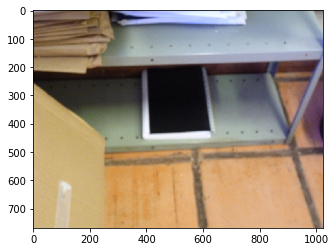

In [0]:
plt.imshow(x_images[1])

In [0]:
x_cv.shape

(15000, 64, 64, 3)

In [0]:
import cv2
#from google.colab.patches import cv2_imshow
x_t = []
for x in x_test:
    img = imread(x)
    img = img[:,:,:3]
    #print('Original Dimensions : ',img.shape)
    #scale_percent = 60 # percent of original size
    width = 64
    height =64
    dim = (width, height)
    # resize image
    resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
    #resized.tolist()
    x_t.append(resized)
#print('Resized Dimensions : ',resized.shape)

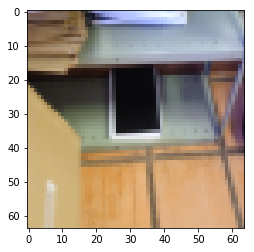

In [0]:
plt.imshow(x_t[1])

In [0]:
x_test = np.array(x_t)

In [0]:
#normalise the test data
x_test = x_test/255

##evaluation

Precision score: 0.6701453926873258
Recall score: 0.6701333333333334
F1 score: 0.6700775817917359
[[4894 2546]
 [2402 5158]]
Plot of Confusion Matrix


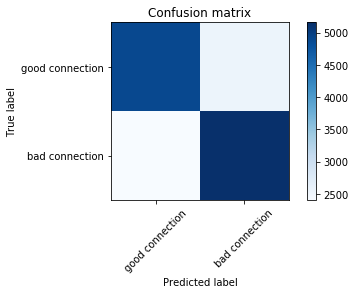

              precision    recall  f1-score   support

           0       0.67      0.66      0.66      7440
           1       0.67      0.68      0.68      7560

   micro avg       0.67      0.67      0.67     15000
   macro avg       0.67      0.67      0.67     15000
weighted avg       0.67      0.67      0.67     15000



In [0]:
y_pred_cnn = cnn_model.predict_classes(x_cv)
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
from sklearn import svm, datasets
score = metrics.precision_score(y_cv,y_pred_cnn, average= "weighted")
print("Precision score: {}".format(score))
score = metrics.recall_score(y_cv, y_pred_cnn, average= "weighted")
print("Recall score: {}".format(score))
score_lr1 = metrics.f1_score(y_cv, y_pred_cnn, average= "weighted")
print("F1 score: {}".format(score_lr1))
#score = metrics.log_loss(y_true, pred2) #this was not working was showing y_true & y_pred both contain different classes 3 , 2.
#print("Log loss score: {}".format(score))
cm = confusion_matrix(y_cv,y_pred_cnn)
print(cm)
print('Plot of Confusion Matrix')
plt.figure()
plot_confusion_matrix(cm,['good connection','bad connection'])
plt.show()
print(classification_report(y_cv,y_pred_cnn))

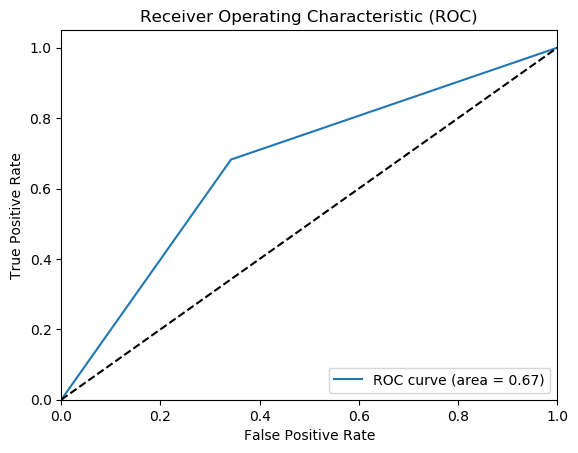

In [0]:
plot_roc(y_pred_cnn,y_cv)

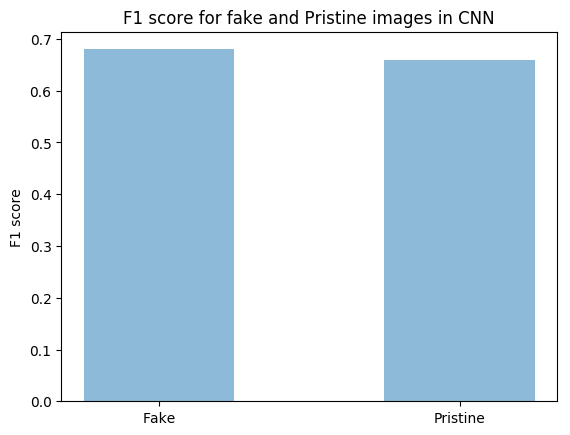

In [0]:
import matplotlib.pyplot as plt; plt.rcdefaults()
import numpy as np
import matplotlib.pyplot as plt
 
objects = ('Fake', 'Pristine')
y_pos = np.arange(len(objects))
performance = [0.68,0.66]
 
plt.bar(y_pos, performance, align='center', alpha=0.5,width=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('F1 score')
plt.title('F1 score for fake and Pristine images in CNN')
 
plt.show()

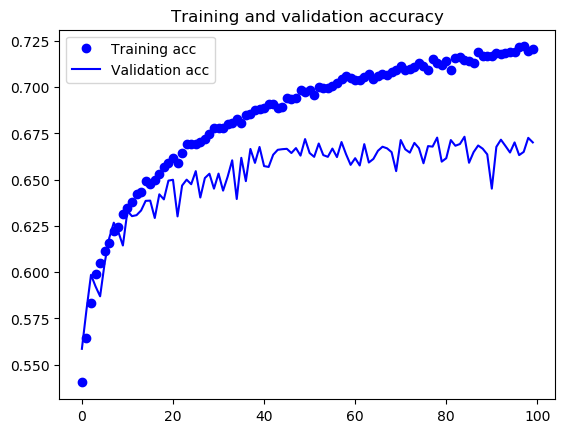

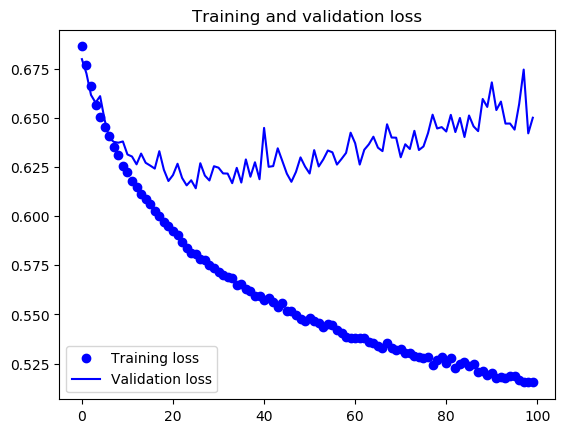

In [0]:
import matplotlib.pyplot as plt
from keras.models import load_model

#history=load_model(image_path+'keras_cnn_model.hdf5')
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

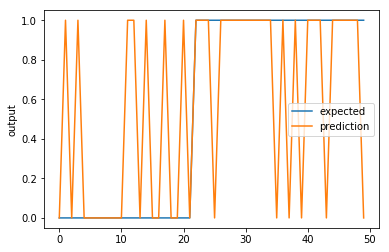

In [0]:
pred = [x for [x] in y_pred_cnn]
chart_regression(pred[0:50],y_cv[0:50])

In [0]:
#TRANSFER LEARNING
score_lr1

0.7694690273340432

In [0]:
#CNN
score_lr2

0.6700775817917359

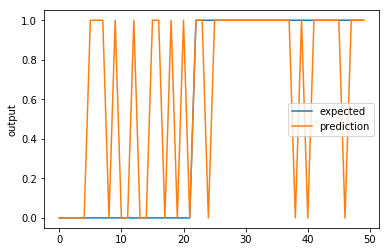

In [0]:
pred = [x for [x] in y_pred_cnn]
chart_regression(pred[0:50],y_cv[0:50])

In [0]:
model = load_model(fine_tuned_model_adam_weights.hdf5)

#Transfer Learning

In [0]:
import keras
from keras.models import load_model, Sequential
from keras.layers import Dense, Flatten
from keras.applications import VGG16
from keras import optimizers

vgg_model=VGG16(weights='imagenet', include_top=False, input_shape=(64,64,3))

model_aug=Sequential()
model_aug.add(vgg_model)

top_model=Sequential()
top_model.add(Flatten(input_shape=(2, 2, 512)))
#model_aug.add(Dropout(0.3))
top_model.add(Dense(64, activation='relu'))
	
top_model.add(Dense(1, activation='sigmoid'))
#top_model.load_weights('top_model_full_data_custom_lr_weights.h5')

model_aug.add(top_model)
	

for layer in model_aug.layers[0].layers[:17]:
	layer.trainable=False

model_aug.compile(loss='binary_crossentropy', optimizer=optimizers.Adam(lr=1e-6), metrics=['accuracy'])

print(model_aug.summary())

model_aug.fit(x_train, y_train, epochs=100, batch_size=32, validation_data=(x_cv, y_cv), verbose=1)
model_aug.save_weights('fine_tuned_model_adam_ex1.hdf5')
with open(image_path+'model_architecture_ex1.json', 'w') as f:
    f.write(model_aug.to_json())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 2, 2, 512)         14714688  
_________________________________________________________________
sequential_31 (Sequential)   (None, 1)                 131201    
Total params: 14,845,889
Trainable params: 2,491,009
Non-trainable params: 12,354,880
_________________________________________________________________
None
Train on 50000 samples, validate on 15000 samples
Epoch 1/100
50000/50000 [==============================] - 47s 938us/step - loss: 0.6774 - acc: 0.5634 - val_loss: 0.6648 - val_acc: 0.6015
Epoch 2/100
50000/50000 [==============================] - 46s 914us/step - loss: 0.6582 - acc: 0.6076 - val_loss: 0.6512 - val_acc: 0.6237
Epoch 3/100
50000/50000 [==============================] - 46s 918us/step - loss: 0.6463 - acc: 0.6243 - val_loss: 0.6417 - val_acc: 0.6289
Epoch 4/100
50000/50000 [==================

In [0]:
from keras.models import model_from_json
json_file = open(image_path+'model_architecture_ex1.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights("fine_tuned_model_adam_ex1.hdf5")

Precision score: 0.7695344242598015
Recall score: 0.7694666666666666
F1 score: 0.7694690273340432
[[5759 1681]
 [1777 5783]]
Plot of Confusion Matrix


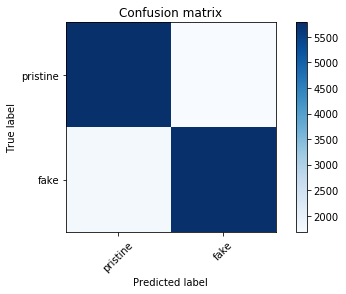

              precision    recall  f1-score   support

           0       0.76      0.77      0.77      7440
           1       0.77      0.76      0.77      7560

   micro avg       0.77      0.77      0.77     15000
   macro avg       0.77      0.77      0.77     15000
weighted avg       0.77      0.77      0.77     15000



In [0]:
y_pred_cnn = loaded_model.predict_classes(x_cv)
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
from sklearn import svm, datasets
score = metrics.precision_score(y_cv,y_pred_cnn, average= "weighted")
print("Precision score: {}".format(score))
score = metrics.recall_score(y_cv, y_pred_cnn, average= "weighted")
print("Recall score: {}".format(score))
score_lr1 = metrics.f1_score(y_cv, y_pred_cnn, average= "weighted")
print("F1 score: {}".format(score_lr1))
#score = metrics.log_loss(y_true, pred2) #this was not working was showing y_true & y_pred both contain different classes 3 , 2.
#print("Log loss score: {}".format(score))
cm = confusion_matrix(y_cv,y_pred_cnn)
print(cm)
print('Plot of Confusion Matrix')
plt.figure()
plot_confusion_matrix(cm,['pristine','fake'])
plt.show()
print(classification_report(y_cv,y_pred_cnn))

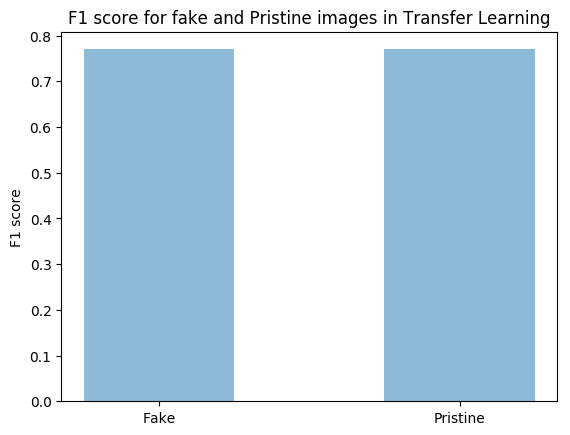

In [0]:
import matplotlib.pyplot as plt; plt.rcdefaults()
import numpy as np
import matplotlib.pyplot as plt
 
objects = ('Fake', 'Pristine')
y_pos = np.arange(len(objects))
performance = [0.77,0.77]
 
plt.bar(y_pos, performance, align='center', alpha=0.5,width=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('F1 score')
plt.title('F1 score for fake and Pristine images in Transfer Learning')
 
plt.show()

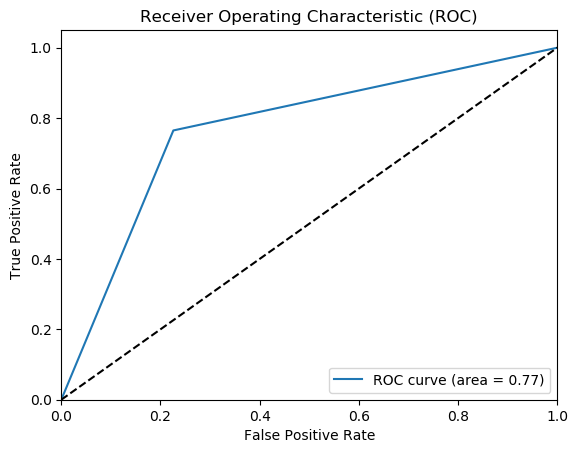

In [0]:
plot_roc(y_pred_cnn,y_cv)

#Model Comparison

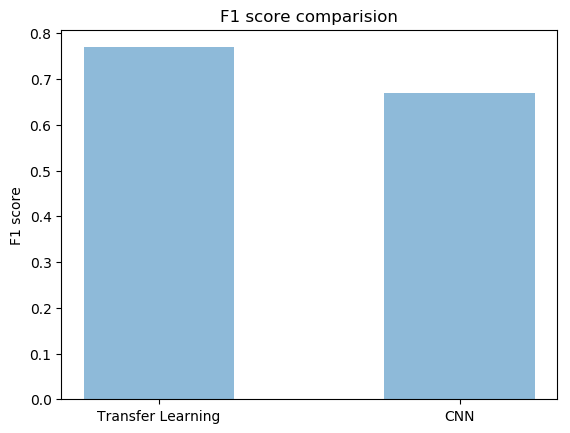

In [0]:
import matplotlib.pyplot as plt; plt.rcdefaults()
import numpy as np
import matplotlib.pyplot as plt
 
objects = ('Transfer Learning', 'CNN')
y_pos = np.arange(len(objects))
performance = [score_lr1,score_lr2]
 
plt.bar(y_pos, performance, align='center', alpha=0.5,width=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('F1 score')
plt.title('F1 score comparision')
 
plt.show()

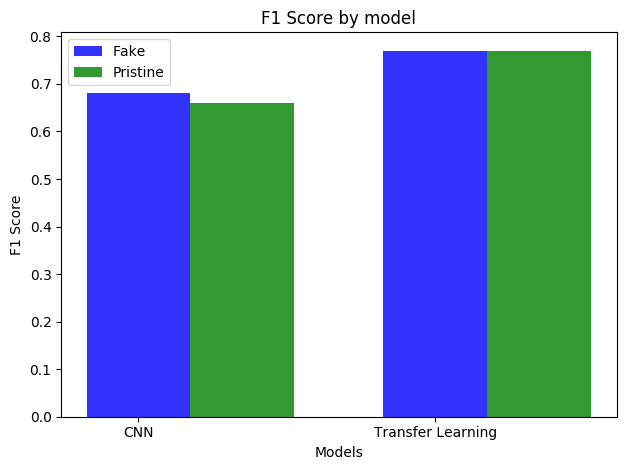

In [0]:
import numpy as np
import matplotlib.pyplot as plt
 
# data to plot
n_groups = 2
f = (0.68,0.77 )
p = (0.66, 0.77)
 
# create plot
fig, ax = plt.subplots()
index = np.arange(n_groups)
bar_width = 0.35
opacity = 0.8
 
rects1 = plt.bar(index, f, bar_width,
alpha=opacity,
color='b',
label='Fake')
 
rects2 = plt.bar(index + bar_width, p, bar_width,
alpha=opacity,
color='g',
label='Pristine')
 
plt.xlabel('Models')
plt.ylabel('F1 Score')
plt.title('F1 Score by model')
plt.xticks(index, ('CNN', 'Transfer Learning'))
plt.legend()
 
plt.tight_layout()
plt.show()

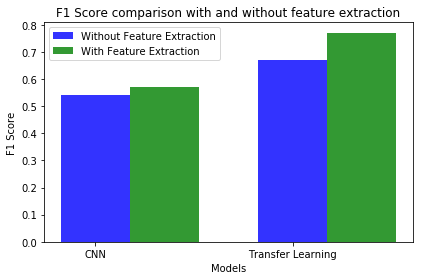

In [0]:
import numpy as np
import matplotlib.pyplot as plt
 
# data to plot
n_groups = 2
f = (0.5395,0.67)
p = (0.5692, 0.77)
 
# create plot
fig, ax = plt.subplots()
index = np.arange(n_groups)
bar_width = 0.35
opacity = 0.8
 
rects1 = plt.bar(index, f, bar_width,
alpha=opacity,
color='b',
label='Without Feature Extraction')
 
rects2 = plt.bar(index + bar_width, p, bar_width,
alpha=opacity,
color='g',
label='With Feature Extraction')
 
plt.xlabel('Models')
plt.ylabel('F1 Score')
plt.title('F1 Score comparison with and without feature extraction')
plt.xticks(index, ('CNN', 'Transfer Learning'))
plt.legend()
 
plt.tight_layout()
plt.show()

#Test 3 new images

In [0]:
np.save('Data/x_train.npy',x_train)
np.save('Data/y_train.npy',y_train)
np.save('Data/x_cv.npy',x_cv)
np.save('Data/y_cv.npy',y_cv)
np.save('Data/x_test.npy',x_test)
np.save('Data/y_test.npy',y_test)

In [0]:
x_test

array([[[[0.21568627, 0.23921569, 0.1254902 ],
         [0.16862745, 0.22352941, 0.11372549],
         [0.21960784, 0.28627451, 0.16862745],
         ...,
         [0.56078431, 0.61568627, 0.30980392],
         [0.47058824, 0.45490196, 0.33333333],
         [0.4745098 , 0.45098039, 0.30588235]],

        [[0.18431373, 0.23137255, 0.10196078],
         [0.13333333, 0.15686275, 0.11372549],
         [0.16862745, 0.22352941, 0.1372549 ],
         ...,
         [0.50196078, 0.49019608, 0.31764706],
         [0.46666667, 0.4745098 , 0.29411765],
         [0.56078431, 0.56078431, 0.3372549 ]],

        [[0.15686275, 0.17254902, 0.10196078],
         [0.16862745, 0.20392157, 0.11372549],
         [0.23137255, 0.28235294, 0.09803922],
         ...,
         [0.38039216, 0.39607843, 0.23529412],
         [0.47843137, 0.46666667, 0.29019608],
         [0.50196078, 0.47843137, 0.32156863]],

        ...,

        [[0.49019608, 0.47058824, 0.36862745],
         [0.42352941, 0.36078431, 0.26666667]

In [0]:
y_test

array([1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1,
       1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0,
       0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1,
       1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1,
       0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0,
       0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 1, 1, 1, 0])

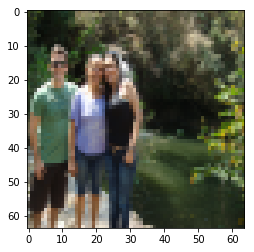

In [0]:
plt.imshow(x_test[0])

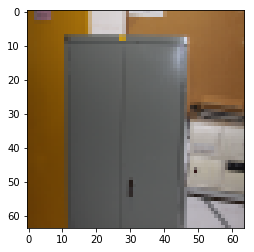

In [0]:
plt.imshow(x_test[3])

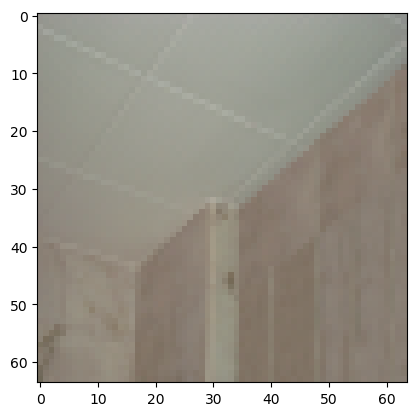

In [0]:
plt.imshow(x_test[46])

In [0]:
ex1 = (x_test[0]).reshape(1,64,64,3)
pred_cnn_ex1 =  cnn_model.predict_classes(ex1)
ex2 = (x_test[3]).reshape(1,64,64,3)
pred_cnn_ex2 =  cnn_model.predict_classes(ex2)
ex6 = (x_test[46]).reshape(1,64,64,3)
pred_cnn_ex6 =  cnn_model.predict_classes(ex6)

In [0]:
pred_ex1 = loaded_model.predict_classes(ex1)
pred_ex2 = loaded_model.predict_classes(ex2)
pred_ex6 = loaded_model.predict_classes(ex6)

In [0]:
pred_ex1 #1

array([[0]])

In [0]:
pred_ex2 #0

array([[0]])

In [0]:
pred_ex6 #1

array([[1]])

In [0]:
y_test

array([1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1,
       1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0,
       0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1,
       1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1,
       0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0,
       0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 1, 1, 1, 0])